In [1]:
import sqlite3
import pandas as pd
from sqlalchemy import create_engine

In [2]:
csv_database = create_engine('sqlite:///code_database.db')

In [3]:
chunk_size=500000
batch_no=1
file_path = 'C:\\Users\\cherrychan9898\\Downloads\\ORDATA_2023_05_10_17_14\\ORDATA_2023_05_10_17_14.csv'
for chunk in pd.read_csv(file_path,chunksize=chunk_size,iterator=True):
    chunk.to_sql('chunk_sql',csv_database, if_exists='append')
    batch_no+=1
    print('index: {}'.format(batch_no))

index: 2
index: 3
index: 4
index: 5
index: 6
index: 7
index: 8
index: 9
index: 10
index: 11
index: 12
index: 13
index: 14
index: 15
index: 16
index: 17
index: 18
index: 19
index: 20
index: 21
index: 22
index: 23
index: 24
index: 25
index: 26
index: 27
index: 28
index: 29
index: 30
index: 31
index: 32
index: 33
index: 34
index: 35
index: 36
index: 37
index: 38
index: 39
index: 40
index: 41
index: 42
index: 43
index: 44
index: 45
index: 46
index: 47
index: 48
index: 49
index: 50
index: 51


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_41336\3035973738.py:4: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in pd.read_csv(file_path,chunksize=chunk_size,iterator=True):


index: 52


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_41336\3035973738.py:4: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in pd.read_csv(file_path,chunksize=chunk_size,iterator=True):


index: 53
index: 54
index: 55
index: 56
index: 57
index: 58


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_41336\3035973738.py:4: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in pd.read_csv(file_path,chunksize=chunk_size,iterator=True):


index: 59


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_41336\3035973738.py:4: DtypeWarning: Columns (8,12) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in pd.read_csv(file_path,chunksize=chunk_size,iterator=True):


index: 60
index: 61
index: 62
index: 63
index: 64


In [7]:
import sqlite3
import pandas as pd

# Establish a connection to the SQLite database
connection = sqlite3.connect('code_database.db')

# Execute the SQL query to count the total number of rows
count_query = "SELECT COUNT(*) AS total_rows FROM chunk_sql"
result = pd.read_sql_query(count_query, connection)

# Get the total number of rows
total_rows = result['total_rows'].iloc[0]

# Print the total number of rows
print("Total rows:", total_rows)

# Close the database connection
connection.close()

Total rows: 31099849


In [178]:
connection = sqlite3.connect('code_database.db')
query = "PRAGMA table_info(chunk_sql)"
column_info = pd.read_sql_query(query, connection)
columns = column_info['name']

print(columns)
connection.close()

0           index
1     checkout id
2           store
3       converted
4      order name
5        currency
6           value
7           event
8            when
9        customer
10           step
11           type
12        value.1
13           skus
14           code
15     currency.1
16     product id
17     variant id
18    Unnamed: 17
Name: name, dtype: object


this method looks stupid:

In [176]:
connection = sqlite3.connect('code_database.db')

# Retrieve the column names of the 'chunk_sql' table
query = "PRAGMA table_info(chunk_sql)"
cursor = connection.execute(query)
column_names = [column[1] for column in cursor.fetchall()]

# Print the column names
print("Column names of 'chunk_sql' table:")
for column_name in column_names:
    print(column_name)

# Close the database connection
connection.close()

Column names of 'chunk_sql' table:
index
checkout id
store
converted
order name
currency
value
event
when
customer
step
type
value.1
skus
code
currency.1
product id
variant id
Unnamed: 17


In [11]:
connection = sqlite3.connect('code_database.db')
query = "SELECT * FROM chunk_sql LIMIT 500"

first_chunk = pd.read_sql_query(query, connection)

print('Head rows for the first chunk:')
print(first_chunk.head())

Head rows for the first chunk:
   index                       checkout id    store  converted order name  \
0      0  bd73c723490e33afe7b5dd9158310518  store_0        NaN       None   
1      1  bd73c723490e33afe7b5dd9158310518  store_0        NaN       None   
2      2  bd73c723490e33afe7b5dd9158310518  store_0        NaN       None   
3      3  bd73c723490e33afe7b5dd9158310518  store_0        NaN       None   
4      4  bd73c723490e33afe7b5dd9158310518  store_0        NaN       None   

  currency  value          event  \
0     None    NaN  checkout_load   
1     None    NaN  checkout_load   
2     None    NaN  checkout_load   
3     None    NaN  checkout_load   
4     None    NaN  checkout_load   

                                                when customer  \
0  Sun Jan 01 2023 00:04:25 GMT+0000 (Greenwich M...     None   
1  Sun Jan 01 2023 00:04:25 GMT+0000 (Greenwich M...     None   
2  Sun Jan 01 2023 00:04:55 GMT+0000 (Greenwich M...       c0   
3  Sun Jan 01 2023 00:04:55 G

In [12]:
import time
connection = sqlite3.connect('code_database.db')
# SQL query to count and group events
query = "SELECT event, COUNT(*) AS count FROM chunk_sql GROUP BY event"

# Start the timer
start_time = time.time()

# Execute the SQL query and retrieve the results as a DataFrame
event_counts = pd.read_sql_query(query, connection)

# End the timer
end_time = time.time()

# Calculate the runtime
runtime = end_time - start_time

# Display the first few rows
print(event_counts.head())

# Display the runtime
print("Runtime:", runtime, "seconds")
connection.close()

                  event     count
0               add_gwp        52
1         checkout_load  28579915
2           failed_code    362779
3  generate_rescue_code    101196
4             good_code    729618
Runtime: 120.824866771698 seconds


In [15]:
print (event_counts.sum())

event    add_gwpcheckout_loadfailed_codegenerate_rescue...
count                                             31099849
dtype: object


In [1]:
print(event_counts)

NameError: name 'event_counts' is not defined

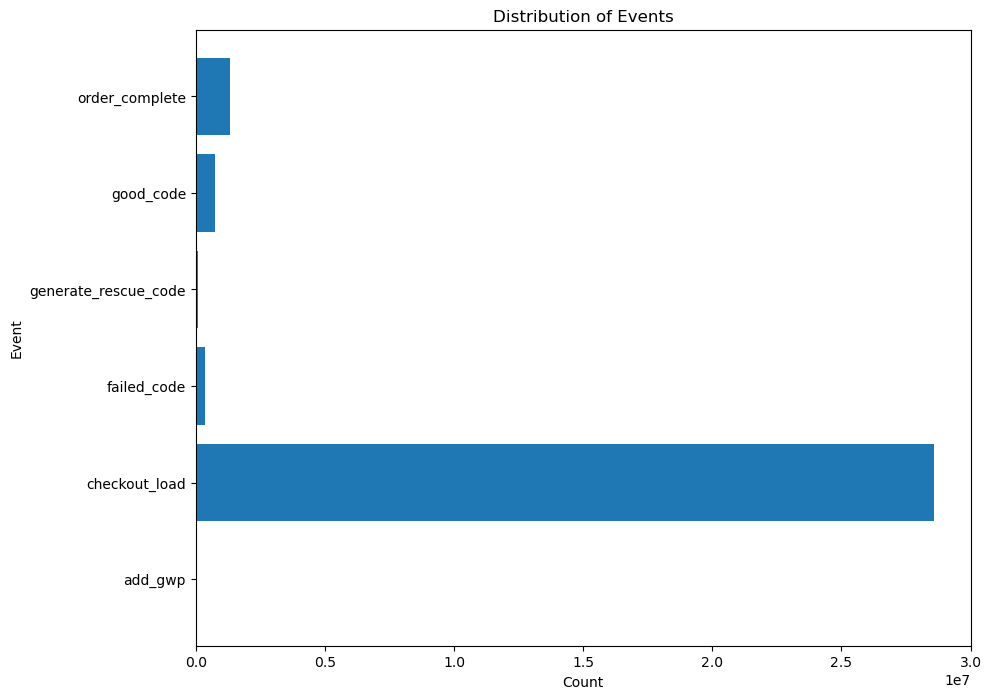

In [19]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'event_counts' DataFrame contains 'event' and 'count' columns

plt.figure(figsize=(10, 8))
plt.barh(event_counts['event'], event_counts['count'])
plt.xlabel('Count')
plt.ylabel('Event')
plt.title('Distribution of Events')
plt.show()


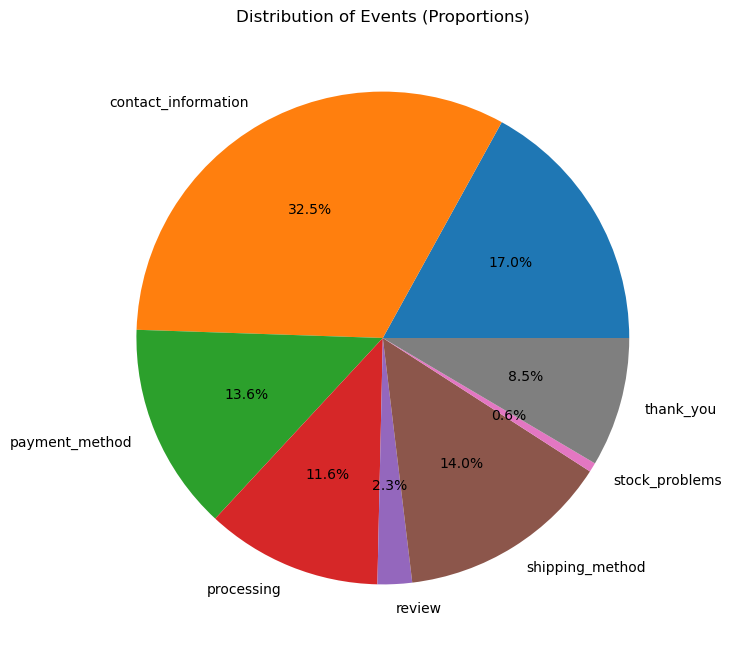

In [33]:
import pandas as pd
import matplotlib.pyplot as plt

total_count = event_counts['count'].sum()
event_counts['proportion'] = event_counts['count'] / total_count

plt.figure(figsize=(8, 8))
plt.pie(event_counts['proportion'], labels=event_counts['step'], autopct='%1.1f%%')
plt.title('Distribution of Events (Proportions)')
plt.show()


In [21]:
import pandas as pd
import sqlite3

# Establish a connection to the database
connection = sqlite3.connect('code_database.db')

# SQL query to select rows where event is 'add_gwp'
query = "SELECT * FROM chunk_sql WHERE event = 'add_gwp'"

# Execute the SQL query and retrieve the results as a DataFrame
selected_rows = pd.read_sql_query(query, connection)

# Display the selected rows
print(selected_rows)

# Close the database connection
connection.close()


       index                       checkout id     store  converted  \
0   21778587  cde418bd1c411c6d7ae44676ddc4239f  store_29        NaN   
1   21778595  cde418bd1c411c6d7ae44676ddc4239f  store_29        NaN   
2   21779171  266b5a60226a4baa92d0d0a6d85611b3  store_29        1.0   
3   21779270  64abd6f4e9386e32acc1ffa5dfbc6963  store_29        1.0   
4   21779282  64abd6f4e9386e32acc1ffa5dfbc6963  store_29        1.0   
5   21779363  133c84e7bf667c29c553575dceacf558  store_29        1.0   
6   21780041  2c651799c5ffa01f505e86dd1ca35ea6  store_29        NaN   
7   21780237  666e155ce8b742eb1250b2ce416f31af  store_29        NaN   
8   21780247  c944f1f020e5a4e2c553d23125ba75a2  store_29        NaN   
9   21780256  a309b47927dc79dcb46166b078d5eb4b  store_29        NaN   
10  21781388  7e6f4b3d709a6dc043b667b823a5f513  store_29        NaN   
11  21781687  a0b92764a779c3adcbdb084f7878a03b  store_29        1.0   
12  21781781  fc5693fdcb91bc5a6b0148b9a0b64e72  store_29        1.0   
13  21

In [72]:
import time
connection = sqlite3.connect('code_database.db')
# SQL query to count and group events
query = "SELECT step, COUNT(*) AS count FROM chunk_sql GROUP BY step"

# Start the timer
start_time = time.time()

# Execute the SQL query and retrieve the results as a DataFrame
step_counts = pd.read_sql_query(query, connection)

# End the timer
end_time = time.time()

# Calculate the runtime
runtime = end_time - start_time

# Display the first few rows
print(step_counts.head(10))

# Display the runtime
print("Runtime:", runtime, "seconds")
connection.close()

                  step     count
0                 None   5282120
1  contact_information  10102425
2       payment_method   4237857
3           processing   3592918
4               review    702901
5      shipping_method   4348912
6       stock_problems    190337
7            thank_you   2642379
Runtime: 77.8005428314209 seconds


In [102]:
step_counts['proportion'] = step_counts['count'] / step_counts['count'].sum()
print (step_counts.head(10))

                  step     count  proportion
1  contact_information  10102425    0.324838
0                 None   5282120    0.169844
5      shipping_method   4348912    0.139837
2       payment_method   4237857    0.136266
3           processing   3592918    0.115528
7            thank_you   2642379    0.084964
4               review    702901    0.022601
6       stock_problems    190337    0.006120


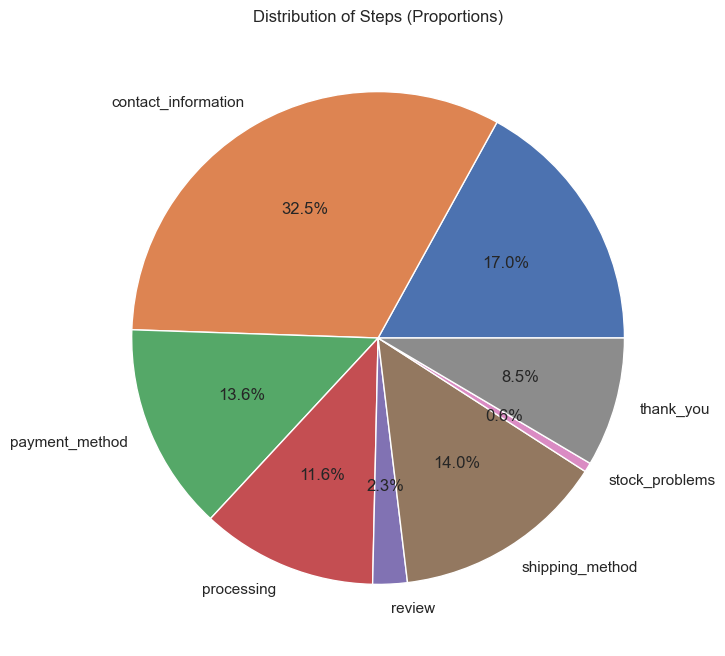

In [89]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'step_counts' DataFrame contains 'step' and 'count' columns
total_count = step_counts['count'].sum()
step_counts['proportion'] = step_counts['count'] / total_count


plt.figure(figsize=(8, 8))
plt.pie(step_counts['proportion'], labels=step_counts['step'], autopct='%1.1f%%')
plt.title('Distribution of Steps (Proportions)')
plt.show()


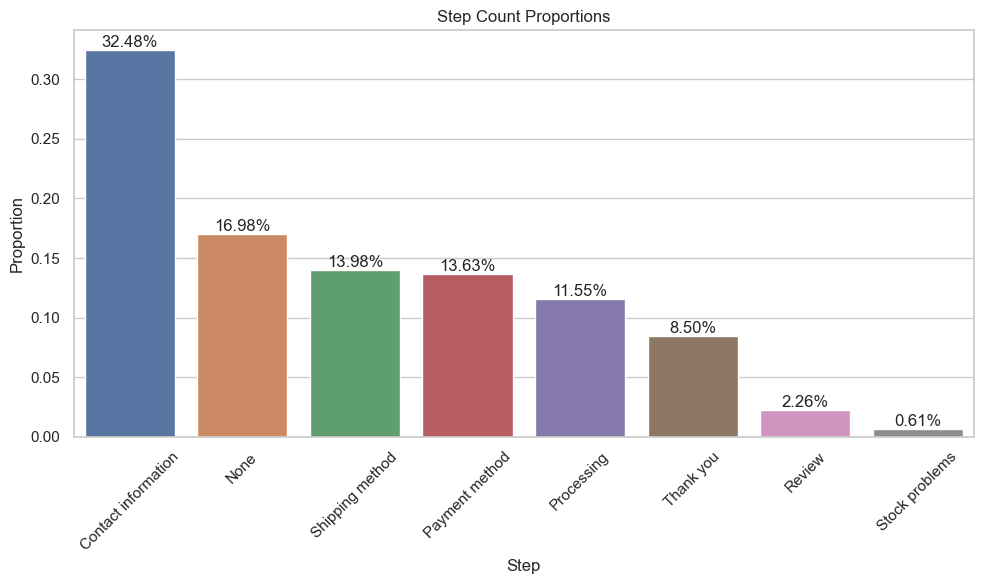

In [114]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Create the DataFrame
data = {
    'step': ['Contact information', 'None', 'Shipping method', 'Payment method', 'Processing', 'Thank you', 'Review', 'Stock problems'],
    'count': [10102425, 5282120, 4348912, 4237857, 3592918, 2642379, 702901, 190337],
    'proportion': [0.324838, 0.169844, 0.139837, 0.136266, 0.115528, 0.084964, 0.022601, 0.006120]
}
df = pd.DataFrame(data)

# Sort the DataFrame by count in descending order
df = df.sort_values('count', ascending=False)

# Plot the data
plt.figure(figsize=(10, 6))
sns.barplot(x='step', y='proportion', data=df)
plt.xlabel('Step')
plt.ylabel('Proportion')
plt.title('Step Count Proportions')
plt.xticks(rotation=45)

# Add proportion labels on top of each bar
for index, row in df.iterrows():
    plt.text(index, row['proportion'], f"{row['proportion']:.2%}", ha='center', va='bottom')

# Display the plot
plt.tight_layout()
plt.show()


In [142]:
# Establish a connection to the SQLite database
connection = sqlite3.connect('code_database.db')

# SQL query to find all TRUE values in 'converted' column and group by 'event'
query = '''
SELECT *
FROM chunk_sql
WHERE converted = TRUE AND event = 'good_code'
'''

# Execute the SQL query and retrieve the results as a DataFrame
converted_good_code = pd.read_sql_query(query, connection)

# Print the number of rows in the result
num_converted_good_code = converted_good_code.shape[0]
print("Number of rows:", num_converted_good_code)

# Display the result DataFrame
print(converted_good_code.head(3))

# Close the database connection
connection.close()


Number of rows: 378872
   index                       checkout id    store  converted order name  \
0    316  d03a9a3a5d8d02f436c95478f8166bca  store_0          1      #7625   
1    322  d03a9a3a5d8d02f436c95478f8166bca  store_0          1      #7625   
2    379  49fc0f497c324c86c5acafeb272e2e75  store_0          1      #7627   

  currency  value      event  \
0      USD   69.0  good_code   
1      USD   69.0  good_code   
2      USD  115.2  good_code   

                                                when customer  step  type  \
0  Sun Jan 01 2023 18:57:00 GMT+0000 (Greenwich M...     None  None  None   
1  Sun Jan 01 2023 18:57:32 GMT+0000 (Greenwich M...      c32  None  None   
2  Sun Jan 01 2023 23:19:35 GMT+0000 (Greenwich M...      c36  None  None   

   value.1  skus   code currency.1 product id variant id Unnamed: 17  
0     69.0  AB02  NEW15        USD       None       None        None  
1     69.0  AB02   None        USD       None       None        None  
2    115.2  AB08 

In [143]:
# Establish a connection to the SQLite database
connection = sqlite3.connect('code_database.db')

# SQL query to find all TRUE values in 'converted' column and group by 'event'
query = '''
SELECT *
FROM chunk_sql
WHERE converted IS NULL AND event = 'good_code'
'''

# Execute the SQL query and retrieve the results as a DataFrame
converted_null_good_code = pd.read_sql_query(query, connection)

# Print the number of rows in the result
num_converted_null_good_code = converted_null_good_code.shape[0]
print("Number of rows:", num_converted_null_good_code)

# Display the result DataFrame
print(converted_null_good_code.head(3))

# Close the database connection
connection.close()

Number of rows: 350746
   index                       checkout id    store converted order name  \
0    171  bb52e8da8c23dc2484b6339aa366de9a  store_0      None       None   
1    418  ce016a8fc68673ce53f8924b37b43aac  store_0      None       None   
2    435  1370680c08c9cb93170c06e22175d32b  store_0      None       None   

  currency value      event  \
0     None  None  good_code   
1     None  None  good_code   
2     None  None  good_code   

                                                when customer  step  type  \
0  Sun Jan 01 2023 09:57:33 GMT+0000 (Greenwich M...     None  None  None   
1  Mon Jan 02 2023 02:26:31 GMT+0000 (Greenwich M...     None  None  None   
2  Mon Jan 02 2023 03:15:52 GMT+0000 (Greenwich M...     None  None  None   

   value.1  skus                 code currency.1 product id variant id  \
0    102.6  AB14  3TZA-Y2G0-MAUM-MNZJ        USD       None       None   
1     59.0  Ab13  44MY-JY3W-NMNY-NMJD        USD       None       None   
2    114.0  AB03

In [145]:
print (num_converted_good_code/num_converted_null_good_code)

1.0801890826980207


In [125]:
import sqlite3
import pandas as pd
import time

# Establish a connection to the SQLite database
connection = sqlite3.connect('code_database.db')

# SQL query to calculate the ratio of converted = TRUE AND event = 'failed_code' over converted = nan AND event = 'good_code'
query = '''
SELECT *
FROM chunk_sql
WHERE converted = TRUE AND event = 'failed_code'
'''

# Start the timer
start_time = time.time()

# Execute the SQL query and retrieve the result as a DataFrame
ratio_data = pd.read_sql_query(query, connection)

# End the timer
end_time = time.time()

# Calculate the runtime
runtime = end_time - start_time

# Display the result
print(ratio_data)

# Display the runtime
print("Runtime:", runtime, "seconds")

# Close the database connection
connection.close()


           index                       checkout id     store  converted  \
0            376  49fc0f497c324c86c5acafeb272e2e75   store_0          1   
1            785  6a6e5553b84384c7fdfc25008db5bffc   store_0          1   
2            924  b84b01287cbd61982f3a66a63d92616d   store_0          1   
3            955  49cdaec1c29019cf3f4f17985e9c4688   store_0          1   
4            957  49cdaec1c29019cf3f4f17985e9c4688   store_0          1   
...          ...                               ...       ...        ...   
149425  31097898  b3d242b06d97391dc882f9fdcdda0bd1  store_63          1   
149426  31098092  e7b90061db92aca3bdd098c4097e169b  store_63          1   
149427  31098161  93aff90a1bea6067a9c5eac5dd54fb4e  store_63          1   
149428  31098163  93aff90a1bea6067a9c5eac5dd54fb4e  store_63          1   
149429  31098593  a8cfc4517fe78e77b8bf6ae349689835  store_63          1   

       order name currency   value        event  \
0           #7627      USD  115.20  failed_code 

In [126]:
import sqlite3
import pandas as pd
import time

# Establish a connection to the SQLite database
connection = sqlite3.connect('code_database.db')

# SQL query to calculate the ratio of converted = TRUE AND event = 'failed_code' over converted = nan AND event = 'good_code'
query = '''
SELECT *
FROM chunk_sql
WHERE converted IS NULL AND event = 'failed_code'
'''

# Start the timer
start_time = time.time()

# Execute the SQL query and retrieve the result as a DataFrame
ratio_data = pd.read_sql_query(query, connection)

# End the timer
end_time = time.time()

# Calculate the runtime
runtime = end_time - start_time

# Display the result
print(ratio_data)

# Display the runtime
print("Runtime:", runtime, "seconds")

# Close the database connection
connection.close()


           index                       checkout id     store converted  \
0            168  bb52e8da8c23dc2484b6339aa366de9a   store_0      None   
1            174  bb52e8da8c23dc2484b6339aa366de9a   store_0      None   
2            410  ce016a8fc68673ce53f8924b37b43aac   store_0      None   
3            415  ce016a8fc68673ce53f8924b37b43aac   store_0      None   
4            432  1370680c08c9cb93170c06e22175d32b   store_0      None   
...          ...                               ...       ...       ...   
213344  31098684  efe18b83e5ad887b2bb93984c24f2843  store_63      None   
213345  31098690  efe18b83e5ad887b2bb93984c24f2843  store_63      None   
213346  31098765  ca147a71ae3cb6c08ce1465e50620f5f  store_63      None   
213347  31099401  ac78898d8ea0a19b3b07272ec9b3f38d  store_63      None   
213348  31099403  ac78898d8ea0a19b3b07272ec9b3f38d  store_63      None   

       order name currency value        event  \
0            None     None  None  failed_code   
1            

In [132]:
conversion_rate = 149430 / 213349
print('Conversion rate:', conversion_rate)

Conversion rate: 0.7004016892509456


In [161]:
connection = sqlite3.connect('code_database.db')

# SQL query to count the number of unique checkout_id values
query = '''
SELECT COUNT(DISTINCT "checkout id") AS unique_checkout_ids
FROM chunk_sql
'''

# Execute the SQL query and retrieve the result as a DataFrame
unique_checkout_ids = pd.read_sql_query(query, connection)

# Display the result
print(unique_checkout_ids)

# Close the database connection
connection.close()


   unique_checkout_ids
0              2592971


In [162]:
connection = sqlite3.connect('code_database.db')

# SQL query to count the number of duplicate checkout_id values in the 'checkout id' column
query = '''
SELECT COUNT(*) - COUNT(DISTINCT "checkout id") AS duplicate_checkout_ids
FROM chunk_sql
'''

# Execute the SQL query and retrieve the result as a DataFrame
duplicate_checkout_ids = pd.read_sql_query(query, connection)

# Print the result
print(duplicate_checkout_ids.head())

# Close the database connection
connection.close()

   duplicate_checkout_ids
0                28506878


In [160]:
print(2592971+28506878)

31099849


In [14]:
import sqlite3
import pandas as pd

# Establish a connection to the SQLite database
connection = sqlite3.connect('code_database.db')

# Define the specific row index or condition
row_index = 18  # Replace with the desired row index or use a specific condition

# SQL query to select the specific row
query = f'''
SELECT *
FROM chunk_sql
LIMIT 1 OFFSET {row_index}
'''

# Execute the SQL query and retrieve the result as a DataFrame
selected_row1 = pd.read_sql_query(query, connection)

# Check if 'value' is equal to 'value.1'
is_equal = selected_row1['value'].iloc[0] == selected_row1['value.1'].iloc[0]

# Print the selected row and the equality result
print("Selected Row:")
print(selected_row1)
print("Is 'value' equal to 'value.1'?")
print(is_equal)

# Close the database connection
connection.close()

Selected Row:
   index                       checkout id    store  converted order name  \
0     18  44edbd9a904fe714d5b33ababb5266fd  store_0          1      #7591   

  currency  value          event  \
0      USD   45.0  checkout_load   

                                                when customer  \
0  Sun Jan 01 2023 00:17:54 GMT+0000 (Greenwich M...     None   

                  step       type  value.1  skus  code currency.1 product id  \
0  contact_information  page:load     45.0  AB01  None       None       None   

  variant id Unnamed: 17  
0       None        None  
Is 'value' equal to 'value.1'?
True


why is checkout id null wtf

In [36]:
connection = sqlite3.connect('code_database.db')

# Retrieve the column names of the table
query = "PRAGMA table_info(chunk_sql)"
column_info = pd.read_sql_query(query, connection)
columns = column_info['name']
# Calculate the total number of null values for each column
null_counts = {}
for column in columns:
    print(column)
    if column == "checkout id":
        column = "`checkout id`"
        query_nulls = f"SELECT COUNT(*) FROM chunk_sql WHERE {column} IS NULL"
        cursor_nulls = connection.execute(query_nulls)
        null_count = cursor_nulls.fetchone()[0]
        null_counts[column] = null_count

# Print the null counts for each column
for column, count in null_counts.items():
    print(f"{column}: {count} null values")

# Close the database connection
connection.close()


index
checkout id
store
converted
order name
currency
value
event
when
customer
step
type
value.1
skus
code
currency.1
product id
variant id
Unnamed: 17
`checkout id`: 15857 null values


In [171]:
# Establish a connection to the SQLite database
connection = sqlite3.connect('code_database.db')

# Define the specific checkout id value
checkout_id_value = '44edbd9a904fe714d5b33ababb5266fd'

# SQL query to select rows with checkout id = checkout_id_value
query = f'''
SELECT *
FROM chunk_sql
WHERE `checkout id` = '{checkout_id_value}'
'''

# Execute the SQL query and retrieve the result as a DataFrame
selected_rows = pd.read_sql_query(query, connection)

# Print the selected rows
print(selected_rows)

# Close the database connection
connection.close()

    index                       checkout id    store  converted order name  \
0      18  44edbd9a904fe714d5b33ababb5266fd  store_0          1      #7591   
1      19  44edbd9a904fe714d5b33ababb5266fd  store_0          1      #7591   
2      20  44edbd9a904fe714d5b33ababb5266fd  store_0          1      #7591   
3      21  44edbd9a904fe714d5b33ababb5266fd  store_0          1      #7591   
4      22  44edbd9a904fe714d5b33ababb5266fd  store_0          1      #7591   
5      23  44edbd9a904fe714d5b33ababb5266fd  store_0          1      #7591   
6      24  44edbd9a904fe714d5b33ababb5266fd  store_0          1      #7591   
7      25  44edbd9a904fe714d5b33ababb5266fd  store_0          1      #7591   
8      26  44edbd9a904fe714d5b33ababb5266fd  store_0          1      #7591   
9      27  44edbd9a904fe714d5b33ababb5266fd  store_0          1      #7591   
10     28  44edbd9a904fe714d5b33ababb5266fd  store_0          1      #7591   
11     29  44edbd9a904fe714d5b33ababb5266fd  store_0          1 

In [17]:
import sqlite3
import pandas as pd
# Establish a connection to the SQLite database
connection = sqlite3.connect('code_database.db')


# SQL query to select rows with checkout id = checkout_id_value
query = f'''
SELECT *
FROM chunk_sql
WHERE `checkout id` IS NULL
'''

# Execute the SQL query and retrieve the result as a DataFrame
selected_rows_null = pd.read_sql_query(query, connection)

# Print the selected rows
print(selected_rows_null)

# Close the database connection
connection.close()

          index checkout id     store  converted order name currency  value  \
0        462421        None   store_2        NaN       None     None    NaN   
1        462422        None   store_2        NaN       None     None    NaN   
2        462423        None   store_2        NaN       None     None    NaN   
3        462424        None   store_2        NaN       None     None    NaN   
4        462425        None   store_2        NaN       None     None    NaN   
...         ...         ...       ...        ...        ...      ...    ...   
15852  25920636        None  store_43        NaN       None     None    NaN   
15853  25920637        None  store_43        NaN       None     None    NaN   
15854  25920638        None  store_43        NaN       None     None    NaN   
15855  26671738        None  store_45        NaN       None     None    NaN   
15856  26671739        None  store_45        NaN       None     None    NaN   

               event                               

In [20]:
#id null and converted null
null_count = selected_rows_null['converted'].isnull().sum()

print("For selected_rows_null, Number of NULL values in the 'converted' column:", null_count)
print(selected_rows_null)

For selected_rows_null, Number of NULL values in the 'converted' column: 583
          index checkout id     store  converted order name currency  value  \
0        462421        None   store_2        NaN       None     None    NaN   
1        462422        None   store_2        NaN       None     None    NaN   
2        462423        None   store_2        NaN       None     None    NaN   
3        462424        None   store_2        NaN       None     None    NaN   
4        462425        None   store_2        NaN       None     None    NaN   
...         ...         ...       ...        ...        ...      ...    ...   
15852  25920636        None  store_43        NaN       None     None    NaN   
15853  25920637        None  store_43        NaN       None     None    NaN   
15854  25920638        None  store_43        NaN       None     None    NaN   
15855  26671738        None  store_45        NaN       None     None    NaN   
15856  26671739        None  store_45        NaN      

In [10]:
non_null_count = selected_rows_null['converted'].notnull().sum()
print("Number of non NULL values in the 'converted' column:", non_null_count)

Number of non NULL values in the 'converted' column: 15274


In [40]:
# Establish a connection to the SQLite database
connection = sqlite3.connect('code_database.db')

# Define the SQL query
query = '''
SELECT *
FROM chunk_sql
WHERE `checkout id` IS NULL AND converted = TRUE
'''

# Execute the SQL query and retrieve the results as a DataFrame
results1 = pd.read_sql_query(query, connection)

# Print the results
print(results1)

# Close the database connection
connection.close()


          index checkout id     store  converted   order name currency  value  \
0       4123900        None   store_5          1  ALNC442539S      USD  75.37   
1       4123901        None   store_5          1  ALNC442539S      USD  75.37   
2       4123902        None   store_5          1  ALNC442539S      USD  75.37   
3       4123903        None   store_5          1  ALNC442539S      USD  75.37   
4       4123904        None   store_5          1  ALNC442539S      USD  75.37   
...         ...         ...       ...        ...          ...      ...    ...   
15269  22269438        None  store_31          1       #63357      GBP  39.09   
15270  22269439        None  store_31          1       #63357      GBP  39.09   
15271  22269440        None  store_31          1       #63357      GBP  39.09   
15272  22269441        None  store_31          1       #63357      GBP  39.09   
15273  22269442        None  store_31          1       #63357      GBP  39.09   

               event       

In [14]:
print(selected_rows_null.head(30))

      index checkout id    store  converted   order name currency  value  \
0    462421        None  store_2        NaN         None     None    NaN   
1    462422        None  store_2        NaN         None     None    NaN   
2    462423        None  store_2        NaN         None     None    NaN   
3    462424        None  store_2        NaN         None     None    NaN   
4    462425        None  store_2        NaN         None     None    NaN   
5    462426        None  store_2        NaN         None     None    NaN   
6    462427        None  store_2        NaN         None     None    NaN   
7    462428        None  store_2        NaN         None     None    NaN   
8    462429        None  store_2        NaN         None     None    NaN   
9    462430        None  store_2        NaN         None     None    NaN   
10   462431        None  store_2        NaN         None     None    NaN   
11   462432        None  store_2        NaN         None     None    NaN   
12   462433 

In [39]:
connection = sqlite3.connect('code_database.db')

# Define the SQL query
query = '''
SELECT event, COUNT(*) AS count
FROM chunk_sql
WHERE `checkout id` IS NULL AND converted IS NULL
GROUP BY event
'''

# Execute the SQL query and retrieve the results as a DataFrame
id_converted_null_event = pd.read_sql_query(query, connection)

# Print the results
print(id_converted_null_event)

# Close the database connection
connection.close()


           event  count
0  checkout_load    583


In [2]:
import sqlite3
import pandas as pd
connection = sqlite3.connect('code_database.db')
# SQL query to select duplicate rows based on 'order name' column
query = "SELECT * FROM chunk_sql WHERE 'order name' IN (SELECT 'order name' FROM chunk_sql GROUP BY 'order name' HAVING COUNT(*) > 1) LIMIT 5000"

# Execute the SQL query and retrieve the duplicate rows as a DataFrame
duplicate_rows = pd.read_sql_query(query, connection)

# Display the duplicate rows
print(duplicate_rows)
connection.close()

      index                       checkout id    store  converted order name  \
0         0  bd73c723490e33afe7b5dd9158310518  store_0        NaN       None   
1         1  bd73c723490e33afe7b5dd9158310518  store_0        NaN       None   
2         2  bd73c723490e33afe7b5dd9158310518  store_0        NaN       None   
3         3  bd73c723490e33afe7b5dd9158310518  store_0        NaN       None   
4         4  bd73c723490e33afe7b5dd9158310518  store_0        NaN       None   
...     ...                               ...      ...        ...        ...   
4995   4995  f481535ceab4252ff4fd66b3049e2ea7  store_0        NaN       None   
4996   4996  f481535ceab4252ff4fd66b3049e2ea7  store_0        NaN       None   
4997   4997  f481535ceab4252ff4fd66b3049e2ea7  store_0        NaN       None   
4998   4998  f481535ceab4252ff4fd66b3049e2ea7  store_0        NaN       None   
4999   4999  f481535ceab4252ff4fd66b3049e2ea7  store_0        NaN       None   

     currency  value          event  \


In [12]:
connection = sqlite3.connect('code_database.db')
# SQL query to select duplicate rows based on 'order name' column, ignoring NULL values
query = "SELECT * FROM chunk_sql WHERE 'order name' IS NOT 'None' AND 'order name' IN (SELECT 'order name' FROM chunk_sql WHERE 'order name' IS NOT NULL GROUP BY 'order name' HAVING COUNT(*) > 1)"

cursor = connection.cursor()
cursor.execute(query)

chunk_size = 500000
while True:
    chunk = cursor.fetchmany(chunk_size)
    if not chunk:
        break

    # Process the chunk of rows here
    for row in chunk:
        print(row)

cursor.close()

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(4496467, '7d67e0a0d9f81db147b11b3421e79cc8', 'store_6', 1, '#1156025', 'GBP', 85.0, 'checkout_load', 'Wed Jan 11 2023 18:40:57 GMT+0000 (Greenwich Mean Time)', None, 'contact_information', 'load', 100.0, 'ARNE-12623,ARNE-9413,ARNE-6027', None, None, None, None, None)
(4496468, '7d67e0a0d9f81db147b11b3421e79cc8', 'store_6', 1, '#1156025', 'GBP', 85.0, 'checkout_load', 'Wed Jan 11 2023 18:41:24 GMT+0000 (Greenwich Mean Time)', None, 'contact_information', 'page:load', 100.0, 'ARNE-12623,ARNE-9413,ARNE-6027', None, None, None, None, None)
(4496469, '7d67e0a0d9f81db147b11b3421e79cc8', 'store_6', 1, '#1156025', 'GBP', 85.0, 'checkout_load', 'Wed Jan 11 2023 18:41:24 GMT+0000 (Greenwich Mean Time)', None, 'contact_information', 'load', 100.0, 'ARNE-12623,ARNE-9413,ARNE-6027', None, None, None, None, None)
(4496470, '7d67e0a0d9f81db147b11b3421e79cc8', 'store_6', 1, '#1156025', 'GBP', 85.0, 'checkout_load', 'Wed Jan 11 2023 18:41:41 GMT+0000 (Greenwich Mean Time)', 'c190568', 'shipping_method

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(8992273, 'e6bb6ed8a00e03650e5b956ee83dc10d', 'store_10', 1, '#1040875', 'GBP', 15.95, 'checkout_load', 'Sun Jan 29 2023 07:46:32 GMT+0000 (Greenwich Mean Time)', 'c379069', 'thank_you', 'load', 15.95, None, None, None, None, None, None)
(8992274, 'e6bb6ed8a00e03650e5b956ee83dc10d', 'store_10', 1, '#1040875', 'GBP', 15.95, 'checkout_load', 'Tue Jan 31 2023 10:11:26 GMT+0000 (Greenwich Mean Time)', None, None, 'page:load', None, None, None, None, None, None, None)
(8992275, 'e6bb6ed8a00e03650e5b956ee83dc10d', 'store_10', 1, '#1040875', 'GBP', 15.95, 'checkout_load', 'Tue Jan 31 2023 10:11:27 GMT+0000 (Greenwich Mean Time)', None, None, 'load', None, None, None, None, None, None, None)
(8992276, '28e9e07693b1082445cdd19bb807c016', 'store_10', None, None, None, None, 'checkout_load', 'Sun Jan 29 2023 07:37:35 GMT+0000 (Greenwich Mean Time)', None, 'contact_information', 'page:load', 32.9, 'TEV0094,TEV0104', None, None, None, None, None)
(8992277, '28e9e07693b1082445cdd19bb807c016', 'store

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




(11990770, '0f7e0ca8b13a4b1889f5b3aca43cf544', 'store_10', 1, '#1176202', 'EUR', 54.95, 'checkout_load', 'Sun Apr 09 2023 20:51:24 GMT+0100 (British Summer Time)', None, 'contact_information', 'page:change', 35.9, 'TEV0389,TEV0149', None, None, None, None, None)
(11990771, '0f7e0ca8b13a4b1889f5b3aca43cf544', 'store_10', 1, '#1176202', 'EUR', 54.95, 'good_code', 'Sun Apr 09 2023 20:51:24 GMT+0100 (British Summer Time)', None, None, None, 35.9, 'TEV0389,TEV0149', 'FB40', 'EUR', None, None, None)
(11990772, '0f7e0ca8b13a4b1889f5b3aca43cf544', 'store_10', 1, '#1176202', 'EUR', 54.95, 'checkout_load', 'Sun Apr 09 2023 20:51:51 GMT+0100 (British Summer Time)', None, 'contact_information', 'page:change', 35.9, 'TEV0389,TEV0149', None, None, None, None, None)
(11990773, '0f7e0ca8b13a4b1889f5b3aca43cf544', 'store_10', 1, '#1176202', 'EUR', 54.95, 'good_code', 'Sun Apr 09 2023 20:51:51 GMT+0100 (British Summer Time)', None, None, None, 35.9, 'TEV0389,TEV0149', 'REORDER25', 'EUR', None, None, No

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(12998385, '941d3bfde18e2b3a038aa7cd1281324f', 'store_10', 1, '#1226363', 'GBP', 65.94, 'checkout_load', 'Tue May 09 2023 07:34:36 GMT+0100 (British Summer Time)', 'c559641', 'payment_method', 'load', 65.94, 'TEV0424,TEV0283', None, None, None, None, None)
(12998386, '941d3bfde18e2b3a038aa7cd1281324f', 'store_10', 1, '#1226363', 'GBP', 65.94, 'checkout_load', 'Tue May 09 2023 07:34:52 GMT+0100 (British Summer Time)', None, 'processing', 'page:load', 65.94, 'TEV0424,TEV0283', None, None, None, None, None)
(12998387, '941d3bfde18e2b3a038aa7cd1281324f', 'store_10', 1, '#1226363', 'GBP', 65.94, 'checkout_load', 'Tue May 09 2023 07:34:52 GMT+0100 (British Summer Time)', None, 'processing', 'load', 65.94, 'TEV0424,TEV0283', None, None, None, None, None)
(12998388, '941d3bfde18e2b3a038aa7cd1281324f', 'store_10', 1, '#1226363', 'GBP', 65.94, 'order_complete', '2023-05-09T07:34:54+01:00', 'c559641', None, None, None, None, None, None, None, None, None)
(12998389, '941d3bfde18e2b3a038aa7cd128132

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




(14996691, 'a8822b51a5d2dd8543abf03a814317a7', 'store_19', 1, 'UK1021325', 'GBP', 212.0, 'checkout_load', 'Wed Jan 04 2023 20:47:42 GMT+0000 (Greenwich Mean Time)', None, 'contact_information', 'page:load', 212.0, 'CL12783800210,CL12730000510,CL12730001710,CL12904600210', None, None, None, None, None)
(14996692, 'a8822b51a5d2dd8543abf03a814317a7', 'store_19', 1, 'UK1021325', 'GBP', 212.0, 'checkout_load', 'Wed Jan 04 2023 20:47:45 GMT+0000 (Greenwich Mean Time)', None, 'contact_information', 'load', 212.0, 'CL12783800210,CL12730000510,CL12730001710,CL12904600210', None, None, None, None, None)
(14996693, 'a8822b51a5d2dd8543abf03a814317a7', 'store_19', 1, 'UK1021325', 'GBP', 212.0, 'checkout_load', 'Wed Jan 04 2023 20:48:55 GMT+0000 (Greenwich Mean Time)', 'c654655', 'shipping_method', 'page:load', 212.0, 'CL12783800210,CL12730000510,CL12730001710,CL12904600210', None, None, None, None, None)
(14996694, 'a8822b51a5d2dd8543abf03a814317a7', 'store_19', 1, 'UK1021325', 'GBP', 212.0, 'chec

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(21496532, 'd749a330769fb9a3d06d0b49110b78e9', 'store_28', None, None, None, None, 'checkout_load', 'Wed Jan 11 2023 08:06:45 GMT+0000 (Greenwich Mean Time)', None, 'contact_information', 'page:load', 697.0, '68277MUMG1', None, None, None, None, None)
(21496533, 'd749a330769fb9a3d06d0b49110b78e9', 'store_28', None, None, None, None, 'checkout_load', 'Wed Jan 11 2023 08:06:47 GMT+0000 (Greenwich Mean Time)', None, 'contact_information', 'load', 697.0, '68277MUMG1', None, None, None, None, None)
(21496534, 'd749a330769fb9a3d06d0b49110b78e9', 'store_28', None, None, None, None, 'checkout_load', 'Wed Jan 11 2023 08:09:31 GMT+0000 (Greenwich Mean Time)', None, 'contact_information', 'page:change', 697.0, '68277MUMG1', None, None, None, None, None)
(21496535, 'd749a330769fb9a3d06d0b49110b78e9', 'store_28', None, None, None, None, 'good_code', 'Wed Jan 11 2023 08:09:31 GMT+0000 (Greenwich Mean Time)', None, None, None, 697.0, '68277MUMG1', None, 'THB', None, None, None)
(21496536, '767b86e26b

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(21993171, '604dc636c15033e113c8548cd4e819eb', 'store_30', 1, '#167342', 'GBP', 94.0, 'checkout_load', 'Sun Mar 05 2023 19:00:39 GMT+0000 (Greenwich Mean Time)', 'c940348', 'thank_you', 'load', 94.0, None, None, None, None, None, None)
(21993172, '8f00aa266ba170af0bfff504613114e7', 'store_30', 1, '#167343', 'GBP', 24.5, 'checkout_load', 'Sun Mar 05 2023 18:59:48 GMT+0000 (Greenwich Mean Time)', 'c249778', 'shipping_method', 'page:load', 24.5, None, None, None, None, None, None)
(21993173, '8f00aa266ba170af0bfff504613114e7', 'store_30', 1, '#167343', 'GBP', 24.5, 'checkout_load', 'Sun Mar 05 2023 18:59:48 GMT+0000 (Greenwich Mean Time)', 'c249778', 'shipping_method', 'load', 24.5, None, None, None, None, None, None)
(21993174, '8f00aa266ba170af0bfff504613114e7', 'store_30', 1, '#167343', 'GBP', 24.5, 'checkout_load', 'Sun Mar 05 2023 18:59:59 GMT+0000 (Greenwich Mean Time)', 'c249778', 'payment_method', 'page:load', 24.5, None, None, None, None, None, None)
(21993175, '8f00aa266ba170af0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(23498281, 'd11bce8ec31c1c1a143936060a0a4e72', 'store_34', None, None, None, None, 'checkout_load', 'Thu Feb 16 2023 22:14:55 GMT+0000 (Greenwich Mean Time)', 'c1007609', 'shipping_method', 'load', 70.0, 'PM-OS776ASHL', None, None, None, None, None)
(23498282, 'd11bce8ec31c1c1a143936060a0a4e72', 'store_34', None, None, None, None, 'checkout_load', 'Thu Feb 16 2023 22:16:00 GMT+0000 (Greenwich Mean Time)', 'c1007609', 'shipping_method', 'page:load', 70.0, 'PM-OS776ASHL', None, None, None, None, None)
(23498283, 'd11bce8ec31c1c1a143936060a0a4e72', 'store_34', None, None, None, None, 'checkout_load', 'Thu Feb 16 2023 22:16:00 GMT+0000 (Greenwich Mean Time)', 'c1007609', 'shipping_method', 'load', 70.0, 'PM-OS776ASHL', None, None, None, None, None)
(23498284, '9719d9e5b92a15cbcf29d0c1dc2c6212', 'store_34', None, None, None, None, 'checkout_load', 'Thu Feb 16 2023 22:14:40 GMT+0000 (Greenwich Mean Time)', None, 'contact_information', 'page:load', 204.0, None, None, None, None, None, None)
(

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(23998128, '93abb95187d4a1ea5aaca907da91787e', 'store_36', None, None, None, None, 'checkout_load', 'Wed Feb 01 2023 09:24:26 GMT+0000 (Greenwich Mean Time)', None, 'contact_information', 'page:change', 2918.0, '30302996,10104890', None, None, None, None, None)
(23998129, '93abb95187d4a1ea5aaca907da91787e', 'store_36', None, None, None, None, 'good_code', 'Wed Feb 01 2023 09:24:26 GMT+0000 (Greenwich Mean Time)', None, None, None, 2918.0, '30302996,10104890', '\n                    100% OFF WHEN YOU SPEND £419 (-£169.00)\n                  ', 'GBP', None, None, None)
(23998130, '93abb95187d4a1ea5aaca907da91787e', 'store_36', None, None, None, None, 'checkout_load', 'Wed Feb 01 2023 09:25:51 GMT+0000 (Greenwich Mean Time)', 'c1031229', 'shipping_method', 'page:load', 2918.0, '30302996,10104890', None, None, None, None, None)
(23998131, '93abb95187d4a1ea5aaca907da91787e', 'store_36', None, None, None, None, 'checkout_load', 'Wed Feb 01 2023 09:25:52 GMT+0000 (Greenwich Mean Time)', 'c103

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(24492848, 'bc2ad5b52e23ff4d0e9f2652ac5ed219', 'store_37', None, None, None, None, 'checkout_load', 'Sat Feb 25 2023 19:12:47 GMT+0000 (Greenwich Mean Time)', None, 'contact_information', 'load', 119.9, None, None, None, None, None, None)
(24492849, 'bc2ad5b52e23ff4d0e9f2652ac5ed219', 'store_37', None, None, None, None, 'checkout_load', 'Sat Feb 25 2023 19:13:22 GMT+0000 (Greenwich Mean Time)', 'c1053151', 'shipping_method', 'page:load', 119.9, None, None, None, None, None, None)
(24492850, 'bc2ad5b52e23ff4d0e9f2652ac5ed219', 'store_37', None, None, None, None, 'checkout_load', 'Sat Feb 25 2023 19:13:22 GMT+0000 (Greenwich Mean Time)', 'c1053151', 'shipping_method', 'load', 119.9, None, None, None, None, None, None)
(24492851, 'bc2ad5b52e23ff4d0e9f2652ac5ed219', 'store_37', None, None, None, None, 'checkout_load', 'Sat Feb 25 2023 19:13:24 GMT+0000 (Greenwich Mean Time)', 'c1053151', 'shipping_method', 'page:change', 119.9, None, None, None, None, None, None)
(24492852, 'bc2ad5b52e23ff

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(24998290, '9a6b0c4b1dae00ec0eb4bc34379a63c8', 'store_41', None, None, None, None, 'checkout_load', 'Wed Mar 08 2023 12:50:31 GMT+0000 (Greenwich Mean Time)', None, 'contact_information', 'load', 26.9, None, None, None, None, None, None)
(24998291, '9a6b0c4b1dae00ec0eb4bc34379a63c8', 'store_41', None, None, None, None, 'checkout_load', 'Wed Mar 08 2023 12:56:38 GMT+0000 (Greenwich Mean Time)', 'c1078230', 'contact_information', 'page:load', 26.9, None, None, None, None, None, None)
(24998292, '9a6b0c4b1dae00ec0eb4bc34379a63c8', 'store_41', None, None, None, None, 'checkout_load', 'Wed Mar 08 2023 12:56:44 GMT+0000 (Greenwich Mean Time)', 'c1078230', 'contact_information', 'load', 26.9, None, None, None, None, None, None)
(24998293, '9a6b0c4b1dae00ec0eb4bc34379a63c8', 'store_41', None, None, None, None, 'checkout_load', 'Wed Mar 08 2023 13:03:21 GMT+0000 (Greenwich Mean Time)', 'c1078231', 'shipping_method', 'page:load', 26.9, None, None, None, None, None, None)
(24998294, '9a6b0c4b1dae

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(26493586, '5b31a0b0b99d64e3e13306eeed7fdce0', 'store_44', None, None, None, None, 'checkout_load', 'Sun Mar 12 2023 13:32:53 GMT+0000 (Greenwich Mean Time)', None, 'contact_information', 'load', 120.0, 'DAPHNEMULTILEOPARD-2,WILLOWDRSGREEN-3,ZOEDRSBLSPT-2', None, None, None, None, None)
(26493587, '5b31a0b0b99d64e3e13306eeed7fdce0', 'store_44', None, None, None, None, 'checkout_load', 'Sun Mar 12 2023 13:33:19 GMT+0000 (Greenwich Mean Time)', 'c1157330', 'shipping_method', 'page:load', 120.0, 'DAPHNEMULTILEOPARD-2,WILLOWDRSGREEN-3,ZOEDRSBLSPT-2', None, None, None, None, None)
(26493588, '5b31a0b0b99d64e3e13306eeed7fdce0', 'store_44', None, None, None, None, 'checkout_load', 'Sun Mar 12 2023 13:33:19 GMT+0000 (Greenwich Mean Time)', 'c1157330', 'shipping_method', 'load', 120.0, 'DAPHNEMULTILEOPARD-2,WILLOWDRSGREEN-3,ZOEDRSBLSPT-2', None, None, None, None, None)
(26493589, '5b31a0b0b99d64e3e13306eeed7fdce0', 'store_44', None, None, None, None, 'checkout_load', 'Sun Mar 12 2023 13:33:28 G

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



KeyboardInterrupt: 

In [15]:
import sqlite3
import pandas as pd

# Establish a connection to the SQLite database
connection = sqlite3.connect('code_database.db')

# Define the SQL query
query = '''
SELECT DISTINCT `checkout id`
FROM chunk_sql
WHERE converted = TRUE
'''

# Execute the SQL query and retrieve the results as a DataFrame
cleaned_data = pd.read_sql_query(query, connection)

# Print the results
print(cleaned_data)

# Close the database connection
connection.close()


                              checkout id
0        44edbd9a904fe714d5b33ababb5266fd
1        af3bc673623dbcdfca771acb2e5b578f
2        0e06406ffe8ff81ad18c5d485f93568d
3        ad5ef91102436ae17c26ddfe54be5291
4        a563c69b44a3d807e329015da5f60ba7
...                                   ...
1134473  9fe5003d82673f1fb7d69784073d5c90
1134474  b0b984421652a0b21e3d28142cbca2db
1134475  d15f698729935a2d309761e3fcc17973
1134476  e22daf95f440595be15fbf6000ec900b
1134477  b4fc395a2d83308d2a84e8a698af9690

[1134478 rows x 1 columns]


In [16]:
print(2592971-1134478)

1458493


In [43]:
import pandas as pd
import sqlite3

# Connect to the original database
original_connection = sqlite3.connect('code_database.db')

# SQL query to select only the 'code' column
query = "SELECT * FROM chunk_sql WHERE code IS NOT NULL GROUP BY code"


# Read the 'code' column into a DataFrame
df = pd.read_sql_query(query, original_connection)

# Close the original database connection
original_connection.close()

print(df.head(20))

       index                       checkout id     store  converted  \
0    8373832  91ec508a0d92b3ccc71955e13392d337   store_8        NaN   
1   26789071  deacf451f85247ed71c86a27910084a9  store_46        NaN   
2   19190967  f20f341fbc458dbb1b2d04d331c0e8e9  store_20        NaN   
3    8458706  99d1868bc474a72f6c9077b373fafa3f   store_8        NaN   
4   23365589  0b2f856f08e5938fa590fa4ffd5f7c10  store_34        NaN   
5    9412173  e0478ec3f12aeb4b5705131fab41e04b  store_10        NaN   
6    8373839  91ec508a0d92b3ccc71955e13392d337   store_8        NaN   
7    8373836  91ec508a0d92b3ccc71955e13392d337   store_8        NaN   
8    6271677  1b4db7ce1e8690c41af9aad5dfe2969d   store_6        NaN   
9    8373829  91ec508a0d92b3ccc71955e13392d337   store_8        NaN   
10  24170084  75d80e8bd2233857bfea4885dea954aa  store_36        1.0   
11  23065375  6f79cedce4ec87b2c1197cf704de5b28  store_33        NaN   
12  22955782  7aa32fcd507313139a4b600f9792afc8  store_33        1.0   
13  23

In [42]:
num_rows = len(df)
print("Number of rows:", num_rows)

Number of rows: 1024159


## check if null

In [2]:
import sqlite3
import pandas as pd
# Connect to the database
connection = sqlite3.connect('code_database.db')

# SQL query to count the number of non-null values in 'checkout id'
query = "SELECT COUNT(*) AS non_null_count FROM chunk_sql WHERE 'checkout id' IS NOT NULL"

# Execute the query and retrieve the result as a DataFrame
non_null_id = pd.read_sql_query(query, connection)

# Get the non-null count from the result
non_null_count = non_null_id['non_null_count'].iloc[0]

# Print the non-null count
print("Number of non-null values in 'checkout id':", non_null_count)

# Close the connection
connection.close()

Number of non-null values in 'checkout id': 31099849


In [13]:
connection = sqlite3.connect('code_database.db')

# SQL query to select the row with the given index
query = "SELECT * FROM chunk_sql WHERE customer = 'c169604'"

# Execute the query and retrieve the row as a DataFrame
row = pd.read_sql_query(query, connection)

# Print the row
print(row)

     index checkout id    store  converted   order name currency  value  \
0  4124623        None  store_5          1  ALNC442539S      USD  75.37   
1  4124624        None  store_5          1  ALNC442539S      USD  75.37   
2  4124625        None  store_5          1  ALNC442539S      USD  75.37   

           event                                               when customer  \
0  checkout_load  Thu Apr 20 2023 17:56:23 GMT+0100 (British Sum...  c169604   
1  checkout_load  Thu Apr 20 2023 18:00:44 GMT+0100 (British Sum...  c169604   
2  checkout_load  Thu Apr 20 2023 18:00:44 GMT+0100 (British Sum...  c169604   

   step       type value.1  skus  code currency.1 product id variant id  \
0  None       load    None  None  None       None       None       None   
1  None       load    None  None  None       None       None       None   
2  None  page:load    None  None  None       None       None       None   

  Unnamed: 17  
0        None  
1        None  
2        None  


# Discount Code and Store

In [38]:
connection = sqlite3.connect('code_database.db')
query = "SELECT COUNT(DISTINCT store) AS store_count FROM chunk_sql"
df_store = pd.read_sql_query(query, connection)
store_count = df_store['store_count'].iloc[0]
print("Number of stores:", store_count)

Number of stores: 64


In [59]:
import pandas as pd
import sqlite3

# Connect to the original database
original_connection = sqlite3.connect('code_database.db')

# SQL query to select only the 'code' column
query = "SELECT store, GROUP_CONCAT(SUBSTR(code, 1, INSTR(code, '(') - 1) || SUBSTR(code, INSTR(code, ')') + 1)) AS cleaned_codes FROM chunk_sql WHERE code IS NOT NULL GROUP BY store"


# Read the 'code' column into a DataFrame
df1 = pd.read_sql_query(query, original_connection)

# Close the original database connection
original_connection.close()

print(df1.head())

      store                                      cleaned_codes
0   store_0  LAST22,3TZA-Y2G0-MAUM-MNZJ,LastChance22,NEW15,...
1   store_1  EARLY20,SKIN10,SKIN10,WELCOME10,Springfresh,47...
2  store_10  TEV20,TEV20,PAYDAY30,WHOLESALE35,TEV20,TEV20,T...
3  store_11  blkcrd637796b6a423,BLKCRD322CAA7EFB76 ,N10DWGP...
4  store_12  N10DWGPHVPNYZH ,blkcrdcdf5532206cc,REENG20V4TW...


In [65]:
df1_sorted = df1.sort_values(by='store', ascending=True)
print(df1_sorted.head(64))


       store                                      cleaned_codes
0    store_0  LAST22,3TZA-Y2G0-MAUM-MNZJ,LastChance22,NEW15,...
1    store_1  EARLY20,SKIN10,SKIN10,WELCOME10,Springfresh,47...
2   store_10  TEV20,TEV20,PAYDAY30,WHOLESALE35,TEV20,TEV20,T...
3   store_11  blkcrd637796b6a423,BLKCRD322CAA7EFB76 ,N10DWGP...
4   store_12  N10DWGPHVPNYZH ,blkcrdcdf5532206cc,REENG20V4TW...
..       ...                                                ...
59  store_62  X3C-GJC,FREE GOLD MEMBER GIFT ,BREYA20,BREYA20...
60  store_63  WB_BP_37AAE308A680,HOPESCOPE,CAMILLA20,CAMILLA...
61   store_7  A FREE GIFT FOR SPENDING £40+ ,VEGAN20 ,WINNER...
62   store_8  PAYDAY,PAYDAY,PAYDAY,PAYDAY,PAYDAY,PAYDAY,PAYD...
63   store_9  COMEBACK10,tspdeal,RETOUR10,VQ-AZZU,VQ-AUZZU,V...

[64 rows x 2 columns]


### Run start from here code IS NOT NULL AND event = 'good_code'
doesn't mean an order has been placed!!!!

In [116]:
import pandas as pd
import sqlite3

# Connect to the original database
original_connection = sqlite3.connect('code_database.db')

# SQL query to select only the 'code' column, when event is good code
query = "SELECT store, event, GROUP_CONCAT(SUBSTR(code, 1, INSTR(code, '(') - 1) || SUBSTR(code, INSTR(code, ')') + 1)) AS cleaned_codes FROM chunk_sql WHERE code IS NOT NULL AND event = 'good_code' GROUP BY store"

# Read the 'code' column into a DataFrame
df_good_code_by_store = pd.read_sql_query(query, original_connection)

# Close the original database connection
original_connection.close()

print(df_good_code_by_store.head(30))

       store      event                                      cleaned_codes
0    store_0  good_code  3TZA-Y2G0-MAUM-MNZJ,NEW15,44MY-JY3W-NMNY-NMJD,...
1    store_1  good_code  WELCOME10,WELCOME10,WELCOME10,2MU3-ZQYY-OD5U-M...
2   store_10  good_code  TEV20,TEV20,PAYDAY30,WHOLESALE35,TEV20,TEV20,T...
3   store_11  good_code  BLKCRD322CAA7EFB76 ,N10DWGPHVPNYZH ,N10DWGPHVP...
4   store_12  good_code  N10DWGPHVPNYZH ,blkcrdcdf5532206cc,BLKCRDA0712...
5   store_13  good_code  N10DWGPHVPNYZH ,AMRITPAL50,N10DWGPHVPNYZH ,MIC...
6   store_14  good_code  WELCOME10,WELCOME10,WELCOME10,TEAM15,TEAM15,WE...
7   store_15  good_code  UNI-578884-AU15,UNI-578884-AU15 ,CL57J0Q ,CL57...
8   store_16  good_code  NY2023 ,NY2023 ,NY2023 ,NY2023 ,NY2023 ,UNI-TM...
9   store_17  good_code  NY2023 ,NY2023 ,NY2023 ,NY2023 ,NY2023 ,NY2023...
10  store_18  good_code  CL57J0Q ,XYSH1HS5 ,XYSH1HS5 ,CL57J0Q ,CL57J0Q ...
11  store_19  good_code  NY2023 ,BL1622 ,CRESCUEMNYN-NDJ3-DXZA-UA0W ,BL...
12   store_2  good_code  

In [168]:
cleaned_codes_list = df_good_code_by_store[df_good_code_by_store['store'] == 'store_36']['cleaned_codes'].tolist()
print(cleaned_codes_list)

['\n                    40% OFF WHEN YOU SPEND £419 \n                  ,\n                    100% OFF WHEN YOU SPEND £419 \n                  ,AQ2UHW-D9WP4T,AQ2UHW-PSZ2Q6,\n                    40% OFF WHEN YOU SPEND £419 \n                  ,\n                    35% OFF WHEN YOU SPEND £419 \n                  ,\n                    40% OFF WHEN YOU SPEND £419 \n                  ,\n                    40% OFF WHEN YOU SPEND £419 \n                  ,\n                    40% OFF WHEN YOU SPEND £419 \n                  ,AQ2UHW-W563KF,\n                    25% OFF WHEN YOU SPEND £419 \n                  ,\n                    25% OFF WHEN YOU SPEND £419 \n                  ,AQ2UHW-9FFKX7,\n                    40% OFF WHEN YOU SPEND £419 \n                  ,AQ2UHW-CXC934,AQ2UHW-C4687K,AQ2UHW-99DP96,AQ2UHW-4R646B,\n                    40% OFF WHEN YOU SPEND £419 \n                  ,\n                    100% OFF WHEN YOU SPEND £419 \n                  ,\n                    100% OFF W

### find TOP 5 codes used in each store

In [117]:
df_good_code_by_store['cleaned_codes'] = df_good_code_by_store['cleaned_codes'].str.split(',')
df_exploded = df_good_code_by_store.explode('cleaned_codes')
code_counts = df_exploded.groupby(['store', 'cleaned_codes']).size().reset_index(name='count')
# Sort the code_counts DataFrame in descending order based on count
code_counts_sorted = code_counts.sort_values(by='count', ascending=False)

# Group the code_counts by store and select the top code for each store
top_codes_by_store = code_counts_sorted.groupby('store').head(5)

# Print the top codes in each store
print(top_codes_by_store)

          store             cleaned_codes  count
11065  store_10                     TEV20  39683
10936  store_10                  PAYDAY30  23895
1819   store_10                    LOVE25  13354
28816  store_19                 UKWEL15CJ  12479
79734  store_41  FREE NECK PAIN E-COURSE   11435
...         ...                       ...    ...
91235   store_5           WELCOME9KT3W9J8      3
91179  store_49               UNICORNFUEL      3
91194   store_5           AIRFLOWD8G4N2NV      3
91174  store_49                     LEO10      3
91254   store_5           WELCOMEX5WJMJWF      2

[315 rows x 3 columns]


In [65]:
import os
# Create the downloads folder if it doesn't exist
os.makedirs('downloads', exist_ok=True)

# Define the file path for the CSV file
file_path = os.path.join('downloads', 'top_5_code_by_store.csv')

# Save the DataFrame to the CSV file
top_codes_by_store.to_csv(file_path, index=False)

# Print the file path for reference
print(f"CSV file saved in: {file_path}")

CSV file saved in: downloads\top_5_code_by_store.csv


In [60]:
print(top_codes_by_store.sort_values(by='count').iloc[5:55])

           store             cleaned_codes  count
91453   store_51                 DAYONE10      23
52604   store_25                 WELCOME20     23
93275   store_57                 100% OFF      25
50650   store_21                 JUBILEE30     30
81468   store_45             HOTGIRLWALKOC     31
111162   store_9                COMEBACK10     32
78729   store_38      STARTER PACK SHAKER      34
81484   store_45                     SW20      35
93517   store_59                     BUY 1     35
79769   store_42  SPEND $249 AND SAVE 30%      35
52200   store_24          COUNTYDOWNUNDER      36
121      store_0                     NEW20     37
91162   store_49    5% OFF WHEN BUYING 2.      37
134      store_0                 SPRING15      48
111172   store_9                  SIGNUP10     48
61303   store_31                      GOAL     49
52243   store_24                    GCMAY      51
93296   store_57    FREE GOLD MEMBER GIFT      62
91857   store_54    5% OFF WHEN BUYING 2.      70


In [67]:
store_41_row = top_codes_by_store[top_codes_by_store['store'] == 'store_41']
print(store_41_row)

          store             cleaned_codes  count
79734  store_41  FREE NECK PAIN E-COURSE   11435
79727  store_41    15% OFF FOR 2 PILLOWS    4673
79729  store_41    15% OFF FOR 4 PILLOWS      48
79728  store_41    15% OFF FOR 3 PILLOWS      44
79757  store_41                 SPRING30      40


# ---end---

In [61]:
row_53 = top_codes_by_store.sort_values(by='count').iloc[53]
cleaned_codes_list = row_53['cleaned_codes']
print(cleaned_codes_list)

N10DWGPHVPNYZH 


In [62]:
df_good_code_by_store['cleaned_codes'] = df_good_code_by_store['cleaned_codes'].str.split(',')
df_exploded = df_good_code_by_store.explode('cleaned_codes')
code_counts = df_exploded.groupby(['store', 'cleaned_codes']).size().reset_index(name='count')
# Sort the code_counts DataFrame in descending order based on count
code_counts_sorted = code_counts.sort_values(by='count', ascending=False)

# Select the top 10 codes
top_10_codes = code_counts_sorted.head(10)

# Print the top 10 codes
print(top_10_codes)

Empty DataFrame
Columns: [store, cleaned_codes, count]
Index: []


In [6]:
import os
# Create the downloads folder if it doesn't exist
os.makedirs('downloads', exist_ok=True)

# Define the file path for the CSV file
file_path = os.path.join('downloads', 'good_code_store.csv')

# Save the DataFrame to the CSV file
df_good_code_by_store.to_csv(file_path, index=False)

# Print the file path for reference
print(f"CSV file saved in: {file_path}")

CSV file saved in: downloads\good_code_store.csv


In [11]:
import pandas as pd
import sqlite3

# Connect to the original database
original_connection = sqlite3.connect('code_database.db')

# select the "value" column and group by "store" where the "event" is "order_complete"
query = "SELECT store, value, SUM(value) AS total_value FROM chunk_sql WHERE event = 'order_complete' and currency = 'GBP' GROUP BY store"

# Read the 'code' column into a DataFrame
df_store_value_store = pd.read_sql_query(query, original_connection)

# Close the original database connection
original_connection.close()

print(df_store_value_store.head(10))

      store    value   total_value
0   store_1    29.00  5.587347e+05
1  store_10    24.95  7.244972e+06
2  store_13    30.00  4.225814e+05
3  store_14    20.99  1.820199e+05
4  store_19    85.00  1.886931e+07
5   store_2    79.00  1.002388e+07
6  store_20   531.00  1.022429e+06
7  store_21  1098.00  1.024259e+07
8  store_24    68.00  2.970506e+05
9  store_25    71.00  6.106316e+05


In [66]:
row_index = 0  # Replace with the desired row index

a_row = df1_sorted.loc[row_index]
print(a_row)

store                                                      store_0
cleaned_codes    LAST22,3TZA-Y2G0-MAUM-MNZJ,LastChance22,NEW15,...
Name: 0, dtype: object


In [4]:
import sqlite3
import pandas as pd
# Connect to the database
connection = sqlite3.connect('code_database.db')

# SQL query to count the number of non-null values in 'checkout id'
query = "SELECT COUNT(*) AS null_count FROM chunk_sql WHERE 'checkout id' IS NULL"

# Execute the query and retrieve the result as a DataFrame
null_id = pd.read_sql_query(query, connection)

# Get the non-null count from the result
null_count = null_id['null_count'].iloc[0]

# Print the non-null count
print("Number of null values in 'checkout id':", null_count)

# Close the connection
connection.close()

Number of null values in 'checkout id': 0


## General
filtered out null checkout id value

In [71]:
import sqlite3
import pandas as pd
# Connect to the database
connection = sqlite3.connect('code_database.db')

# SQL query to select rows where `checkout id` IS NULL
query = '''
SELECT *
FROM chunk_sql
WHERE `checkout id` IS NOT NULL
'''

id_null = pd.read_sql_query(query, connection)

# Print the selected rows
print(id_null)

# Close the database connection
connection.close()

             index                       checkout id     store  converted  \
0                0  bd73c723490e33afe7b5dd9158310518   store_0        NaN   
1                1  bd73c723490e33afe7b5dd9158310518   store_0        NaN   
2                2  bd73c723490e33afe7b5dd9158310518   store_0        NaN   
3                3  bd73c723490e33afe7b5dd9158310518   store_0        NaN   
4                4  bd73c723490e33afe7b5dd9158310518   store_0        NaN   
...            ...                               ...       ...        ...   
31083987  31099844  b4fc395a2d83308d2a84e8a698af9690  store_63        1.0   
31083988  31099845  b4fc395a2d83308d2a84e8a698af9690  store_63        1.0   
31083989  31099846  b4fc395a2d83308d2a84e8a698af9690  store_63        1.0   
31083990  31099847  b4fc395a2d83308d2a84e8a698af9690  store_63        1.0   
31083991  31099848  b4fc395a2d83308d2a84e8a698af9690  store_63        1.0   

         order name currency  value           event  \
0              None 

In [72]:
# Connect to a new database
new_connection = sqlite3.connect('new_code_database.db')

# Write the selected rows to the new database
id_null.to_sql('chunk_sql', new_connection, if_exists='replace', index=False)

# Close the new database connection
new_connection.close()

In [73]:
# Connect to the new database
connection = sqlite3.connect('new_code_database.db')

# SQL query to count the number of rows in the 'chunk_sql' table
query = "SELECT COUNT(*) FROM chunk_sql"

# Execute the query and fetch the result
cursor = connection.cursor()
cursor.execute(query)
row_count = cursor.fetchone()[0]

# Print the number of rows
print("Number of rows in the new database:", row_count)

# Close the database connection
connection.close()

Number of rows in the new database: 31083992


### only WHERE event = 'order_complete' are selected and put in df called order_complete_value_unique

In [5]:
import sqlite3
import pandas as pd
connection = sqlite3.connect('new_code_database.db')

# SQL query to select the row with the specified identifier
query = "SELECT COUNT(*) FROM chunk_sql WHERE event = 'order_complete'"

# Execute the query and fetch the result into a DataFrame
order_complete = pd.read_sql_query(query, connection)

# Print the selected row
print(order_complete)
# Close the database connection
connection.close()

   COUNT(*)
0   1326284


In [ ]:
##check weird pairs

In [347]:
import pandas as pd

# Step 1: Calculate the number of unique order names and unique IDs
unique_order_names = order_complete_value_id['order name'].nunique()
unique_ids = order_complete_value_id['checkout id'].nunique()

# Step 2: Compare the counts
if unique_order_names != unique_ids:
    # Step 3: Identify the pairs where the counts do not match
    order_name_counts = order_complete_value_id['order name'].value_counts()
    id_counts = order_complete_value_id['checkout id'].value_counts()

    # Create DataFrames for each set of weird pairs
    order_name_weird_pairs = []
    id_weird_pairs = []

    for order_name, count in order_name_counts.items():
        if count != id_counts.get(order_name, 0):
            order_name_weird_pairs.append((order_name, count, id_counts.get(order_name, 0)))
    
    for id_value, count in id_counts.items():
        if count != order_name_counts.get(id_value, 0):
            id_weird_pairs.append((id_value, count, order_name_counts.get(id_value, 0)))

    df_order_name_weird_pairs = pd.DataFrame(order_name_weird_pairs, columns=['order name', 'order name count', 'checkout id count'])
    df_id_weird_pairs = pd.DataFrame(id_weird_pairs, columns=['checkout id', 'checkout id count', 'order name count'])

    # Print the number of weird pairs
    num_order_name_weird_pairs = len(df_order_name_weird_pairs)
    num_id_weird_pairs = len(df_id_weird_pairs)

    print(f"Number of order name weird pairs: {num_order_name_weird_pairs}")
    print(f"Number of ID weird pairs: {num_id_weird_pairs}")

    # Print the first 20 order name weird pairs
    num_order_name_pairs_to_print = min(20, num_order_name_weird_pairs)
    print("Order name weird pairs:")
    print(df_order_name_weird_pairs.head(num_order_name_pairs_to_print))

    # Print the first 20 ID weird pairs
    num_id_pairs_to_print = min(20, num_id_weird_pairs)
    print("ID weird pairs:")
    print(df_id_weird_pairs.head(num_id_pairs_to_print))

else:
    print("Number of unique order names and unique IDs match.")


Number of order name weird pairs: 1047538
Number of ID weird pairs: 1134477
Order name weird pairs:
    order name  order name count  checkout id count
0     #1110372               194                  0
1       #60660                59                  0
2    UK1080304                36                  0
3    #DR205909                33                  0
4     #1076932                32                  0
5      #296045                28                  0
6       109602                27                  0
7      #259669                27                  0
8     #1156924                26                  0
9     #1193057                26                  0
10    #1218626                24                  0
11  #UKA789625                23                  0
12    749344IE                23                  0
13      106705                22                  0
14    #1245962                22                  0
15  #UKA790863                21                  0
16      108177  

In [23]:
connection = sqlite3.connect('new_code_database.db')

query = "SELECT * FROM chunk_sql WHERE `order name` = '#1218626' AND event = 'order_complete'"

rs = pd.read_sql_query(query, connection)

print(rs.head(5))

connection.close()

      index                       checkout id     store  converted order name  \
0   5699095  fda0de1e2e726cdb62894717352da051   store_6        1.0   #1218626   
1  12848090  0c85aed8f5be3b966aceb59900ca8029  store_10        1.0   #1218626   
2  12848091  0c85aed8f5be3b966aceb59900ca8029  store_10        1.0   #1218626   
3  12848096  0c85aed8f5be3b966aceb59900ca8029  store_10        1.0   #1218626   
4  12848099  0c85aed8f5be3b966aceb59900ca8029  store_10        1.0   #1218626   

  currency  value           event  \
0      GBP  30.00  order_complete   
1      GBP  15.95  order_complete   
2      GBP  15.95  order_complete   
3      GBP  15.95  order_complete   
4      GBP  15.95  order_complete   

                                                when customer  step  type  \
0  Sun Feb 26 2023 09:04:03 GMT+0000 (Greenwich M...  c228989  None  None   
1                          2023-05-04T09:35:40+01:00  c552205  None  None   
2  Thu May 04 2023 09:36:10 GMT+0100 (British Sum...     No

In [6]:
import sqlite3
import pandas as pd
connection = sqlite3.connect('new_code_database.db')

query = "SELECT value, `order name`, currency, `when` FROM chunk_sql WHERE event = 'order_complete'"

order_complete_value = pd.read_sql_query(query, connection)

print(order_complete_value)

connection.close()

          value order name currency  \
0         45.00      #7591      USD   
1         45.00      #7594      USD   
2         75.00      #7595      USD   
3        114.00      #7601      USD   
4         45.00      #7602      USD   
...         ...        ...      ...   
1326279  147.96  #834575US      USD   
1326280   49.90  #834576US      USD   
1326281   63.48  #834577US      USD   
1326282   39.90  #834578US      USD   
1326283   51.96  #834579US      USD   

                                                      when  
0        Sun Jan 01 2023 00:21:49 GMT+0000 (Greenwich M...  
1        Sun Jan 01 2023 01:30:56 GMT+0000 (Greenwich M...  
2        Sun Jan 01 2023 01:45:48 GMT+0000 (Greenwich M...  
3        Sun Jan 01 2023 05:17:51 GMT+0000 (Greenwich M...  
4        Sun Jan 01 2023 14:46:21 GMT+0000 (Greenwich M...  
...                                                    ...  
1326279  Wed May 10 2023 17:49:07 GMT+0100 (British Sum...  
1326280  Wed May 10 2023 17:53:09 GMT+0100 

In [7]:
# Drop duplicate rows based on 'order name' and 'currency'
order_complete_value_unique = order_complete_value.drop_duplicates(subset=['order name'])

print(order_complete_value_unique)

          value order name currency  \
0         45.00      #7591      USD   
1         45.00      #7594      USD   
2         75.00      #7595      USD   
3        114.00      #7601      USD   
4         45.00      #7602      USD   
...         ...        ...      ...   
1326279  147.96  #834575US      USD   
1326280   49.90  #834576US      USD   
1326281   63.48  #834577US      USD   
1326282   39.90  #834578US      USD   
1326283   51.96  #834579US      USD   

                                                      when  
0        Sun Jan 01 2023 00:21:49 GMT+0000 (Greenwich M...  
1        Sun Jan 01 2023 01:30:56 GMT+0000 (Greenwich M...  
2        Sun Jan 01 2023 01:45:48 GMT+0000 (Greenwich M...  
3        Sun Jan 01 2023 05:17:51 GMT+0000 (Greenwich M...  
4        Sun Jan 01 2023 14:46:21 GMT+0000 (Greenwich M...  
...                                                    ...  
1326279  Wed May 10 2023 17:49:07 GMT+0100 (British Sum...  
1326280  Wed May 10 2023 17:53:09 GMT+0100 

In [8]:
# Print the unique values of the 'order name' column in order_complete_value dataframe
unique_order_names = order_complete_value['order name'].nunique()
print(unique_order_names)

1047538


In [345]:
unique_id = order_complete_value_id["checkout id"].nunique()
print(unique_id)

1134477


In [108]:
currency_counts = order_complete_value_unique['currency'].value_counts()
print(currency_counts.head(10))
total_count = currency_counts.sum()
print("Total Count:", total_count)
missing_values = order_complete_value_unique['currency'].isnull().sum()
print("Missing values:", missing_values)
print(1044560+2979)

GBP    733735
EUR    110127
USD    105696
AED     54012
AUD     32638
CAD      3313
SEK      1428
DKK      1143
CHF       745
NZD       144
Name: currency, dtype: int64
Total Count: 1044560
Missing values: 2979
1047539


In [10]:
total_value_gbp = order_complete_value_unique.loc[order_complete_value_unique['currency'] == 'GBP', 'value'].sum()
print("Total value (GBP):", total_value_gbp)

Total value (GBP): 103604336.33999999


In [8]:
unique_currencies = order_complete_value_unique['currency'].unique()
print("Unique currencies:", unique_currencies)

total_value_by_currency = order_complete_value_unique.groupby('currency')['value'].sum()
print("Total value by currency:")
print(total_value_by_currency)

Unique currencies: ['USD' 'GBP' 'EUR' 'CAD' 'AUD' 'NOK' 'NZD' 'AED' 'CHF' 'PHP' 'SAR' 'HKD'
 'BGN' 'IDR' 'SEK' 'VND' 'ISK' 'SGD' 'FKP' 'DKK' 'BZD' 'RON' 'HUF' 'QAR'
 'CZK' 'KES' 'PLN' 'RSD' 'ILS' 'MYR' 'BBD' 'NGN' 'THB' 'DOP' 'ANG' 'UAH'
 'CRC' 'JPY' 'KRW' 'LKR' 'ALL' 'AWG' 'INR' 'AMD' 'BAM' 'MXN' 'ZAR' 'GEL'
 'TRY' 'DZD' 'EGP' 'MAD' 'LBP' 'COP' 'AZN' 'HNL' 'CLP' 'KZT' 'TWD' 'PEN'
 'BRL' 'CNY' 'BND' 'MNT' 'RUB' 'MOP' None 'MUR' 'TTD' 'GYD' 'BDT' 'KYD'
 'XOF' 'GTQ' 'BSD' 'CVE' 'MKD' 'XPF' 'CDF' 'BOB']
Total value by currency:
currency
AED    42088834.42
ALL       77707.02
AMD      323200.00
ANG         967.32
AUD     6009622.37
          ...     
USD    13347608.48
VND    20730000.00
XOF       92307.00
XPF       12600.00
ZAR       58750.00
Name: value, Length: 79, dtype: float64


In [336]:
connection = sqlite3.connect('new_code_database.db')

query = "SELECT * FROM chunk_sql WHERE `checkout id` = '49cdaec1c29019cf3f4f17985e9c4688' AND event = 'order_complete'"

rs = pd.read_sql_query(query, connection)

print(rs)

connection.close()

   index                       checkout id    store  converted order name  \
0    977  49cdaec1c29019cf3f4f17985e9c4688  store_0        1.0      #7669   
1    979  49cdaec1c29019cf3f4f17985e9c4688  store_0        1.0      #7669   
2    983  49cdaec1c29019cf3f4f17985e9c4688  store_0        1.0      #7669   
3    986  49cdaec1c29019cf3f4f17985e9c4688  store_0        1.0      #7669   
4    988  49cdaec1c29019cf3f4f17985e9c4688  store_0        1.0      #7669   
5    991  49cdaec1c29019cf3f4f17985e9c4688  store_0        1.0      #7669   
6    994  49cdaec1c29019cf3f4f17985e9c4688  store_0        1.0      #7669   
7    997  49cdaec1c29019cf3f4f17985e9c4688  store_0        1.0      #7669   

  currency  value           event  \
0      USD   45.0  order_complete   
1      USD   45.0  order_complete   
2      USD   45.0  order_complete   
3      USD   45.0  order_complete   
4      USD   45.0  order_complete   
5      USD   45.0  order_complete   
6      USD   45.0  order_complete   
7      USD

In [172]:
connection = sqlite3.connect('new_code_database.db')

query = "SELECT * FROM chunk_sql WHERE `order name` = '#AL960624'"

rss = pd.read_sql_query(query, connection)

print(rss)

connection.close()

     index                       checkout id    store  converted order name  \
0   219710  a25147a3337aa723c51fd086ee2f8d57  store_2        1.0  #AL960624   
1   219711  a25147a3337aa723c51fd086ee2f8d57  store_2        1.0  #AL960624   
2   219712  a25147a3337aa723c51fd086ee2f8d57  store_2        1.0  #AL960624   
3   219713  a25147a3337aa723c51fd086ee2f8d57  store_2        1.0  #AL960624   
4   219714  a25147a3337aa723c51fd086ee2f8d57  store_2        1.0  #AL960624   
5   219715  a25147a3337aa723c51fd086ee2f8d57  store_2        1.0  #AL960624   
6   219716  a25147a3337aa723c51fd086ee2f8d57  store_2        1.0  #AL960624   
7   219717  a25147a3337aa723c51fd086ee2f8d57  store_2        1.0  #AL960624   
8   219718  a25147a3337aa723c51fd086ee2f8d57  store_2        1.0  #AL960624   
9   219719  a25147a3337aa723c51fd086ee2f8d57  store_2        1.0  #AL960624   
10  219720  a25147a3337aa723c51fd086ee2f8d57  store_2        1.0  #AL960624   
11  219721  a25147a3337aa723c51fd086ee2f8d57  store_

In [170]:
value_null_rows = order_complete_value_unique[order_complete_value_unique['value'] == 0]
print(value_null_rows)

         value order name currency  \
11707      0.0  #AL960624      GBP   
12578      0.0  #AL963292      GBP   
30362      0.0  #AL984817      GBP   
31750      0.0  #AL986964      GBP   
32242      0.0  #AL986770      GBP   
...        ...        ...      ...   
1216422    0.0   US184907      USD   
1216453    0.0   US184906      USD   
1216627    0.0   US185454      USD   
1216976    0.0   US185684      USD   
1223554    0.0    EU68183      EUR   

                                                      when  
11707    Thu Jan 12 2023 20:35:58 GMT+0000 (Greenwich M...  
12578    Sat Jan 14 2023 15:12:42 GMT+0000 (Greenwich M...  
30362    Wed Feb 01 2023 15:08:06 GMT+0000 (Greenwich M...  
31750    Fri Feb 03 2023 14:47:16 GMT+0000 (Greenwich M...  
32242    Sat Feb 04 2023 09:43:42 GMT+0000 (Greenwich M...  
...                                                    ...  
1216422                          2023-04-25T11:14:45-04:00  
1216453                          2023-04-25T10:59:31-04

In [16]:
print ('Currency Conversion Result:')
from forex_python.converter import CurrencyRates, RatesNotAvailableError

c = CurrencyRates()
base_currency = 'GBP'

for currency in unique_currencies:
    if currency != base_currency:
        original_values = total_value_by_currency.get(currency)
        if original_values is not None:
            try:
                converted_values = original_values * c.get_rate(currency, base_currency)
                print(f"Currency: {currency}, Original Values: {original_values:.2f}, Converted Values (GBP): {converted_values:.2f}")
            except RatesNotAvailableError:
                print(f"Currency: {currency}, Original Values: {original_values:.2f}, Converted Values (GBP): N/A (No rate available)")
        else:
            print(f"Currency: {currency}, Original Values: N/A, Converted Values (GBP): N/A (None value)")


Currency Conversion Result:
Currency: USD, Original Values: 13347608.48, Converted Values (GBP): 10622987.66
Currency: EUR, Original Values: 9924914.42, Converted Values (GBP): 8515080.33
Currency: CAD, Original Values: 504972.54, Converted Values (GBP): 301657.98
Currency: AUD, Original Values: 6009622.37, Converted Values (GBP): 3217846.54
Currency: NOK, Original Values: 252442.75, Converted Values (GBP): 18651.68
Currency: NZD, Original Values: 38370.91, Converted Values (GBP): 18676.08
Currency: AED, Original Values: 42088834.42, Converted Values (GBP): N/A (No rate available)
Currency: CHF, Original Values: 97341.89, Converted Values (GBP): 85955.61
Currency: PHP, Original Values: 149322.61, Converted Values (GBP): 2120.14
Currency: SAR, Original Values: 64653.74, Converted Values (GBP): N/A (No rate available)
Currency: HKD, Original Values: 93995.14, Converted Values (GBP): 9544.36
Currency: BGN, Original Values: 27884.65, Converted Values (GBP): 12232.15
Currency: IDR, Original

In [23]:
from currency_converter import CurrencyConverter

c = CurrencyConverter()
base_currency = 'GBP'

for currency in unique_currencies:
    if currency != base_currency:
        converted_values = total_value_by_currency.get(currency)
        if converted_values is not None:
            try:
                converted_values_gbp = c.convert(converted_values, currency, base_currency)
                print(f"Currency: {currency}, Original Value: {converted_values:.2f}, Converted Value (GBP): {converted_values_gbp:.2f}")
            except ValueError:
                print(f"Currency: {currency} (Conversion failed)")
        else:
            print(f"Currency: {currency} (None value)")


Currency: USD, Original Value: 13347608.48, Converted Value (GBP): 10741901.50
Currency: EUR, Original Value: 9924914.42, Converted Value (GBP): 8770944.62
Currency: CAD, Original Value: 504972.54, Converted Value (GBP): 304136.43
Currency: AUD, Original Value: 6009622.37, Converted Value (GBP): 3247055.26
Currency: NOK, Original Value: 252442.75, Converted Value (GBP): 19631.40
Currency: NZD, Original Value: 38370.91, Converted Value (GBP): 19139.54
Currency: AED (Conversion failed)
Currency: CHF, Original Value: 97341.89, Converted Value (GBP): 87672.19
Currency: PHP, Original Value: 149322.61, Converted Value (GBP): 2147.49
Currency: SAR (Conversion failed)
Currency: HKD, Original Value: 93995.14, Converted Value (GBP): 9636.46
Currency: BGN, Original Value: 27884.65, Converted Value (GBP): 12599.70
Currency: IDR, Original Value: 18982189.11, Converted Value (GBP): 1029.20
Currency: SEK, Original Value: 1587936.82, Converted Value (GBP): 124007.62
Currency: VND (Conversion failed)
C

In [27]:
import pandas as pd
from forex_python.converter import CurrencyRates, RatesNotAvailableError

c = CurrencyRates()
base_currency = 'GBP'

# Create an empty DataFrame
df = pd.DataFrame(columns=['Currency', 'Original Value', 'Converted Value (GBP)'])

print('Currency Conversion Result:')
for currency in unique_currencies:
    if currency != base_currency:
        original_values = total_value_by_currency.get(currency)
        if original_values is not None:
            try:
                converted_values = original_values * c.get_rate(currency, base_currency)
                row = {'Currency': currency, 'Original Value': original_values, 'Converted Value (GBP)': converted_values}
                df = df.append(row, ignore_index=True)
                print(f"Currency: {currency}, Original Values: {original_values:.2f}, Converted Values (GBP): {converted_values:.2f}")
            except RatesNotAvailableError:
                print(f"Currency: {currency}, Original Values: {original_values:.2f}, Converted Values (GBP): N/A (No rate available)")
        else:
            print(f"Currency: {currency}, Original Values: N/A, Converted Values (GBP): N/A (None value)")

# Sort the DataFrame by 'Converted Value (GBP)' column in descending order
df_sorted = df.sort_values(by='Converted Value (GBP)', ascending=False)

# Print the first 10 rows of the sorted DataFrame
print('Dataframe (Sorted by Value):')
print(df_sorted.head(10))


Currency Conversion Result:
Currency: USD, Original Values: 13347608.48, Converted Values (GBP): 10622987.66


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: EUR, Original Values: 9924914.42, Converted Values (GBP): 8515080.33
Currency: CAD, Original Values: 504972.54, Converted Values (GBP): 301657.98


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: AUD, Original Values: 6009622.37, Converted Values (GBP): 3217846.54
Currency: NOK, Original Values: 252442.75, Converted Values (GBP): 18651.68


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: NZD, Original Values: 38370.91, Converted Values (GBP): 18676.08
Currency: AED, Original Values: 42088834.42, Converted Values (GBP): N/A (No rate available)
Currency: CHF, Original Values: 97341.89, Converted Values (GBP): 85955.61


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: PHP, Original Values: 149322.61, Converted Values (GBP): 2120.14
Currency: SAR, Original Values: 64653.74, Converted Values (GBP): N/A (No rate available)
Currency: HKD, Original Values: 93995.14, Converted Values (GBP): 9544.36


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: BGN, Original Values: 27884.65, Converted Values (GBP): 12232.15
Currency: IDR, Original Values: 18982189.11, Converted Values (GBP): 1018.07


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: SEK, Original Values: 1587936.82, Converted Values (GBP): 116711.25
Currency: VND, Original Values: 20730000.00, Converted Values (GBP): 1526650.28


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: ISK, Original Values: 522682.00, Converted Values (GBP): 2999.57
Currency: SGD, Original Values: 25814.16, Converted Values (GBP): 15295.07


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: FKP, Original Values: 562.00, Converted Values (GBP): N/A (No rate available)
Currency: DKK, Original Values: 910931.26, Converted Values (GBP): 104896.78


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: BZD, Original Values: 217.00, Converted Values (GBP): N/A (No rate available)
Currency: RON, Original Values: 54755.04, Converted Values (GBP): 9477.68


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: HUF, Original Values: 2814116.77, Converted Values (GBP): 6547.80
Currency: QAR, Original Values: 23777.32, Converted Values (GBP): N/A (No rate available)
Currency: CZK, Original Values: 473927.67, Converted Values (GBP): 17181.03


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: KES, Original Values: 90400.00, Converted Values (GBP): N/A (No rate available)
Currency: PLN, Original Values: 75306.38, Converted Values (GBP): 14484.72


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: RSD, Original Values: 40094.27, Converted Values (GBP): N/A (No rate available)
Currency: ILS, Original Values: 90247.53, Converted Values (GBP): 19928.35


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: MYR, Original Values: 19459.00, Converted Values (GBP): 3356.49
Currency: BBD, Original Values: 213.00, Converted Values (GBP): N/A (No rate available)
Currency: NGN, Original Values: 470149.26, Converted Values (GBP): N/A (No rate available)
Currency: THB, Original Values: 88453.77, Converted Values (GBP): 2035.81


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: DOP, Original Values: 12168.18, Converted Values (GBP): N/A (No rate available)
Currency: ANG, Original Values: 967.32, Converted Values (GBP): N/A (No rate available)
Currency: UAH, Original Values: 14114.00, Converted Values (GBP): N/A (No rate available)
Currency: CRC, Original Values: 487500.00, Converted Values (GBP): 379372.50


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: JPY, Original Values: 1674238.00, Converted Values (GBP): 9560.79
Currency: KRW, Original Values: 4924144.00, Converted Values (GBP): 3036.91


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: LKR, Original Values: 142622.57, Converted Values (GBP): 31493.75
Currency: ALL, Original Values: 77707.02, Converted Values (GBP): 57259.32


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: AWG, Original Values: 4073.26, Converted Values (GBP): N/A (No rate available)
Currency: INR, Original Values: 387439.63, Converted Values (GBP): 3739.50


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: AMD, Original Values: 323200.00, Converted Values (GBP): N/A (No rate available)
Currency: BAM, Original Values: 605.00, Converted Values (GBP): N/A (No rate available)
Currency: MXN, Original Values: 265260.86, Converted Values (GBP): 12146.96


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: ZAR, Original Values: 58750.00, Converted Values (GBP): 2497.67
Currency: GEL, Original Values: 1874.00, Converted Values (GBP): N/A (No rate available)
Currency: TRY, Original Values: 30765.00, Converted Values (GBP): 1050.57


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: DZD, Original Values: 185088.23, Converted Values (GBP): N/A (No rate available)
Currency: EGP, Original Values: 14650.00, Converted Values (GBP): N/A (No rate available)
Currency: MAD, Original Values: 12019.52, Converted Values (GBP): N/A (No rate available)
Currency: LBP, Original Values: 3981013.00, Converted Values (GBP): N/A (No rate available)
Currency: COP, Original Values: 419400.00, Converted Values (GBP): N/A (No rate available)
Currency: AZN, Original Values: 223.00, Converted Values (GBP): 108.54


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: HNL, Original Values: 4080.00, Converted Values (GBP): 93.90
Currency: CLP, Original Values: 852460.00, Converted Values (GBP): N/A (No rate available)
Currency: KZT, Original Values: 854393.14, Converted Values (GBP): N/A (No rate available)
Currency: TWD, Original Values: 170292.54, Converted Values (GBP): N/A (No rate available)
Currency: PEN, Original Values: 754.14, Converted Values (GBP): N/A (No rate available)
Currency: BRL, Original Values: 6656.00, Converted Values (GBP): 1078.17


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: CNY, Original Values: 7258.06, Converted Values (GBP): 810.40
Currency: BND, Original Values: 520.00, Converted Values (GBP): N/A (No rate available)
Currency: MNT, Original Values: 415000.00, Converted Values (GBP): N/A (No rate available)
Currency: RUB, Original Values: 34430.00, Converted Values (GBP): 244.68


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: MOP, Original Values: 27536.00, Converted Values (GBP): N/A (No rate available)
Currency: None, Original Values: N/A, Converted Values (GBP): N/A (None value)
Currency: MUR, Original Values: 286.00, Converted Values (GBP): 169.50


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: TTD, Original Values: 3092.54, Converted Values (GBP): N/A (No rate available)
Currency: GYD, Original Values: 49227.73, Converted Values (GBP): N/A (No rate available)
Currency: BDT, Original Values: 11809.70, Converted Values (GBP): N/A (No rate available)
Currency: KYD, Original Values: 571.58, Converted Values (GBP): 67.27


C:\Users\cherrychan9898\AppData\Local\Temp\ipykernel_25164\1676101937.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)


Currency: XOF, Original Values: 92307.00, Converted Values (GBP): N/A (No rate available)
Currency: GTQ, Original Values: 1524.80, Converted Values (GBP): N/A (No rate available)
Currency: BSD, Original Values: 267.03, Converted Values (GBP): N/A (No rate available)
Currency: CVE, Original Values: 7931.98, Converted Values (GBP): N/A (No rate available)
Currency: MKD, Original Values: 20186.73, Converted Values (GBP): N/A (No rate available)
Currency: XPF, Original Values: 12600.00, Converted Values (GBP): N/A (No rate available)
Currency: CDF, Original Values: 413000.00, Converted Values (GBP): N/A (No rate available)
Currency: BOB, Original Values: 159.00, Converted Values (GBP): N/A (No rate available)
Dataframe (Sorted by Value):
   Currency  Original Value  Converted Value (GBP)
0       USD     13347608.48           1.062299e+07
1       EUR      9924914.42           8.515080e+06
3       AUD      6009622.37           3.217847e+06
12      VND     20730000.00           1.526650e+06
2

## The distribution of value by the top 5 count currency

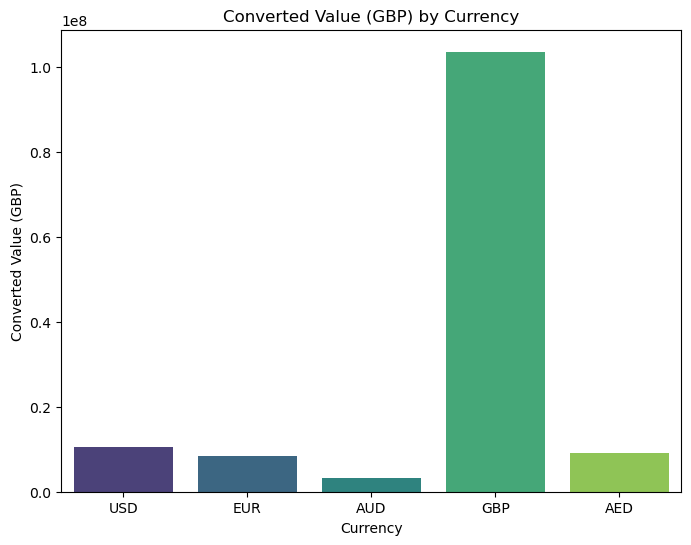

In [37]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Create the DataFrame
data = {'Currency': ['USD', 'EUR', 'AUD', 'GBP', 'AED'],
        'Original Value': [13347608.48, 9924914.42, 6009622.37, '-', 42088834.42],
        'Converted Value (GBP)': [1.062299e+07, 8.515080e+06, 3.217847e+06, 103604336.33, 9049975.26]}
df = pd.DataFrame(data)

# Convert 'Original Value' column to numeric
df['Original Value'] = pd.to_numeric(df['Original Value'], errors='coerce')

# Plotting the bar chart using Seaborn
plt.figure(figsize=(8, 6))
sns.barplot(data=df, x='Currency', y='Converted Value (GBP)', palette='viridis')
plt.xlabel('Currency')
plt.ylabel('Converted Value (GBP)')
plt.title('Converted Value (GBP) by Currency')

# Display the bar chart
plt.show()


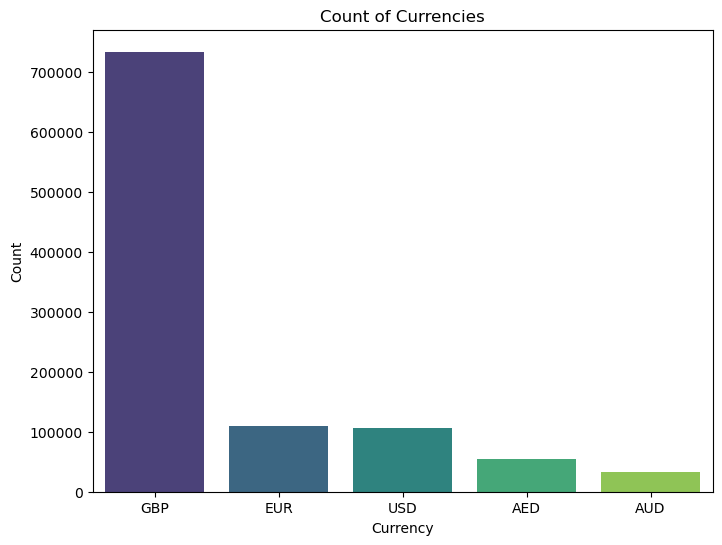

In [38]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Create the DataFrame
data = {'Currency': ['GBP', 'EUR', 'USD', 'AED', 'AUD'],
        'Count': [733735, 110127, 105696, 54012, 32638]}
df = pd.DataFrame(data)

# Plotting the bar chart using Seaborn
plt.figure(figsize=(8, 6))
sns.barplot(data=df, x='Currency', y='Count', palette='viridis')
plt.xlabel('Currency')
plt.ylabel('Count')
plt.title('Count of Currencies')

# Display the bar chart
plt.show()


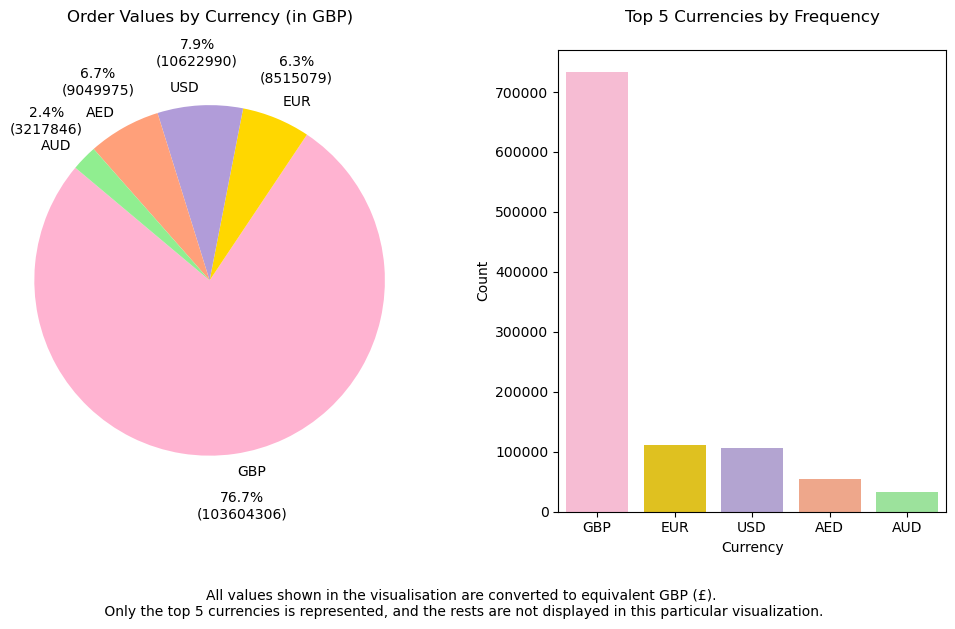

In [103]:
import matplotlib.pyplot as plt

labels = ['GBP', 'EUR', 'USD', 'AED', 'AUD']
sizes = [1.036043e+08, 8.515080e+06, 1.062299e+07, 9.049975e+06, 3.217847e+06]
colors = ['#FFB3D1', '#FFD700', '#B19CD9', '#FFA07A', '#90EE90']

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.pie(sizes, labels=labels, colors=colors, autopct=lambda pct: f'{pct:.1f}%\n({int(pct * sum(sizes) / 100)})', startangle=140, pctdistance=1.3)
plt.axis('equal')
plt.title('Order Values by Currency (in GBP)', pad=20)

data = {'Currency': ['GBP', 'EUR', 'USD', 'AED', 'AUD'],
        'Count': [733735, 110127, 105696, 54012, 32638]}

plt.subplot(1, 2, 2)
sns.barplot(data=data, x='Currency', y='Count', palette=colors)
plt.xlabel('Currency')
plt.ylabel('Count')
plt.title('Top 5 Currencies by Frequency', pad=20)
plt.text(-0.25, -0.2, 'All values shown in the visualisation are converted to equivalent GBP (£).\n Only the top 5 currencies is represented, and the rests are not displayed in this particular visualization.', ha='center', va='center', transform=plt.gca().transAxes)

plt.subplots_adjust(wspace=0.4)

plt.show()


remeber AED has no converted value database

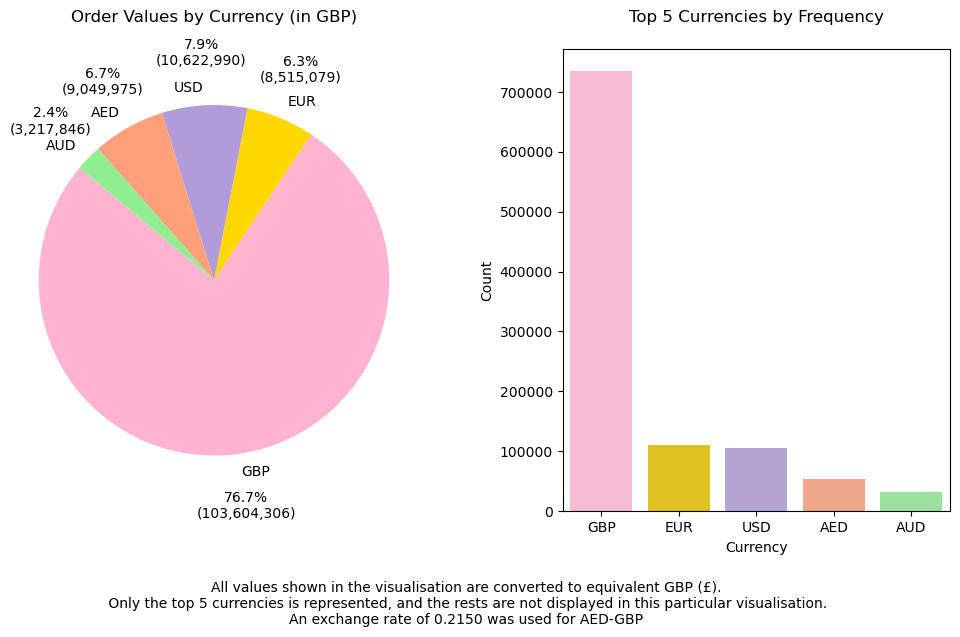

In [135]:
import matplotlib.pyplot as plt

labels = ['GBP', 'EUR', 'USD', 'AED', 'AUD']
sizes = [1.036043e+08, 8.515080e+06, 1.062299e+07, 9.049975e+06, 3.217847e+06]
colors = ['#FFB3D1', '#FFD700', '#B19CD9', '#FFA07A', '#90EE90']

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.pie(sizes, labels=labels, colors=colors, autopct=lambda pct: f'{pct:.1f}%\n({int(pct * sum(sizes) / 100):,})', startangle=140, pctdistance=1.3)
plt.axis('equal')
plt.title('Order Values by Currency (in GBP)', pad=20)

data = {'Currency': ['GBP', 'EUR', 'USD', 'AED', 'AUD'],
        'Count': [733735, 110127, 105696, 54012, 32638]}

plt.subplot(1, 2, 2)
sns.barplot(data=data, x='Currency', y='Count', palette=colors)
plt.xlabel('Currency')
plt.ylabel('Count')
plt.title('Top 5 Currencies by Frequency', pad=20)
plt.text(-0.25, -0.2, 'All values shown in the visualisation are converted to equivalent GBP (£).\n Only the top 5 currencies is represented, and the rests are not displayed in this particular visualisation.\nAn exchange rate of 0.2150 was used for AED-GBP', ha='center', va='center', transform=plt.gca().transAxes)

plt.subplots_adjust(wspace=0.4)

plt.show()


## Value distribution

In [118]:
print(order_complete_value_unique)

          value order name currency  \
0         45.00      #7591      USD   
1         45.00      #7594      USD   
2         75.00      #7595      USD   
3        114.00      #7601      USD   
4         45.00      #7602      USD   
...         ...        ...      ...   
1326279  147.96  #834575US      USD   
1326280   49.90  #834576US      USD   
1326281   63.48  #834577US      USD   
1326282   39.90  #834578US      USD   
1326283   51.96  #834579US      USD   

                                                      when  
0        Sun Jan 01 2023 00:21:49 GMT+0000 (Greenwich M...  
1        Sun Jan 01 2023 01:30:56 GMT+0000 (Greenwich M...  
2        Sun Jan 01 2023 01:45:48 GMT+0000 (Greenwich M...  
3        Sun Jan 01 2023 05:17:51 GMT+0000 (Greenwich M...  
4        Sun Jan 01 2023 14:46:21 GMT+0000 (Greenwich M...  
...                                                    ...  
1326279  Wed May 10 2023 17:49:07 GMT+0100 (British Sum...  
1326280  Wed May 10 2023 17:53:09 GMT+0100 

In [201]:
import os
# Create the downloads folder if it doesn't exist
os.makedirs('downloads', exist_ok=True)

# Define the file path for the CSV file
file_path = os.path.join('downloads', 'order_complete_value_unique_drop0.csv')

# Save the DataFrame to the CSV file
order_complete_value_unique_drop0.to_csv(file_path, index=False)

# Print the file path for reference
print(f"CSV file saved in: {file_path}")

CSV file saved in: downloads\order_complete_value_unique_drop0.csv


In [179]:
gbp_rows = order_complete_value_unique_drop0[order_complete_value_unique_drop0['currency'] == 'GBP']
print(gbp_rows)

          value order name currency  \
1352      29.00    #134422      GBP   
1353      63.00    #134423      GBP   
1354      76.00    #134443      GBP   
1355      29.00    #134445      GBP   
1356      68.00    #134446      GBP   
...         ...        ...      ...   
1286404   17.99  #589289UK      GBP   
1286405  159.04  #589291UK      GBP   
1286406   46.72  #589290UK      GBP   
1286407   41.98  #589292UK      GBP   
1286408   37.09  #589293UK      GBP   

                                                      when  
1352     Sun Jan 01 2023 01:21:33 GMT+0000 (Greenwich M...  
1353     Sun Jan 01 2023 01:32:10 GMT+0000 (Greenwich M...  
1354     Sun Jan 01 2023 06:54:05 GMT+0000 (Greenwich M...  
1355     Sun Jan 01 2023 08:23:43 GMT+0000 (Greenwich M...  
1356     Sun Jan 01 2023 08:32:13 GMT+0000 (Greenwich M...  
...                                                    ...  
1286404  Tue Mar 21 2023 16:14:37 GMT+0000 (Greenwich M...  
1286405  Tue Mar 21 2023 16:33:15 GMT+0000 

In [202]:
import os
# Create the downloads folder if it doesn't exist
os.makedirs('downloads', exist_ok=True)

# Define the file path for the CSV file
file_path = os.path.join('downloads', 'gbp_rows.csv')

# Save the DataFrame to the CSV file
gbp_rows.to_csv(file_path, index=False)

# Print the file path for reference
print(f"CSV file saved in: {file_path}")

CSV file saved in: downloads\gbp_rows.csv


In [180]:
gbp_rows_stats = gbp_rows.describe()
print(gbp_rows_stats)

               value
count  733521.000000
mean      141.242495
std       317.277057
min         0.500000
25%        45.000000
50%        70.000000
75%       119.000000
max     15322.000000


In [257]:
usd_rows = order_complete_value_unique_drop0[order_complete_value_unique_drop0['currency'] == 'USD']
usd_rows_stats = usd_rows.describe()
print(usd_rows_stats)

               value
count  105650.000000
mean      126.337988
std       122.608369
min         0.010000
25%        60.712500
50%       104.000000
75%       150.000000
max      3212.000000


In [203]:
import os
# Create the downloads folder if it doesn't exist
os.makedirs('downloads', exist_ok=True)

# Define the file path for the CSV file
file_path = os.path.join('downloads', 'usd_rows.csv')

# Save the DataFrame to the CSV file
usd_rows.to_csv(file_path, index=False)

# Print the file path for reference
print(f"CSV file saved in: {file_path}")

CSV file saved in: downloads\usd_rows.csv


In [182]:
aed_rows = order_complete_value_unique_drop0[order_complete_value_unique_drop0['currency'] == 'AED']
aed_rows_stats = aed_rows.describe()
print(aed_rows_stats)

              value
count  54010.000000
mean     779.278549
std      738.308642
min       10.000000
25%      325.000000
50%      589.550000
75%      974.050000
max    19152.000000


In [183]:
aud_rows = order_complete_value_unique_drop0[order_complete_value_unique_drop0['currency'] == 'AUD']
aud_rows_stats = aud_rows.describe()
print(aud_rows_stats)

              value
count  32633.000000
mean     184.157827
std      166.482268
min        4.990000
25%       86.540000
50%      139.990000
75%      239.000000
max     3226.000000


In [184]:
eur_rows = order_complete_value_unique_drop0[order_complete_value_unique_drop0['currency'] == 'EUR']
eur_rows_stats = eur_rows.describe()
print(eur_rows_stats)

               value
count  110067.000000
mean       90.171572
std        99.617474
min         0.010000
25%        46.210000
50%        70.000000
75%       110.000000
max      8762.300000


In [185]:
print(f"GBP: {gbp_rows_stats}")
print(f"EUR: {eur_rows_stats}")
print(f"USD: {usd_rows_stats}")
print(f"AED: {aed_rows_stats}")
print(f"AUD: {aud_rows_stats}")

GBP:                value
count  733521.000000
mean      141.242495
std       317.277057
min         0.500000
25%        45.000000
50%        70.000000
75%       119.000000
max     15322.000000
EUR:                value
count  110067.000000
mean       90.171572
std        99.617474
min         0.010000
25%        46.210000
50%        70.000000
75%       110.000000
max      8762.300000
USD:                value
count  105650.000000
mean      126.337988
std       122.608369
min         0.010000
25%        60.712500
50%       104.000000
75%       150.000000
max      3212.000000
AED:               value
count  54010.000000
mean     779.278549
std      738.308642
min       10.000000
25%      325.000000
50%      589.550000
75%      974.050000
max    19152.000000
AUD:               value
count  32633.000000
mean     184.157827
std      166.482268
min        4.990000
25%       86.540000
50%      139.990000
75%      239.000000
max     3226.000000


In [194]:
GBP = gbp_rows_stats*1
EUR_converted = eur_rows_stats*c.get_rate('EUR', 'GBP')
USD_converted = usd_rows_stats*c.get_rate('USD', 'GBP')
AED_converted = aed_rows_stats*0.215
AUD_converted = aud_rows_stats*c.get_rate('AUD', 'GBP')
print(f"GBP: {GBP}")
print(f"EUR_converted: {EUR_converted}")
print(f"USD_converted: {USD_converted}")
print(f"AED_converted: {AED_converted}")
print(f"AUD_converted: {AUD_converted}")

GBP:                value
count  733521.000000
mean      141.242495
std       317.277057
min         0.500000
25%        45.000000
50%        70.000000
75%       119.000000
max     15322.000000
EUR_converted:               value
count  94431.982650
mean      77.362700
std       85.466812
min        0.008580
25%       39.645870
50%       60.056500
75%       94.374500
max     7517.615285
USD_converted:               value
count  84083.875232
mean     100.548866
std       97.580566
min        0.007959
25%       48.319378
50%       82.770686
75%      119.380798
max     2556.340816
AED_converted:               value
count  11612.150000
mean     167.544888
std      158.736358
min        2.150000
25%       69.875000
50%      126.753250
75%      209.420750
max     4117.680000
AUD_converted:               value
count  17473.308588
mean      98.607132
std       89.142771
min        2.671891
25%       46.337760
50%       74.957511
75%      127.972321
max     1727.358609


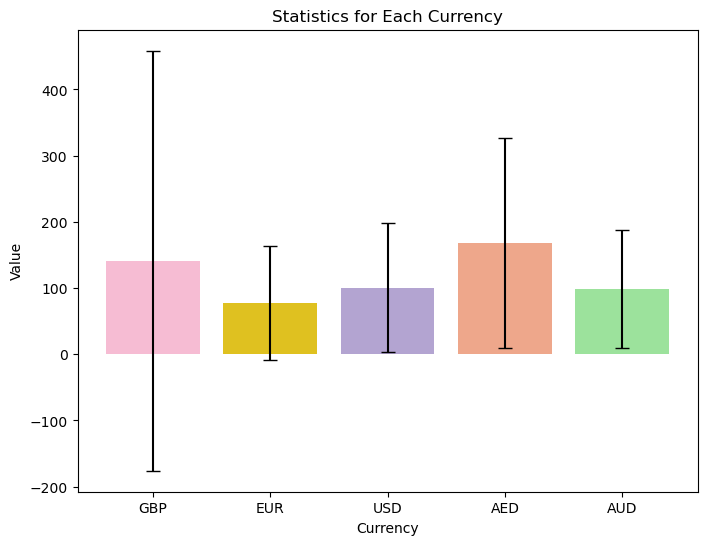

In [196]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the data for each currency
currency_labels = ['GBP', 'EUR', 'USD', 'AED', 'AUD']
counts = [733521, 94431.982650, 84083.875232, 11612.150000, 17473.308588]
means = [141.242495, 77.362700, 100.548866, 167.544888, 98.607132]
stds = [317.277057, 85.466812, 97.580566, 158.736358, 89.142771]

# Set the color palette
colors = ['#FFB3D1', '#FFD700', '#B19CD9', '#FFA07A', '#90EE90']

# Create a dataframe for the statistics
stats_df = pd.DataFrame({'Currency': currency_labels, 'Count': counts, 'Mean': means, 'Std': stds})

# Create the bar plot
plt.figure(figsize=(8, 6))
sns.barplot(data=stats_df, x='Currency', y='Mean', palette=colors, ci='sd')
plt.errorbar(range(len(currency_labels)), means, yerr=stds, fmt='none', color='black', capsize=5)
plt.xlabel('Currency')
plt.ylabel('Value')
plt.title('Statistics for Each Currency')

# Display the plot
plt.show()

### Identify outliers and start again, assume each currency represent one region

In [244]:
import numpy as np
from scipy import stats
# Calculate Z-scores
z_scores = np.abs(stats.zscore(gbp_rows['value']))
outliers_gbp = z_scores > 3.5
print('Number of outliers for gbp:', outliers_gbp.sum())

z_scores = np.abs(stats.zscore(eur_rows['value']))
outliers_eur = z_scores > 3.5
print('Number of outliers for eur:', outliers_eur.sum())

z_scores = np.abs(stats.zscore(usd_rows['value']))
outliers_usd = z_scores > 3.5
print('Number of outliers for usd:', outliers_usd.sum())

z_scores = np.abs(stats.zscore(aed_rows['value']))
outliers_aed = z_scores > 3.5
print('Number of outliers for aed:', outliers_aed.sum())

z_scores = np.abs(stats.zscore(aud_rows['value']))
outliers_aud = z_scores > 3.5
print('Number of outliers for aud:', outliers_aud.sum())

Number of outliers for gbp: 13214
Number of outliers for eur: 673
Number of outliers for usd: 1088
Number of outliers for aed: 668
Number of outliers for aud: 394


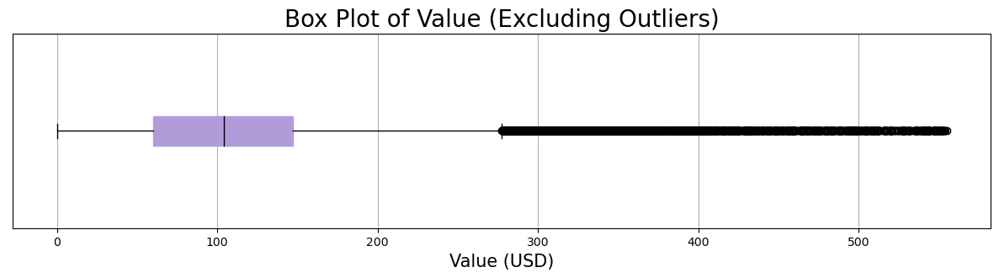

In [273]:
# Box plot of the 'value' column excluding outliers
plt.figure(figsize=(15, 3))
plt.boxplot(usd_rows[~outliers_usd]['value'], vert=False, patch_artist=True, boxprops=dict(facecolor='#B19CD9', color='#B19CD9'), medianprops=dict(color='black'))
plt.title('Box Plot of Value (Excluding Outliers)', fontsize=20)
plt.xlabel('Value (USD)', fontsize=15)
plt.yticks([])
plt.grid(True)
plt.show()

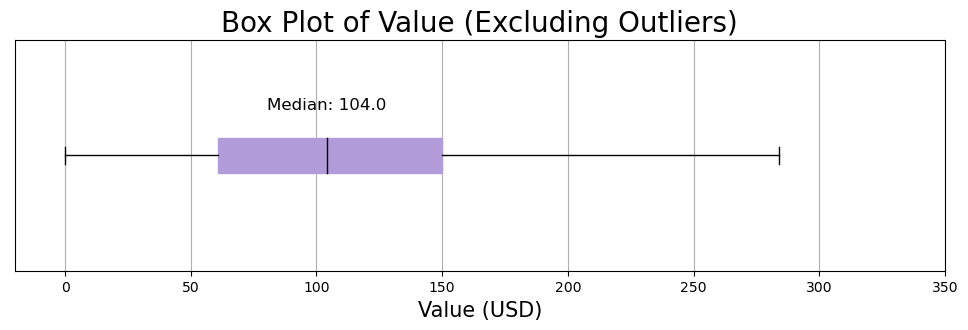

In [278]:
plt.figure(figsize=(12, 3))
boxprops = dict(facecolor='#B19CD9', color='#B19CD9')
plt.boxplot(usd_rows['value'], vert=False, patch_artist=True, boxprops=boxprops, medianprops=dict(color='black'), flierprops=dict(marker=''))
plt.title('Box Plot of Value (Excluding Outliers)', fontsize=20)
plt.xlabel('Value (USD)', fontsize=15)
plt.text(usd_median, 1.2, f'Median: {usd_median}', horizontalalignment='center', fontsize=12)
plt.yticks([])
plt.xlim(-20, 350)
plt.grid(True)
plt.show()


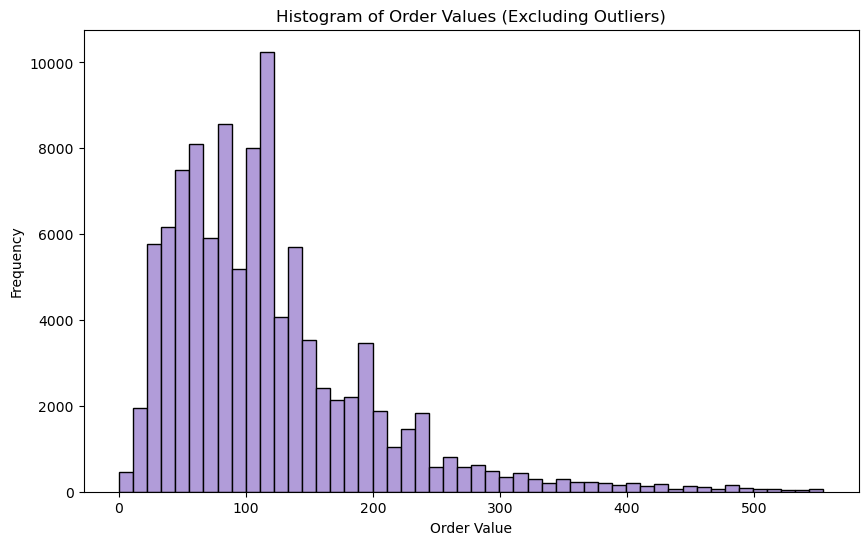

In [294]:
z_scores = stats.zscore(usd_rows['value'])
usd_no_outliers = usd_rows[np.abs(z_scores) <= 3.5]
plt.figure(figsize=(10,6))
plt.hist(usd_no_outliers['value'], bins=50, color='#B19CD9', edgecolor='black')
plt.title('Histogram of Order Values (Excluding Outliers)')
plt.xlabel('Order Value')
plt.ylabel('Frequency')
plt.show()

The outliers in the 'value' column have been identified using the Z-score method with a cut-off of 3.5. There are 1088 outliers in the data. The outliers in the 'value' column have been identified using the Z-score method with a cut-off of 3.5. There are 1088 outliers in the data. The box plot shows the distribution of the 'value' column excluding the outliers. The box represents the interquartile range (IQR), which is the range between the first quartile (Q1) and the third quartile (Q3). The line inside the box represents the median. The whiskers represent the range of the data within 1.5 times the IQR

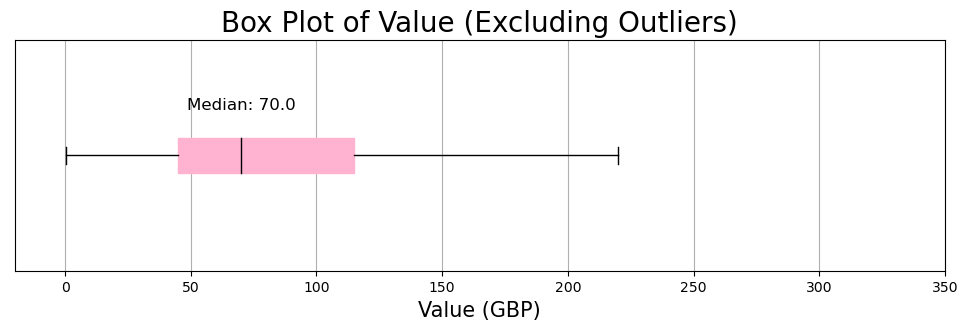

In [280]:
# Box plot of the 'value' column excluding outliers
plt.figure(figsize=(12, 3))
plt.boxplot(gbp_rows[~outliers_gbp]['value'], vert=False, patch_artist=True, boxprops=dict(facecolor='#FFB3D1', color='#FFB3D1'), medianprops=dict(color='black'), flierprops=dict(marker=''))
plt.title('Box Plot of Value (Excluding Outliers)', fontsize=20)
plt.xlabel('Value (GBP)', fontsize=15)
gbp_median = np.median(gbp_rows['value'])
plt.text(gbp_median, 1.2, f'Median: {gbp_median}', horizontalalignment='center', fontsize=12)
plt.yticks([])
plt.grid(True)
plt.xlim(-20, 350)
plt.show()

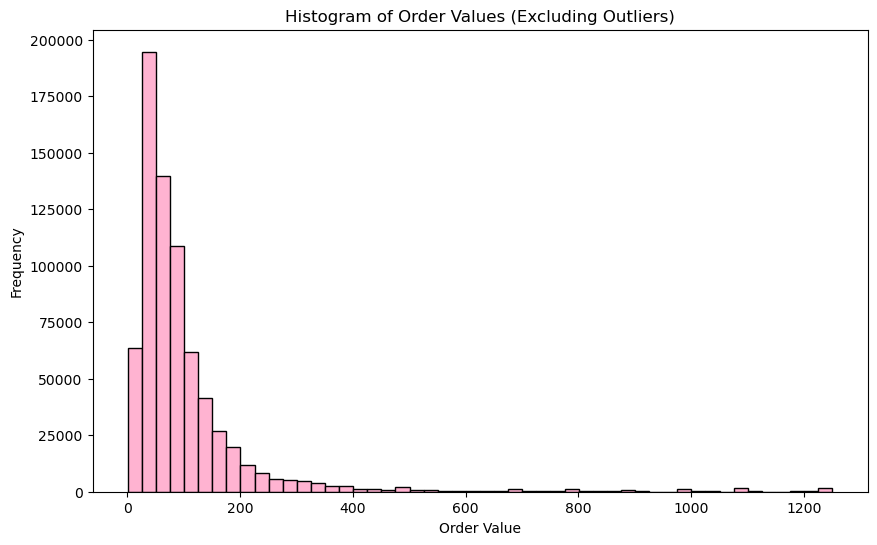

In [295]:
z_scores = stats.zscore(gbp_rows['value'])
gbp_no_outliers = gbp_rows[np.abs(z_scores) <= 3.5]
plt.figure(figsize=(10,6))
plt.hist(gbp_no_outliers['value'], bins=50, color='#FFB3D1', edgecolor='black')
plt.title('Histogram of Order Values (Excluding Outliers)')
plt.xlabel('Order Value')
plt.ylabel('Frequency')
plt.show()

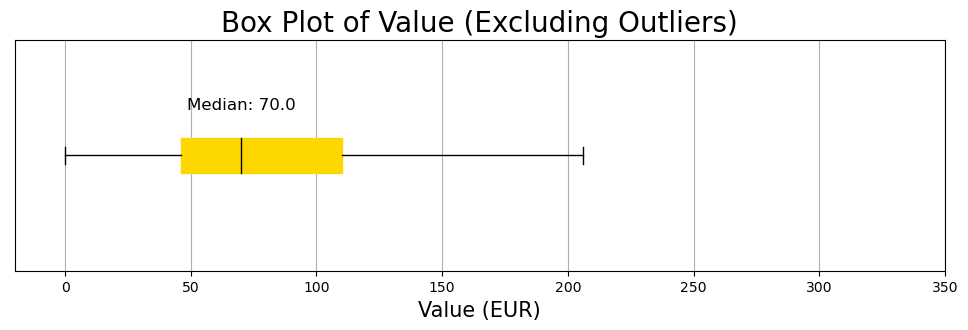

In [282]:
# Box plot of the 'value' column excluding outliers
plt.figure(figsize=(12, 3))
plt.boxplot(eur_rows[~outliers_eur]['value'], vert=False, patch_artist=True, boxprops=dict(facecolor='#FFD700', color='#FFD700'), medianprops=dict(color='black'), flierprops=dict(marker=''))
plt.title('Box Plot of Value (Excluding Outliers)', fontsize=20)
plt.xlabel('Value (EUR)', fontsize=15)
eur_median = np.median(eur_rows['value'])
plt.text(eur_median, 1.2, f'Median: {eur_median}', horizontalalignment='center', fontsize=12)
plt.yticks([])
plt.grid(True)
plt.xlim(-20, 350)
plt.show()

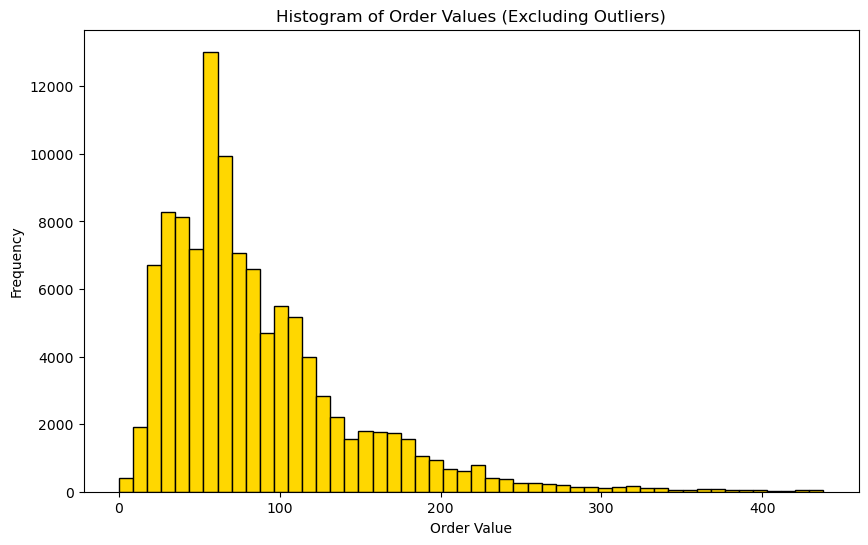

In [297]:
z_scores = stats.zscore(eur_rows['value'])
eur_no_outliers = eur_rows[np.abs(z_scores) <= 3.5]
plt.figure(figsize=(10,6))
plt.hist(eur_no_outliers['value'], bins=50, color='#FFD700', edgecolor='black')
plt.title('Histogram of Order Values (Excluding Outliers)')
plt.xlabel('Order Value')
plt.ylabel('Frequency')
plt.show()

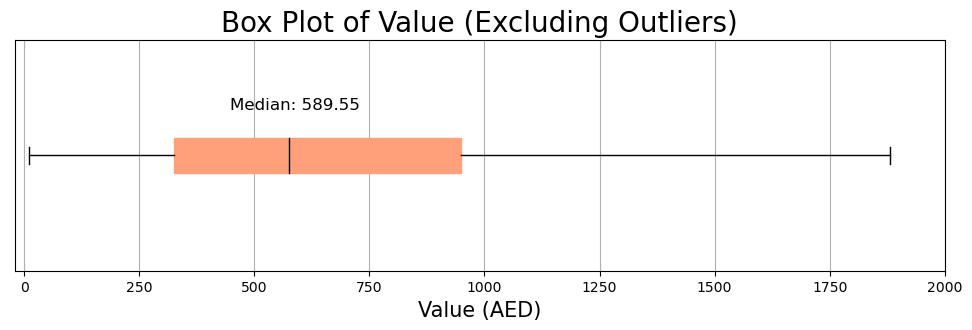

In [283]:
plt.figure(figsize=(12, 3))
plt.boxplot(aed_rows[~outliers_aed]['value'], vert=False, patch_artist=True, boxprops=dict(facecolor='#FFA07A', color='#FFA07A'), medianprops=dict(color='black'), flierprops=dict(marker=''))
plt.title('Box Plot of Value (Excluding Outliers)', fontsize=20)
plt.xlabel('Value (AED)', fontsize=15)
aed_median = np.median(aed_rows['value'])
plt.text(aed_median, 1.2, f'Median: {aed_median}', horizontalalignment='center', fontsize=12)
plt.yticks([])
plt.grid(True)
plt.xlim(-20, 2000)
plt.show()

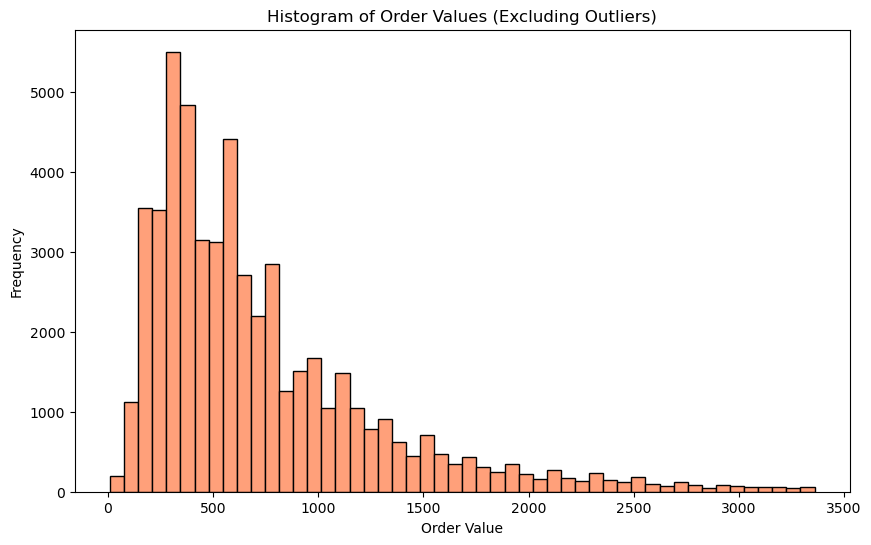

In [299]:
z_scores = stats.zscore(aed_rows['value'])
aed_no_outliers = aed_rows[np.abs(z_scores) <= 3.5]
plt.figure(figsize=(10,6))
plt.hist(aed_no_outliers['value'], bins=50, color='#FFA07A', edgecolor='black')
plt.title('Histogram of Order Values (Excluding Outliers)')
plt.xlabel('Order Value')
plt.ylabel('Frequency')
plt.show()

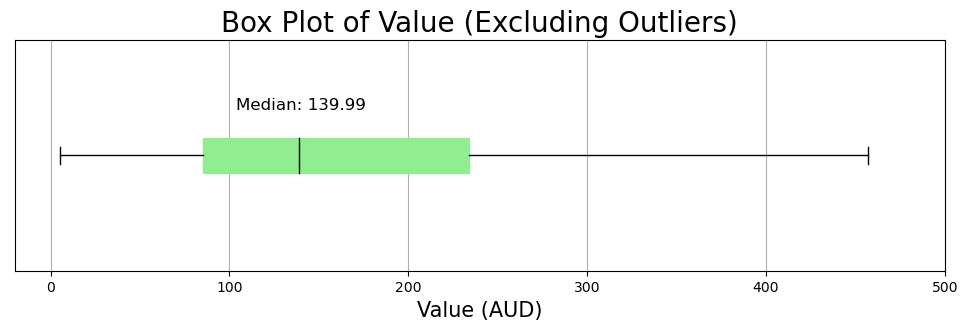

In [284]:
plt.figure(figsize=(12, 3))
plt.boxplot(aud_rows[~outliers_aud]['value'], vert=False, patch_artist=True, boxprops=dict(facecolor='#90EE90', color='#90EE90'), medianprops=dict(color='black'), flierprops=dict(marker=''))
plt.title('Box Plot of Value (Excluding Outliers)', fontsize=20)
plt.xlabel('Value (AUD)', fontsize=15)
aud_median = np.median(aud_rows['value'])
plt.text(aud_median, 1.2, f'Median: {aud_median}', horizontalalignment='center', fontsize=12)
plt.yticks([])
plt.grid(True)
plt.xlim(-20, 500)
plt.show()

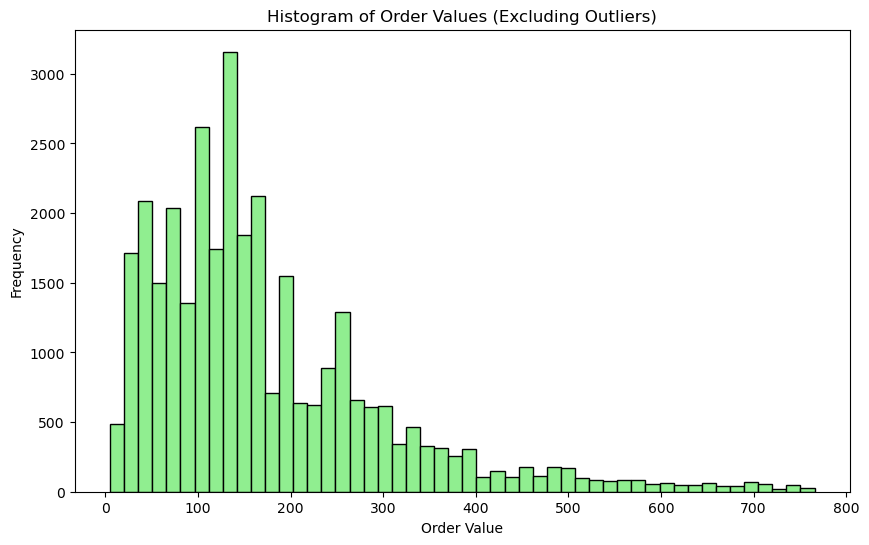

In [301]:
z_scores = stats.zscore(aud_rows['value'])
aud_no_outliers = aud_rows[np.abs(z_scores) <= 3.5]
plt.figure(figsize=(10,6))
plt.hist(aud_no_outliers['value'], bins=50, color='#90EE90', edgecolor='black')
plt.title('Histogram of Order Values (Excluding Outliers)')
plt.xlabel('Order Value')
plt.ylabel('Frequency')
plt.show()

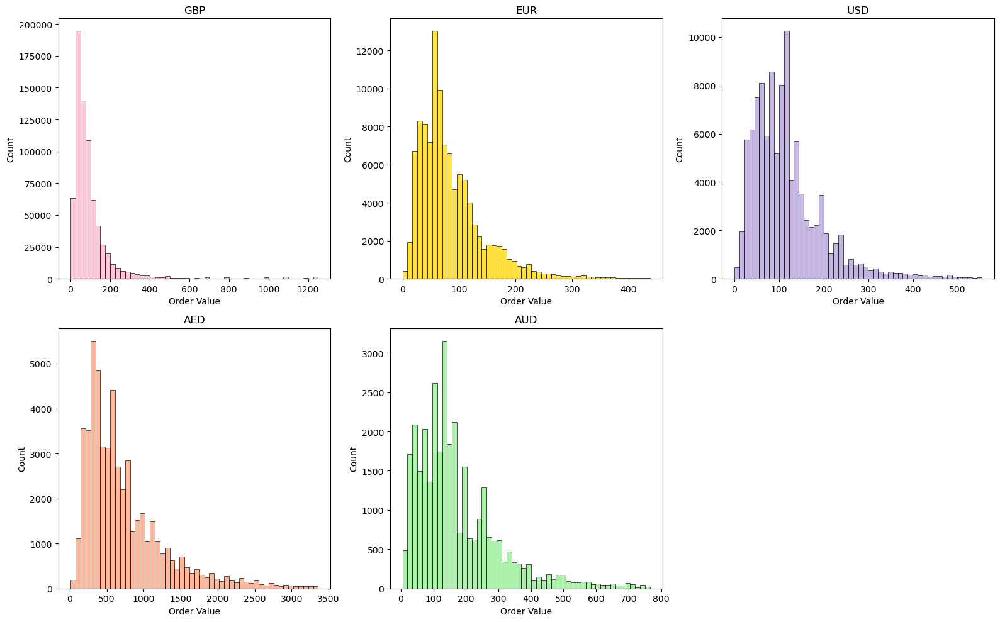

In [318]:
import seaborn as sns

# Set the color palette
colors = ['#FFB3D1', '#FFD700', '#B19CD9', '#FFA07A', '#90EE90']

# Create subplots for each currency
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(16, 10))

# Plot histogram for GBP
sns.histplot(data=gbp_no_outliers, x='value', bins=50, color=colors[0], edgecolor='black', ax=axes[0, 0])
axes[0, 0].set_title('GBP', fontsize=12)
axes[0, 0].set_xlabel('Order Value')
axes[0, 0].set_ylabel('Count')

# Plot histogram for EUR
sns.histplot(data=eur_no_outliers, x='value', bins=50, color=colors[1], edgecolor='black', ax=axes[0, 1])
axes[0, 1].set_title('EUR', fontsize=12)
axes[0, 1].set_xlabel('Order Value')
axes[0, 1].set_ylabel('Count')

# Plot histogram for USD
sns.histplot(data=usd_no_outliers, x='value', bins=50, color=colors[2], edgecolor='black', ax=axes[0, 2])
axes[0, 2].set_title('USD', fontsize=12)
axes[0, 2].set_xlabel('Order Value')
axes[0, 2].set_ylabel('Count')

# Plot histogram for AED
sns.histplot(data=aed_no_outliers, x='value', bins=50, color=colors[3], edgecolor='black', ax=axes[1, 0])
axes[1, 0].set_title('AED', fontsize=12)
axes[1, 0].set_xlabel('Order Value')
axes[1, 0].set_ylabel('Count')

# Plot histogram for AUD
sns.histplot(data=aud_no_outliers, x='value', bins=50, color=colors[4], edgecolor='black', ax=axes[1, 1])
axes[1, 1].set_title('AUD', fontsize=12)
axes[1, 1].set_xlabel('Order Value')
axes[1, 1].set_ylabel('Count')

# Remove empty subplot
fig.delaxes(axes[1, 2])

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


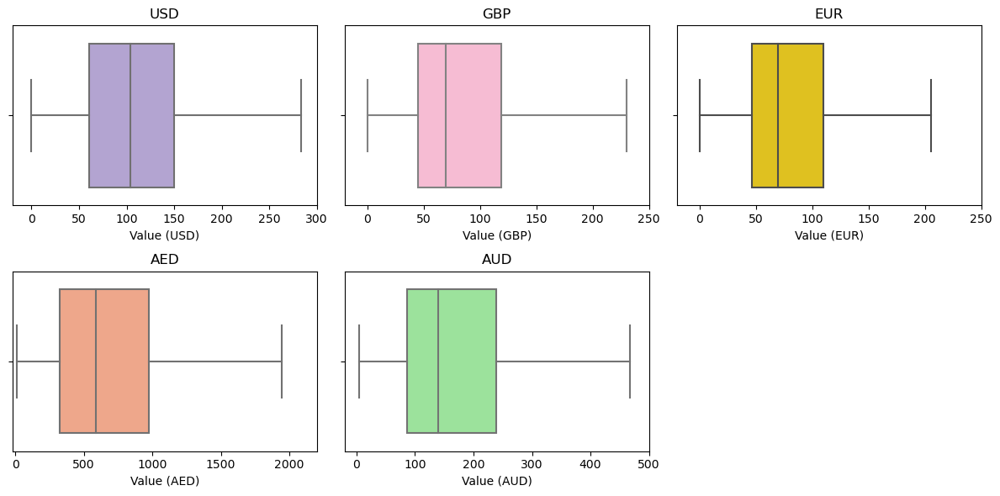

In [316]:
plt.figure(figsize=(12, 6))

# Box plot for USD (excluding outliers)
plt.subplot(231)
sns.boxplot(x=usd_rows['value'], color='#B19CD9', fliersize=0)
plt.title('USD', fontsize=12)
plt.xlabel('Value (USD)')
plt.xlim(-20, 300)
plt.ylabel('')

# Box plot for GBP (excluding outliers)
plt.subplot(232)
sns.boxplot(x=gbp_rows['value'], color='#FFB3D1', fliersize=0)
plt.title('GBP', fontsize=12)
plt.xlabel('Value (GBP)')
plt.xlim(-20, 250)
plt.ylabel('')

# Box plot for EUR (excluding outliers)
plt.subplot(233)
sns.boxplot(x=eur_rows['value'], color='#FFD700', fliersize=0)
plt.title('EUR', fontsize=12)
plt.xlabel('Value (EUR)')
plt.xlim(-20, 250)
plt.ylabel('')

# Box plot for AED (excluding outliers)
plt.subplot(234)
sns.boxplot(x=aed_rows['value'], color='#FFA07A', fliersize=0)
plt.title('AED', fontsize=12)
plt.xlabel('Value (AED)')
plt.xlim(-20, 2200)
plt.ylabel('')

# Box plot for AUD (excluding outliers)
plt.subplot(235)
sns.boxplot(x=aud_rows['value'], color='#90EE90', fliersize=0)
plt.title('AUD', fontsize=12)
plt.xlabel('Value (AUD)')
plt.xlim(-20, 500)
plt.ylabel('')

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


# Redo with unique id

In [1]:
import sqlite3
import pandas as pd
connection = sqlite3.connect('new_code_database.db')

query = "SELECT * FROM chunk_sql WHERE event = 'order_complete'"

order_complete_id = pd.read_sql_query(query, connection)
print(order_complete_id.head())
connection.close()

   index                       checkout id    store  converted order name  \
0     30  44edbd9a904fe714d5b33ababb5266fd  store_0        1.0      #7591   
1     59  af3bc673623dbcdfca771acb2e5b578f  store_0        1.0      #7594   
2     66  0e06406ffe8ff81ad18c5d485f93568d  store_0        1.0      #7595   
3     95  ad5ef91102436ae17c26ddfe54be5291  store_0        1.0      #7601   
4    115  a563c69b44a3d807e329015da5f60ba7  store_0        1.0      #7602   

  currency  value           event  \
0      USD   45.0  order_complete   
1      USD   45.0  order_complete   
2      USD   75.0  order_complete   
3      USD  114.0  order_complete   
4      USD   45.0  order_complete   

                                                when customer  step  type  \
0  Sun Jan 01 2023 00:21:49 GMT+0000 (Greenwich M...       c3  None  None   
1  Sun Jan 01 2023 01:30:56 GMT+0000 (Greenwich M...       c6  None  None   
2  Sun Jan 01 2023 01:45:48 GMT+0000 (Greenwich M...       c7  None  None   
3  Sun

In [ ]:
#the rows with event = order complete and unique id 

In [16]:
order_complete_id_unique = order_complete_id.drop_duplicates(subset=['checkout id'])
print(order_complete_id_unique.shape[0])

1134477


In [ ]:
#there are 4130 missing currencies

In [25]:
currency_count = order_complete_id_unique['currency'].value_counts()
print(currency_count.head(10))
total_counts = currency_count.sum()
print("Total Count:", total_counts)
missing_values = order_complete_id_unique['currency'].isnull().sum()
print("Missing currencies:", missing_values)

GBP    807501
EUR    119383
USD    106308
AED     54647
AUD     32729
CAD      3353
SEK      1961
DKK      1562
CHF       963
NZD       160
Name: currency, dtype: int64
Total Count: 1130347
Missing currencies: 4130


In [18]:
total_value_gbp_by_id = order_complete_id_unique.loc[order_complete_id_unique['currency'] == 'GBP', 'value'].sum()
print("Total value (GBP):", total_value_gbp_by_id)

Total value (GBP): 108145081.13999997


In [19]:
value_null_rows_by_id = order_complete_id_unique[order_complete_id_unique['value'] == 0]
print(value_null_rows_by_id.shape[0])

379


In [52]:
# Drop rows with 'value' == 0
order_complete_id_drop0 = order_complete_id[order_complete_id['value'] != 0].copy()

# Verify the result
print("Number of rows before dropping 0:", len(order_complete_id))
print("Number of rows after dropping 0:", len(order_complete_id_drop0))

Number of rows before dropping 0: 1326284
Number of rows after dropping 0: 1325878


In [32]:
unique_currencies = order_complete_id_unique['currency'].unique()
print("Unique currencies:", unique_currencies)
total_value_currency = order_complete_id_unique.groupby('currency')['value'].sum()
print("Total value by currency:")
print(total_value_currency.head(10))

Unique currencies: ['USD' 'GBP' 'EUR' 'CAD' 'AUD' 'NOK' 'NZD' 'AED' 'CHF' 'PHP' 'SAR' 'HKD'
 'BGN' 'IDR' 'SEK' 'VND' 'ISK' 'SGD' 'FKP' 'DKK' 'BZD' 'RON' 'HUF' 'QAR'
 'CZK' 'KES' 'PLN' 'RSD' 'ILS' 'MYR' 'BBD' 'NGN' 'THB' 'DOP' 'ANG' 'UAH'
 'CRC' 'JPY' 'KRW' 'LKR' 'ALL' 'AWG' 'INR' 'AMD' 'BAM' 'MXN' 'ZAR' 'GEL'
 'TRY' 'DZD' 'COP' 'EGP' 'MAD' 'LBP' 'MWK' 'UYU' 'CLP' 'AZN' 'MVR' 'SCR'
 'HNL' 'KZT' 'TWD' 'PEN' 'BRL' 'CNY' 'BND' 'MNT' 'RUB' 'MOP' None 'MUR'
 'TTD' 'GYD' 'BDT' 'KYD' 'XOF' 'GTQ' 'BSD' 'CVE' 'MKD' 'XPF' 'CDF' 'BOB']
Total value by currency:
currency
AED    42502475.46
ALL       94707.02
AMD      364776.00
ANG         967.32
AUD     6022931.94
AWG        4073.26
AZN         223.00
BAM         605.00
BBD         213.00
BDT       11809.70
Name: value, dtype: float64


In [33]:
print ('Currency Conversion Result:')
from forex_python.converter import CurrencyRates, RatesNotAvailableError

c = CurrencyRates()
base_currency = 'GBP'

for currency in unique_currencies:
    if currency != base_currency:
        original_values = total_value_currency.get(currency)
        if original_values is not None:
            try:
                converted_values = original_values * c.get_rate(currency, base_currency)
                print(f"Currency: {currency}, Original Values: {original_values:.2f}, Converted Values (GBP): {converted_values:.2f}")
            except RatesNotAvailableError:
                print(f"Currency: {currency}, Original Values: {original_values:.2f}, Converted Values (GBP): N/A (No rate available)")
        else:
            print(f"Currency: {currency}, Original Values: N/A, Converted Values (GBP): N/A (None value)")

Currency Conversion Result:
Currency: USD, Original Values: 13414178.89, Converted Values (GBP): 10675969.18
Currency: EUR, Original Values: 10769259.78, Converted Values (GBP): 9239486.43
Currency: CAD, Original Values: 511308.44, Converted Values (GBP): 305442.89
Currency: AUD, Original Values: 6022931.94, Converted Values (GBP): 3224973.14
Currency: NOK, Original Values: 269915.75, Converted Values (GBP): 19942.66
Currency: NZD, Original Values: 40277.91, Converted Values (GBP): 19604.26
Currency: AED, Original Values: 42502475.46, Converted Values (GBP): N/A (No rate available)
Currency: CHF, Original Values: 113367.03, Converted Values (GBP): 100106.26
Currency: PHP, Original Values: 149322.61, Converted Values (GBP): 2120.14
Currency: SAR, Original Values: 77522.74, Converted Values (GBP): N/A (No rate available)
Currency: HKD, Original Values: 96429.14, Converted Values (GBP): 9791.51
Currency: BGN, Original Values: 28088.65, Converted Values (GBP): 12321.64
Currency: IDR, Origi

In [47]:
import pandas as pd
import numpy as np

conversion_data = {
    'Currency': ['USD', 'EUR', 'CAD', 'AUD', 'NOK', 'NZD', 'AED', 'CHF', 'PHP', 'SAR'],
    'Original Values': [13414178.89, 10769259.78, 511308.44, 6022931.94, 269915.75, 40277.91, 42502475.46, 113367.03, 149322.61, 77522.74],
    'Converted Values (GBP)': [10675969.18, 9239486.43, 305442.89, 3224973.14, 19942.66, 19604.26, 'N/A (No rate available)', 100106.26, 2120.14, 'N/A (No rate available)']
}

conversion_df = pd.DataFrame(conversion_data)

# Replace 'N/A (No rate available)' with NaN
conversion_df['Converted Values (GBP)'] = conversion_df['Converted Values (GBP)'].replace('N/A (No rate available)', np.nan)

# Sort the DataFrame by 'Converted Values (GBP)' column in descending order
conversion_df = conversion_df.sort_values(by='Converted Values (GBP)', ascending=False)

# Display the top ten rows
top_ten_currencies = conversion_df.head(10)
print(top_ten_currencies)


  Currency  Original Values  Converted Values (GBP)
0      USD      13414178.89             10675969.18
1      EUR      10769259.78              9239486.43
3      AUD       6022931.94              3224973.14
2      CAD        511308.44               305442.89
7      CHF        113367.03               100106.26
4      NOK        269915.75                19942.66
5      NZD         40277.91                19604.26
8      PHP        149322.61                 2120.14
6      AED      42502475.46                     NaN
9      SAR         77522.74                     NaN


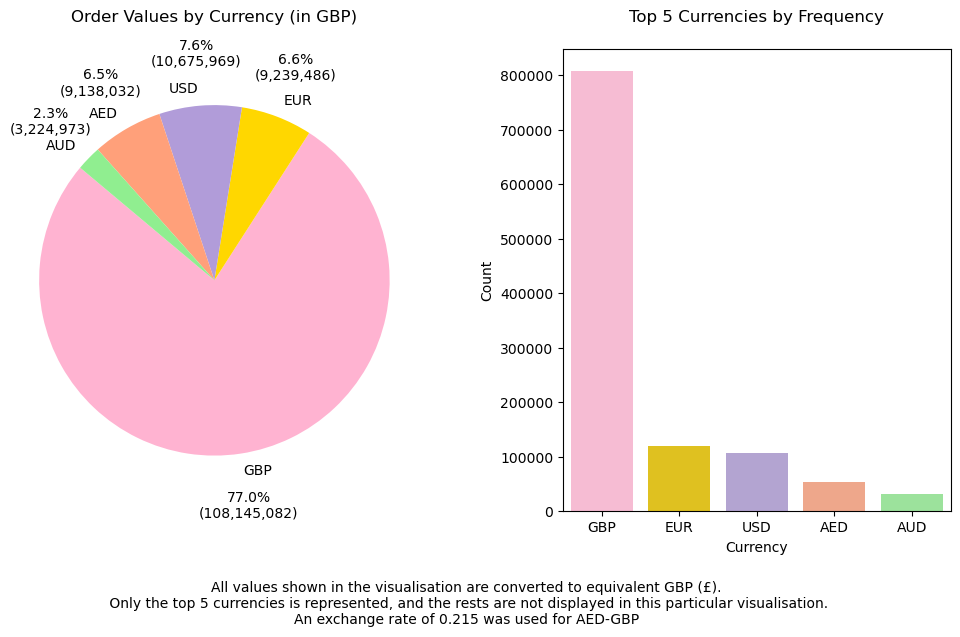

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns

labels = ['GBP', 'EUR', 'USD', 'AED', 'AUD']
sizes = [108145081.13999997, 9239486.43, 10675969.18, 42502475.46*0.215, 3224973.14]
colors = ['#FFB3D1', '#FFD700', '#B19CD9', '#FFA07A', '#90EE90']

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.pie(sizes, labels=labels, colors=colors, autopct=lambda pct: f'{pct:.1f}%\n({int(pct * sum(sizes) / 100):,})', startangle=140, pctdistance=1.3)
plt.axis('equal')
plt.title('Order Values by Currency (in GBP)', pad=20)

data = {'Currency': ['GBP', 'EUR', 'USD', 'AED', 'AUD'],
        'Count': [807501, 119383, 106308, 54647, 32729]}

plt.subplot(1, 2, 2)
sns.barplot(data=data, x='Currency', y='Count', palette=colors)
plt.xlabel('Currency')
plt.ylabel('Count')
plt.title('Top 5 Currencies by Frequency', pad=20)
plt.text(-0.25, -0.2, 'All values shown in the visualisation are converted to equivalent GBP (£).\n Only the top 5 currencies is represented, and the rests are not displayed in this particular visualisation.\nAn exchange rate of 0.215 was used for AED-GBP', ha='center', va='center', transform=plt.gca().transAxes)

plt.subplots_adjust(wspace=0.4)

plt.show()


In [30]:
import os
# Create the downloads folder if it doesn't exist
os.makedirs('downloads', exist_ok=True)

# Define the file path for the CSV file
file_path = os.path.join('downloads', 'order_complete_id_drop0.csv')

# Save the DataFrame to the CSV file
order_complete_id_drop0.to_csv(file_path, index=False)

# Print the file path for reference
print(f"CSV file saved in: {file_path}")

CSV file saved in: downloads\order_complete_id_drop0.csv


In [59]:
gbp_rows = order_complete_id_drop0[order_complete_id_drop0['currency'] == 'GBP']
print(gbp_rows.shape[0])
print(gbp_rows.describe())

942412
              index  converted          value
count  9.424120e+05   942412.0  942412.000000
mean   1.394131e+07        1.0     133.540990
std    8.116702e+06        0.0     300.650007
min    2.731900e+04        1.0       0.500000
25%    7.015464e+06        1.0      42.990000
50%    1.286348e+07        1.0      65.000000
75%    2.079308e+07        1.0     112.000000
max    3.033144e+07        1.0   15322.000000


In [60]:
eur_rows = order_complete_id_drop0[order_complete_id_drop0['currency'] == 'EUR']
print(eur_rows.shape[0])
print(eur_rows.describe())

143282
              index  converted          value
count  1.432820e+05   143282.0  143282.000000
mean   1.841186e+07        1.0      91.246735
std    9.626670e+06        0.0     119.986032
min    1.839980e+05        1.0       0.010000
25%    1.091520e+07        1.0      46.057500
50%    1.978064e+07        1.0      68.970000
75%    2.890758e+07        1.0     109.980000
max    3.008172e+07        1.0    8762.300000


In [61]:
usd_rows = order_complete_id_drop0[order_complete_id_drop0['currency'] == 'USD']
print(usd_rows.shape[0])
print(usd_rows.describe())

124355
              index  converted          value
count  1.243550e+05   124355.0  124355.000000
mean   2.037308e+07        1.0     130.212376
std    8.940576e+06        0.0     126.560532
min    3.000000e+01        1.0       0.010000
25%    1.432639e+07        1.0      64.000000
50%    2.177015e+07        1.0     104.160000
75%    3.051726e+07        1.0     152.000000
max    3.109984e+07        1.0    3212.000000


In [62]:
aed_rows = order_complete_id_drop0[order_complete_id_drop0['currency'] == 'AED']
print(aed_rows.shape[0])
print(aed_rows.describe())

55743
              index  converted         value
count  5.574300e+04    55743.0  55743.000000
mean   2.741691e+07        1.0    777.307070
std    2.660614e+06        0.0    736.375974
min    2.349710e+05        1.0     10.000000
25%    2.727586e+07        1.0    325.000000
50%    2.778172e+07        1.0    580.800000
75%    2.816127e+07        1.0    967.575000
max    2.875890e+07        1.0  19152.000000


In [63]:
aud_rows = order_complete_id_drop0[order_complete_id_drop0['currency'] == 'AUD']
print(aud_rows.shape[0])
print(aud_rows.describe())

36110
              index  converted         value
count  3.611000e+04    36110.0  36110.000000
mean   2.352519e+07        1.0    182.644733
std    5.431236e+06        0.0    164.142250
min    1.981870e+05        1.0      4.990000
25%    2.540611e+07        1.0     87.000000
50%    2.559615e+07        1.0    139.545000
75%    2.578636e+07        1.0    238.000000
max    2.944868e+07        1.0   3226.000000


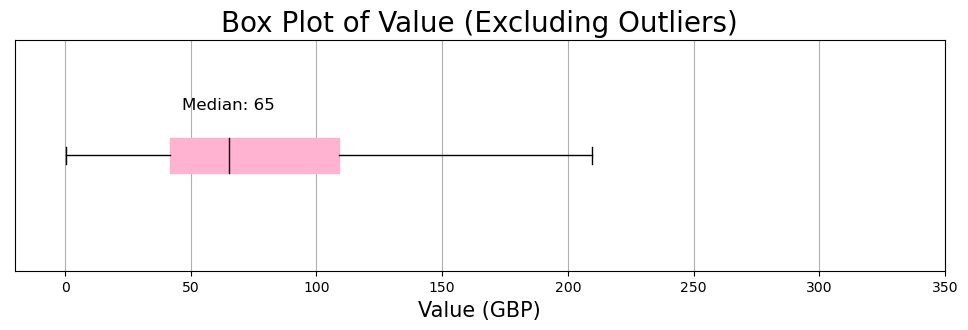

In [73]:
# Box plot of the 'value' column excluding outliers
plt.figure(figsize=(12, 3))
plt.boxplot(gbp_rows[~outliers_gbp]['value'], vert=False, patch_artist=True, boxprops=dict(facecolor='#FFB3D1', color='#FFB3D1'), medianprops=dict(color='black'), flierprops=dict(marker=''))
plt.title('Box Plot of Value (Excluding Outliers)', fontsize=20)
plt.xlabel('Value (GBP)', fontsize=15)
gbp_median = np.median(gbp_rows['value'])
plt.text(gbp_median, 1.2, f'Median: {gbp_median:.0f}', horizontalalignment='center', fontsize=12)
plt.yticks([])
plt.grid(True)
plt.xlim(-20, 350)
plt.show()

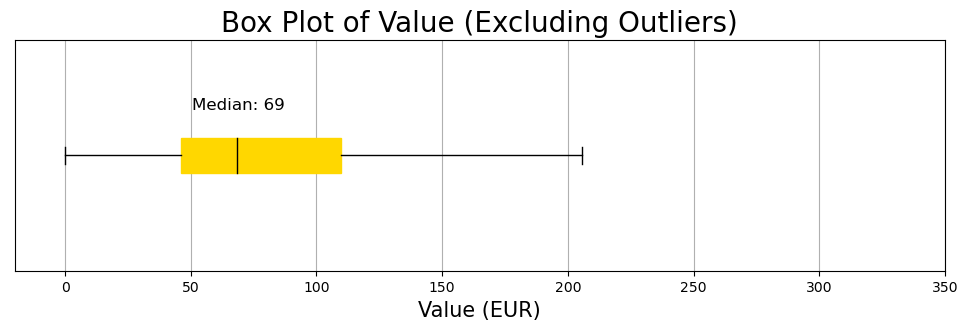

In [74]:
# Box plot of the 'value' column excluding outliers
plt.figure(figsize=(12, 3))
plt.boxplot(eur_rows[~outliers_eur]['value'], vert=False, patch_artist=True, boxprops=dict(facecolor='#FFD700', color='#FFD700'), medianprops=dict(color='black'), flierprops=dict(marker=''))
plt.title('Box Plot of Value (Excluding Outliers)', fontsize=20)
plt.xlabel('Value (EUR)', fontsize=15)
eur_median = np.median(eur_rows['value'])
plt.text(eur_median, 1.2, f'Median: {eur_median:.0f}', horizontalalignment='center', fontsize=12)
plt.yticks([])
plt.grid(True)
plt.xlim(-20, 350)
plt.show()

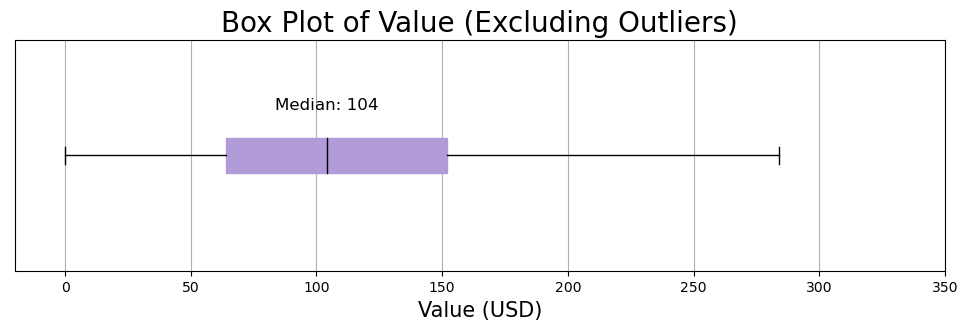

In [76]:
plt.figure(figsize=(12, 3))
boxprops = dict(facecolor='#B19CD9', color='#B19CD9')
plt.boxplot(usd_rows['value'], vert=False, patch_artist=True, boxprops=boxprops, medianprops=dict(color='black'), flierprops=dict(marker=''))
plt.title('Box Plot of Value (Excluding Outliers)', fontsize=20)
plt.xlabel('Value (USD)', fontsize=15)
usd_median = np.median(usd_rows['value'])
plt.text(usd_median, 1.2, f'Median: {usd_median:.0f}', horizontalalignment='center', fontsize=12)
plt.yticks([])
plt.xlim(-20, 350)
plt.grid(True)
plt.show()

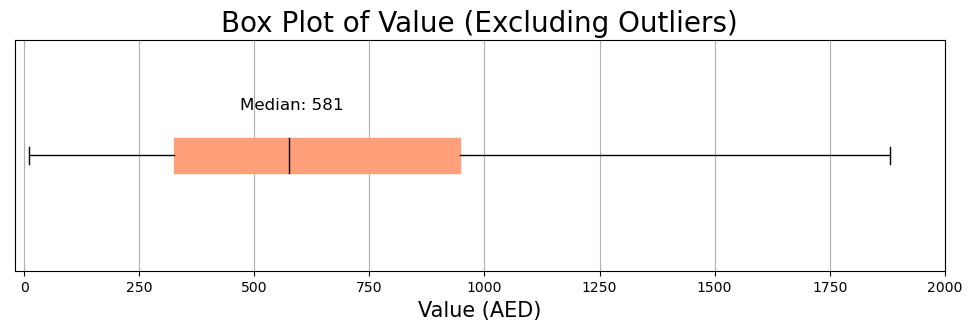

In [77]:
plt.figure(figsize=(12, 3))
plt.boxplot(aed_rows[~outliers_aed]['value'], vert=False, patch_artist=True, boxprops=dict(facecolor='#FFA07A', color='#FFA07A'), medianprops=dict(color='black'), flierprops=dict(marker=''))
plt.title('Box Plot of Value (Excluding Outliers)', fontsize=20)
plt.xlabel('Value (AED)', fontsize=15)
aed_median = np.median(aed_rows['value'])
plt.text(aed_median, 1.2, f'Median: {aed_median:.0f}', horizontalalignment='center', fontsize=12)
plt.yticks([])
plt.grid(True)
plt.xlim(-20, 2000)
plt.show()

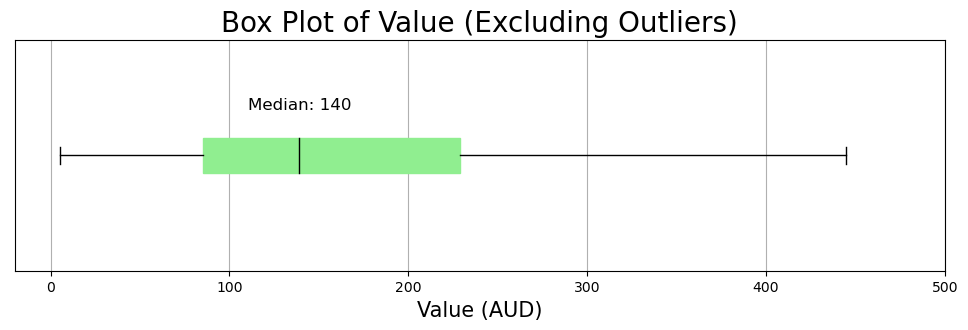

In [79]:
plt.figure(figsize=(12, 3))
plt.boxplot(aud_rows[~outliers_aud]['value'], vert=False, patch_artist=True, boxprops=dict(facecolor='#90EE90', color='#90EE90'), medianprops=dict(color='black'), flierprops=dict(marker=''))
plt.title('Box Plot of Value (Excluding Outliers)', fontsize=20)
plt.xlabel('Value (AUD)', fontsize=15)
aud_median = np.median(aud_rows['value'])
plt.text(aud_median, 1.2, f'Median: {aud_median:.0f}', horizontalalignment='center', fontsize=12)
plt.yticks([])
plt.grid(True)
plt.xlim(-20, 500)
plt.show()

In [64]:
import numpy as np
from scipy import stats
# Calculate Z-scores
z_scores = np.abs(stats.zscore(gbp_rows['value']))
outliers_gbp = z_scores > 3.5
print('Number of outliers for gbp:', outliers_gbp.sum())

z_scores = np.abs(stats.zscore(eur_rows['value']))
outliers_eur = z_scores > 3.5
print('Number of outliers for eur:', outliers_eur.sum())

z_scores = np.abs(stats.zscore(usd_rows['value']))
outliers_usd = z_scores > 3.5
print('Number of outliers for usd:', outliers_usd.sum())

z_scores = np.abs(stats.zscore(aed_rows['value']))
outliers_aed = z_scores > 3.5
print('Number of outliers for aed:', outliers_aed.sum())

z_scores = np.abs(stats.zscore(aud_rows['value']))
outliers_aud = z_scores > 3.5
print('Number of outliers for aud:', outliers_aud.sum())

Number of outliers for gbp: 17906
Number of outliers for eur: 818
Number of outliers for usd: 1323
Number of outliers for aed: 686
Number of outliers for aud: 431


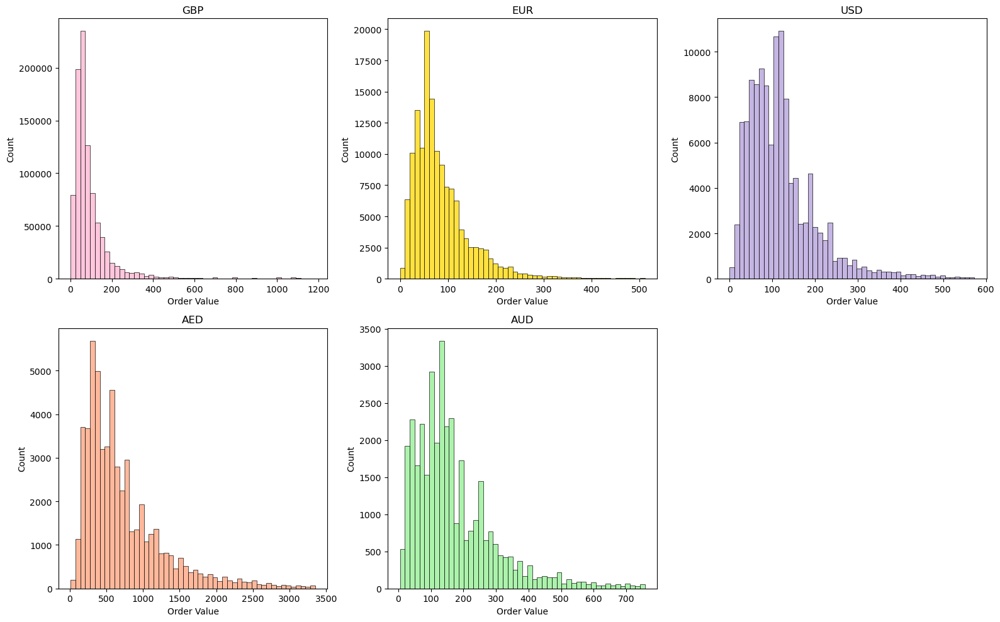

In [80]:
import seaborn as sns

# Set the color palette
colors = ['#FFB3D1', '#FFD700', '#B19CD9', '#FFA07A', '#90EE90']

# Create subplots for each currency
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(16, 10))

z_scores = stats.zscore(usd_rows['value'])
usd_no_outliers = usd_rows[np.abs(z_scores) <= 3.5]
z_scores = stats.zscore(gbp_rows['value'])
gbp_no_outliers = gbp_rows[np.abs(z_scores) <= 3.5]
z_scores = stats.zscore(eur_rows['value'])
eur_no_outliers = eur_rows[np.abs(z_scores) <= 3.5]
z_scores = stats.zscore(aed_rows['value'])
aed_no_outliers = aed_rows[np.abs(z_scores) <= 3.5]
z_scores = stats.zscore(aud_rows['value'])
aud_no_outliers = aud_rows[np.abs(z_scores) <= 3.5]

# Plot histogram for GBP
sns.histplot(data=gbp_no_outliers, x='value', bins=50, color=colors[0], edgecolor='black', ax=axes[0, 0])
axes[0, 0].set_title('GBP', fontsize=12)
axes[0, 0].set_xlabel('Order Value')
axes[0, 0].set_ylabel('Count')

# Plot histogram for EUR
sns.histplot(data=eur_no_outliers, x='value', bins=50, color=colors[1], edgecolor='black', ax=axes[0, 1])
axes[0, 1].set_title('EUR', fontsize=12)
axes[0, 1].set_xlabel('Order Value')
axes[0, 1].set_ylabel('Count')

# Plot histogram for USD
sns.histplot(data=usd_no_outliers, x='value', bins=50, color=colors[2], edgecolor='black', ax=axes[0, 2])
axes[0, 2].set_title('USD', fontsize=12)
axes[0, 2].set_xlabel('Order Value')
axes[0, 2].set_ylabel('Count')

# Plot histogram for AED
sns.histplot(data=aed_no_outliers, x='value', bins=50, color=colors[3], edgecolor='black', ax=axes[1, 0])
axes[1, 0].set_title('AED', fontsize=12)
axes[1, 0].set_xlabel('Order Value')
axes[1, 0].set_ylabel('Count')

# Plot histogram for AUD
sns.histplot(data=aud_no_outliers, x='value', bins=50, color=colors[4], edgecolor='black', ax=axes[1, 1])
axes[1, 1].set_title('AUD', fontsize=12)
axes[1, 1].set_xlabel('Order Value')
axes[1, 1].set_ylabel('Count')

# Remove empty subplot
fig.delaxes(axes[1, 2])

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

In [177]:
import pandas as pd
from datetime import datetime
import re

In [20]:
def parse_datetime(datetime_str):
    match = re.search(r'\w{3} \w{3} \d{2} \d{4} \d{2}:\d{2}:\d{2}', datetime_str)
    if match:
        return datetime.strptime(match.group(), '%a %b %d %Y %H:%M:%S')
    else:
        return None
order_complete_id['when'] = order_complete_id['when'].apply(parse_datetime)
print(order_complete_id.head())

   index                       checkout id    store  converted order name  \
0     30  44edbd9a904fe714d5b33ababb5266fd  store_0        1.0      #7591   
1     59  af3bc673623dbcdfca771acb2e5b578f  store_0        1.0      #7594   
2     66  0e06406ffe8ff81ad18c5d485f93568d  store_0        1.0      #7595   
3     95  ad5ef91102436ae17c26ddfe54be5291  store_0        1.0      #7601   
4    115  a563c69b44a3d807e329015da5f60ba7  store_0        1.0      #7602   

  currency  value           event                when customer  step  type  \
0      USD   45.0  order_complete 2023-01-01 00:21:49       c3  None  None   
1      USD   45.0  order_complete 2023-01-01 01:30:56       c6  None  None   
2      USD   75.0  order_complete 2023-01-01 01:45:48       c7  None  None   
3      USD  114.0  order_complete 2023-01-01 05:17:51      c11  None  None   
4      USD   45.0  order_complete 2023-01-01 14:46:21      c13  None  None   

  value.1  skus  code currency.1 product id variant id Unnamed: 17  

In [21]:
print(order_complete_id['when'].dtype)

datetime64[ns]


In [76]:
# Check for null values in the 'when' column
null_values = order_complete_id['when'].isnull().sum()

# Print the number of null values
print("Number of null values in the 'when' column:", null_values)


Number of null values in the 'when' column: 0


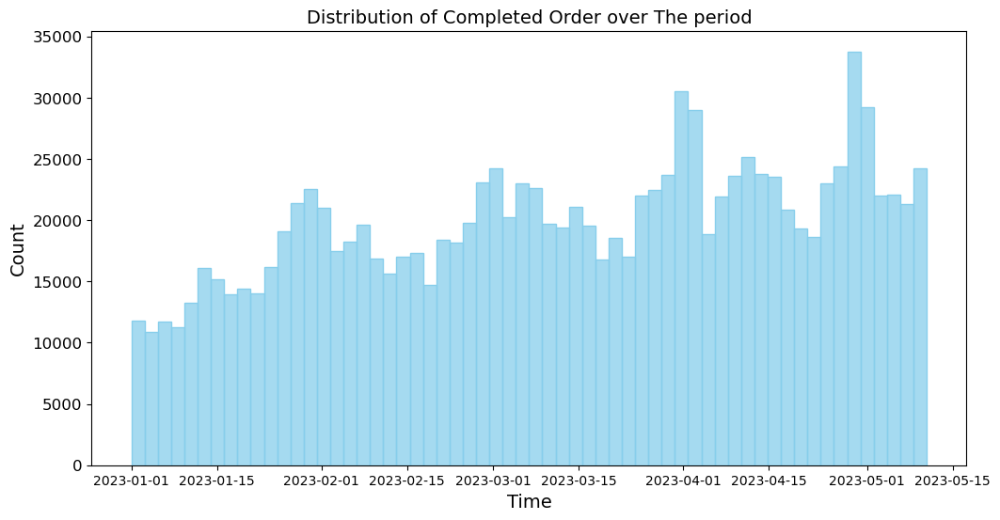

In [59]:
import seaborn as sns

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution using seaborn
sns.histplot(data=order_complete_id, x='when', bins=60, edgecolor='skyblue', color='skyblue')

# Set the labels and title
plt.xlabel('Time', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Distribution of Completed Order over The period', fontsize=14)
plt.tick_params(axis='y', labelsize=12)

# Show the plot
plt.show()


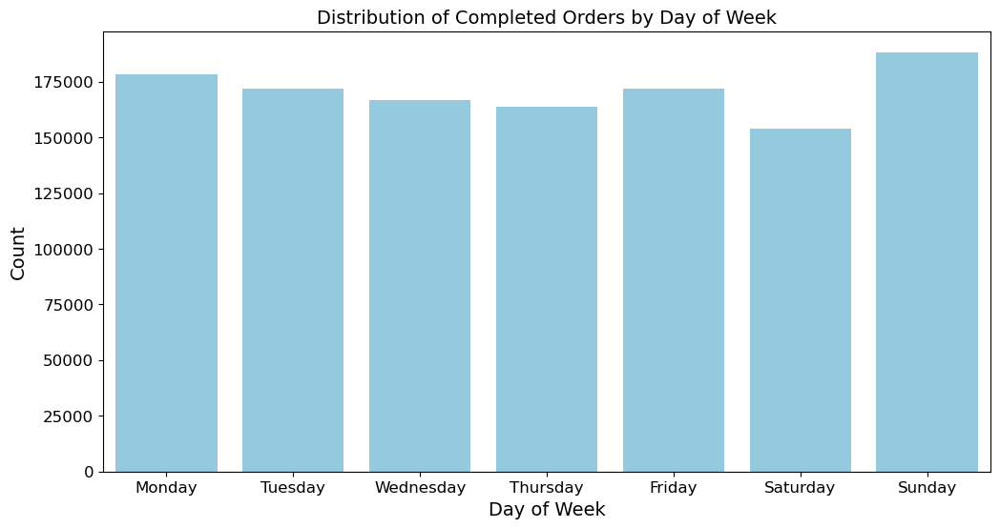

In [77]:
import seaborn as sns

# Extract the day of the week from the 'when' column
order_complete_id['day_of_week'] = order_complete_id['when'].dt.dayofweek

# Set the figure size
plt.figure(figsize=(12, 6))

# Calculate the count of completed orders by day of the week
day_of_week_counts = order_complete_id['day_of_week'].value_counts().sort_index()

# Plot the bar plot using seaborn with skyblue color
sns.barplot(x=day_of_week_counts.index, y=day_of_week_counts.values, color='skyblue')

# Set the labels and title
plt.xlabel('Day of Week', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Distribution of Completed Orders by Day of Week', fontsize=14)

# Set the x-axis tick labels
plt.xticks(range(7), ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], fontsize=12)
plt.tick_params(axis='both', labelsize=12)

# Show the plot
plt.show()


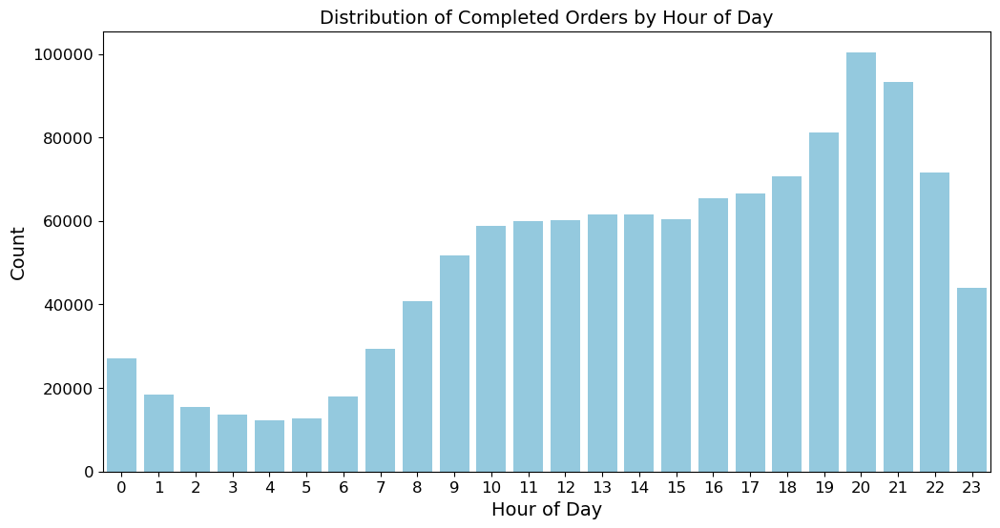

In [78]:
import seaborn as sns

# Set the figure size
plt.figure(figsize=(12, 6))

# Calculate the distribution by hour of the day
hour_of_day_distribution = order_complete_id['when'].dt.hour.value_counts().sort_index()

# Plot the bar graph using seaborn with skyblue color
sns.barplot(x=hour_of_day_distribution.index, y=hour_of_day_distribution.values, color='skyblue')

# Set the labels and title
plt.xlabel('Hour of Day', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Distribution of Completed Orders by Hour of Day', fontsize=14)

# Set the x-axis tick labels
plt.xticks(hour_of_day_distribution.index, fontsize=12)
plt.tick_params(axis='both', labelsize=12)

# Show the plot
plt.show()


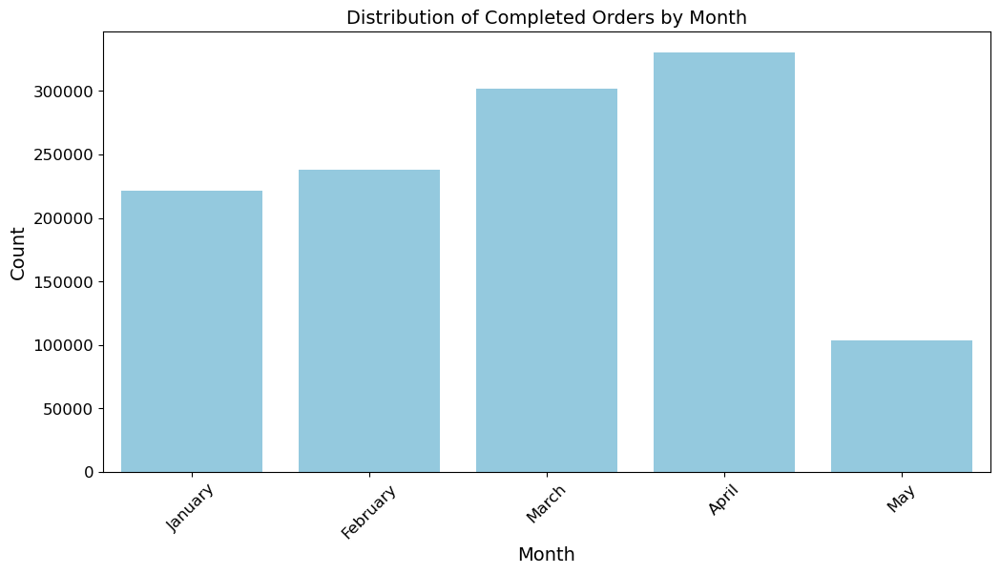

In [105]:
import seaborn as sns
import calendar

# Extract the month from the 'when' column
order_complete_id['month'] = order_complete_id['when'].dt.month

# Set the figure size
plt.figure(figsize=(12, 6))

# Calculate the distribution by month
month_distribution = order_complete_id['month'].value_counts().sort_index()

# Plot the bar graph using seaborn with skyblue color
sns.barplot(x=month_distribution.index, y=month_distribution.values, color='skyblue')

# Set the labels and title
plt.xlabel('Month', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Distribution of Completed Orders by Month', fontsize=14)

# Set the x-axis tick labels to month names
months = [calendar.month_name[i] for i in range(1, 6)]  # Adjusted range to include May
plt.xticks(ticks=range(5), labels=months, rotation=45, fontsize=12)
plt.tick_params(axis='both', labelsize=12)

# Show the plot
plt.show()


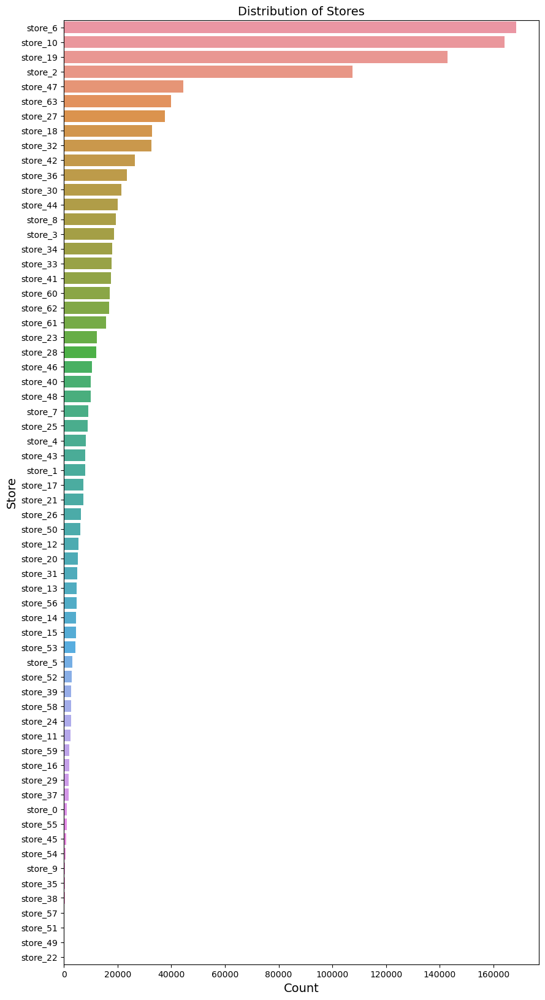

In [112]:
# Countplot for 'store' column
plt.figure(figsize=(10, 20))
sns.countplot(y='store', data=order_complete_id, order=order_complete_id['store'].value_counts().index)
plt.title('Distribution of Stores', fontsize=14)
plt.xlabel('Count', fontsize=14)
plt.ylabel('Store', fontsize=14)
plt.show()

      store             cleaned_codes  count
0  store_10                     TEV20  39683
1  store_10                  PAYDAY30  23895
2  store_10                    LOVE25  13354
3  store_19                 UKWEL15CJ  12479
4  store_41  FREE NECK PAIN E-COURSE   11435


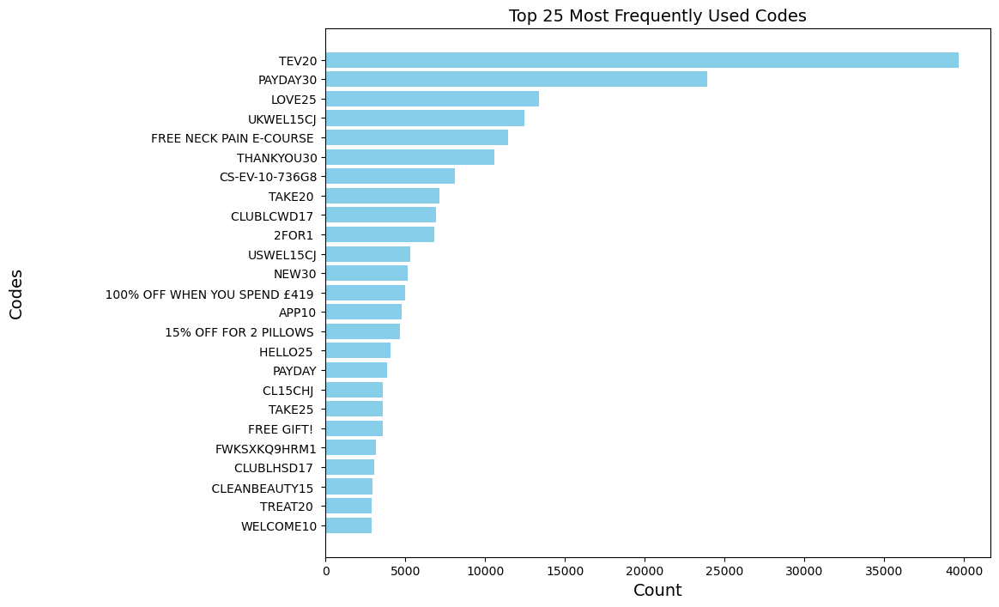

In [119]:
import pandas as pd

# Specify the file path of the CSV file
file_path = r'C:\Users\cherrychan9898\Downloads\top_5_code_by_store.csv' 

# Read the CSV file
top_5_code_by_store = pd.read_csv(file_path)

# Display the first few rows of the data
print(top_5_code_by_store.head())
top_25_codes = top_5_code_by_store.nlargest(25, 'count')

plt.figure(figsize=(10, 8))
plt.barh(top_25_codes['cleaned_codes'], top_25_codes['count'], color='skyblue')
plt.xlabel('Count', fontsize = 14)
plt.ylabel('Codes', fontsize = 14)
plt.title('Top 25 Most Frequently Used Codes', fontsize = 14)
plt.gca().invert_yaxis()
plt.show()

       store                                      cleaned_codes  count
0   store_10                                              TEV20  39683
1   store_10                                           PAYDAY30  23895
2   store_10                                             LOVE25  13354
3   store_19                                          UKWEL15CJ  12479
4   store_41                           FREE NECK PAIN E-COURSE   11435
5   store_10                                         THANKYOU30  10566
6    store_6                                     CS-EV-10-736G8   8113
7    store_2                                            TAKE20    7139
8   store_19                                        CLUBLCWD17    6897
9    store_2                                             2FOR1    6827
10  store_18                                          USWEL15CJ   5287
11  store_10                                              NEW30   5170
12  store_36  \n                    100% OFF WHEN YOU SPEND ...   4974
13   s

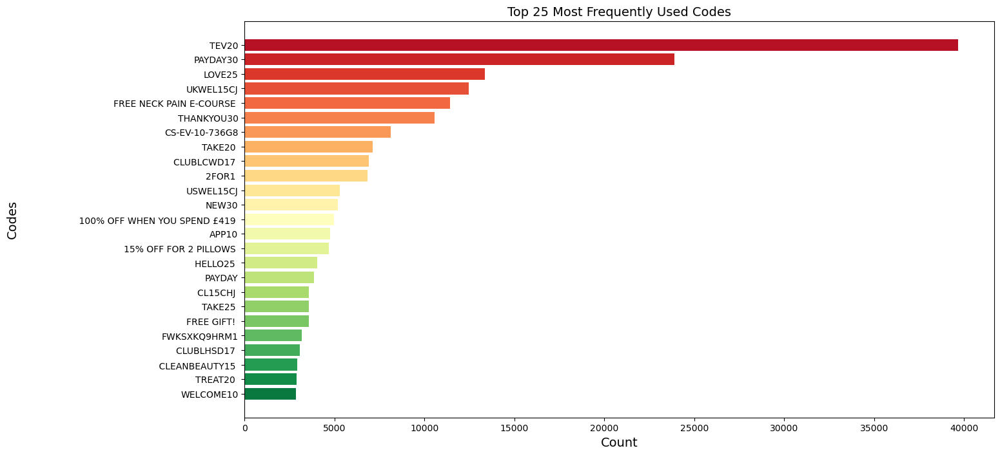

In [159]:
import pandas as pd
import matplotlib.pyplot as plt

# Specify the file path of the CSV file
file_path = r'C:\Users\cherrychan9898\Downloads\top_5_code_by_store.csv'

# Read the CSV file
top_5_code_by_store = pd.read_csv(file_path)

# Display the first few rows of the data
print(top_5_code_by_store.head(25))

# Sort the data by 'count' column and select the top 25 codes
top_25_codes = top_5_code_by_store.nlargest(25, 'count')
color_palette = sns.color_palette("RdYlGn", n_colors=len(top_25_codes))

plt.figure(figsize=(15, 8))
plt.barh(top_25_codes['cleaned_codes'], top_25_codes['count'], color=color_palette)
plt.xlabel('Count', fontsize=14)
plt.ylabel('Codes', fontsize=14)
plt.title('Top 25 Most Frequently Used Codes', fontsize=14)
plt.gca().invert_yaxis()
plt.show()



In [10]:
connection = sqlite3.connect('new_code_database.db')

query = "SELECT * FROM chunk_sql WHERE `checkout id` = '44edbd9a904fe714d5b33ababb5266fd'"

rsss = pd.read_sql_query(query, connection)

print(rsss)

connection.close()

    index                       checkout id    store  converted order name  \
0      18  44edbd9a904fe714d5b33ababb5266fd  store_0        1.0      #7591   
1      19  44edbd9a904fe714d5b33ababb5266fd  store_0        1.0      #7591   
2      20  44edbd9a904fe714d5b33ababb5266fd  store_0        1.0      #7591   
3      21  44edbd9a904fe714d5b33ababb5266fd  store_0        1.0      #7591   
4      22  44edbd9a904fe714d5b33ababb5266fd  store_0        1.0      #7591   
5      23  44edbd9a904fe714d5b33ababb5266fd  store_0        1.0      #7591   
6      24  44edbd9a904fe714d5b33ababb5266fd  store_0        1.0      #7591   
7      25  44edbd9a904fe714d5b33ababb5266fd  store_0        1.0      #7591   
8      26  44edbd9a904fe714d5b33ababb5266fd  store_0        1.0      #7591   
9      27  44edbd9a904fe714d5b33ababb5266fd  store_0        1.0      #7591   
10     28  44edbd9a904fe714d5b33ababb5266fd  store_0        1.0      #7591   
11     29  44edbd9a904fe714d5b33ababb5266fd  store_0        1.0 

In [8]:
import sqlite3
import pandas as pd

# Establish a connection to the SQLite database
connection = sqlite3.connect('new_code_database.db')

# Define your SQL query
query = "SELECT store, skus, `checkout id`, converted FROM chunk_sql WHERE converted = 1"

# Execute the query and retrieve the results into a DataFrame
store_sku_id = pd.read_sql_query(query, connection)

# Print the DataFrame
print(store_sku_id.head(15))

# Close the database connection
connection.close()


      store  skus                       checkout id  converted
0   store_0  AB01  44edbd9a904fe714d5b33ababb5266fd        1.0
1   store_0  AB01  44edbd9a904fe714d5b33ababb5266fd        1.0
2   store_0  AB01  44edbd9a904fe714d5b33ababb5266fd        1.0
3   store_0  AB01  44edbd9a904fe714d5b33ababb5266fd        1.0
4   store_0  AB01  44edbd9a904fe714d5b33ababb5266fd        1.0
5   store_0  AB01  44edbd9a904fe714d5b33ababb5266fd        1.0
6   store_0  AB01  44edbd9a904fe714d5b33ababb5266fd        1.0
7   store_0  AB01  44edbd9a904fe714d5b33ababb5266fd        1.0
8   store_0  AB01  44edbd9a904fe714d5b33ababb5266fd        1.0
9   store_0  AB01  44edbd9a904fe714d5b33ababb5266fd        1.0
10  store_0  AB01  44edbd9a904fe714d5b33ababb5266fd        1.0
11  store_0  AB01  44edbd9a904fe714d5b33ababb5266fd        1.0
12  store_0  None  44edbd9a904fe714d5b33ababb5266fd        1.0
13  store_0  None  44edbd9a904fe714d5b33ababb5266fd        1.0
14  store_0  None  44edbd9a904fe714d5b33ababb5266fd    

In [93]:
print(store_sku_id.head())
print(store_sku_id.shape[0])

     store  skus                       checkout id  converted
0  store_0  AB01  44edbd9a904fe714d5b33ababb5266fd        1.0
1  store_0  AB01  44edbd9a904fe714d5b33ababb5266fd        1.0
2  store_0  AB01  44edbd9a904fe714d5b33ababb5266fd        1.0
3  store_0  AB01  44edbd9a904fe714d5b33ababb5266fd        1.0
4  store_0  AB01  44edbd9a904fe714d5b33ababb5266fd        1.0
20857332


In [22]:
first_skus = store_sku_id.groupby(['checkout id', 'store'])['skus'].first().reset_index()
first_skus = first_skus.sort_values(by=['store', 'skus'], ascending=[False, False])

print(first_skus.head(15))

                             checkout id    store  \
784775  ba0ae9ba0b7301d03ca449d3a9acc985  store_9   
378024  61baaefab539f168d356056ae03a0266  store_9   
802795  bda9fe373980d5bc3b57c462797231d0  store_9   
413567  6ae53b61cfeb9b88544747d49f82c6d1  store_9   
118000  1e6ef4489ffc23b35c9837dadbb39ed9  store_9   
250903  40d4058dd5dbe2651ae8ee1721651dea  store_9   
616353  9859af03138bed414c966b971e93060c  store_9   
714075  abe5e6564666a036cb1aec01d6199b35  store_9   
510273  8317e9416777b347bd03740868031825  store_9   
29973   07b49b687080ae7f7ebb62e87dc0057b  store_9   
94984   187d79ba73a6d69bdabbaead2df9c972  store_9   
150645  26e8de393c7b09f13f03af0dbca6ecb0  store_9   
162013  29d46d4bae05b3bcbb4e24d5c70c8185  store_9   
363891  5e185af27d1cf0d85844d6623c3fb259  store_9   
697659  a896d75525aff84a4c958428ee300818  store_9   

                                   skus  
784775                  VQ7024G,VQ7009G  
378024                  VQ7023G,VQ6737G  
802795                  V

In [33]:
print(first_skus.shape[0])

1134477


In [90]:
filtered_skus = first_skus[first_skus['store'] == 'store_56']
print(filtered_skus)

                              checkout id     store  skus
330      001491391680213730ded48209825a3d  store_56  None
394      001847d856e58061db5e175eb81ef767  store_56  None
421      001a07ad027d88769eb1b8e90dbbf1c6  store_56  None
1266     0051039d366fc8ed4014ebc716e2a76e  store_56  None
1570     006375b56061f1af184cc3fa59ea37dc  store_56  None
...                                   ...       ...   ...
1134176  fff1752a41a02f2be9b1bbb6f62c0294  store_56  None
1134266  fff607f1939712d73ef76506df4d3730  store_56  None
1134267  fff63260d8d616ac6145f5330ec06919  store_56  None
1134319  fff83ab52f16aef3aa7c2fb86d78ed20  store_56  None
1134463  ffff477b78fa4d3d7305b33099960b0e  store_56  None

[7401 rows x 3 columns]


In [48]:
store_47_skus = first_skus[first_skus['store'] == 'store_47']
print(store_47_skus)

                              checkout id     store  \
1082575  f5a8661d90086b6efd16f7a1d2e2f6fd  store_47   
728277   aeb3abd852a541163564cc269b0ef76c  store_47   
1084171  f5fe22c40a2012c1918ddc25adaa9dae  store_47   
889483   cf080979c1978501c800bd42329296ee  store_47   
438165   713f1562844b2b5952027420f789d74e  store_47   
...                                   ...       ...   
1134300  fff7a31f4b856a6916ca6c1d0e54cdc3  store_47   
1134309  fff7de15adfc5c0786a29b8334f27fed  store_47   
1134367  fffa9dcf105c0ba6e5b3b5fdef8cc473  store_47   
1134379  fffb2b81b287cd6641224d447e32c117  store_47   
1134467  ffff82295114f64459ca1572c087e7d6  store_47   

                                                      skus  
1082575                                           S9V8TAUM  
728277                    S9V8MB3XL,S9V8DG2XL,S783V9NVY3XL  
1084171  S9V7LSM,S786V9PBM/L,S178CTNY2V9PBM,S153CTNY1V9...  
889483                                             S9V7LSM  
438165         S9V6TRBXL,S163SP2V7

In [45]:
# Assuming 'first_skus' is your original DataFrame
sku_counts_by_store = first_skus.groupby('store')['skus'].apply(lambda x: x.str.split(',', expand=True).stack().str.strip().value_counts()).reset_index(name='counts')

# Display the DataFrame with store and SKU counts
print(sku_counts_by_store)


          store  level_1  counts
0       store_0     AB01     378
1       store_0     AB02     144
2       store_0     Ab11     132
3       store_0     AB09     107
4       store_0     AB14      93
...         ...      ...     ...
125622  store_9  VQ6419G       1
125623  store_9  VQ6423G       1
125624  store_9  VQ6470G       1
125625  store_9  VQ6415G       1
125626  store_9  VQ7024G       1

[125627 rows x 3 columns]


In [46]:
import os
# Create the downloads folder if it doesn't exist
os.makedirs('downloads', exist_ok=True)

# Define the file path for the CSV file
file_path = os.path.join('downloads', 'sku_counts_by_store.csv')

# Save the DataFrame to the CSV file
sku_counts_by_store.to_csv(file_path, index=False)

# Print the file path for reference
print(f"CSV file saved in: {file_path}")

CSV file saved in: downloads\sku_counts_by_store.csv


In [88]:
sku_counts_by_store_56 = sku_counts_by_store[sku_counts_by_store['store'] == 'store_56']
print (sku_counts_by_store_56)

Empty DataFrame
Columns: [store, level_1, counts]
Index: []


In [51]:
sum_counts = sku_counts_by_store_47['counts'].sum()
sku_counts_df = pd.DataFrame({'Total Counts': [sum_counts]})
print(sku_counts_df)

   Total Counts
0         80137


In [95]:
unique_stores = sku_counts_by_store['store'].nunique()
unique_skus = sku_counts_by_store['level_1'].nunique()
total_counts = sku_counts_by_store['counts'].sum()
average_counts_per_sku = sku_counts_by_store['counts'].mean()
median_counts_per_sku = sku_counts_by_store['counts'].median()
max_counts_per_sku = sku_counts_by_store['counts'].max()
min_counts_per_sku = sku_counts_by_store['counts'].min()

print("Number of Unique Stores:", unique_stores)
print("Number of Unique SKUs:", unique_skus)
print("Total Counts:", total_counts)
print("Average Counts per SKU:", average_counts_per_sku)
print("Median Counts per SKU:", median_counts_per_sku)
print("Maximum Counts per SKU:", max_counts_per_sku)
print("Minimum Counts per SKU:", min_counts_per_sku)


Number of Unique Stores: 63
Number of Unique SKUs: 94779
Total Counts: 2044292
Average Counts per SKU: 16.272712076225652
Median Counts per SKU: 3.0
Maximum Counts per SKU: 54186
Minimum Counts per SKU: 1


In [97]:
store_stats = sku_counts_by_store.groupby('store')['counts'].agg(['sum', 'mean', 'median'])
store_stats = store_stats.sort_values(by='sum', ascending=False)
print(store_stats.head())

             sum        mean  median
store                               
store_6   258138   49.300611    20.0
store_2   242525   65.353005    15.0
store_10  217611  277.919540    53.0
store_19  215664   15.491991     7.0
store_63  121231   54.485843    15.0


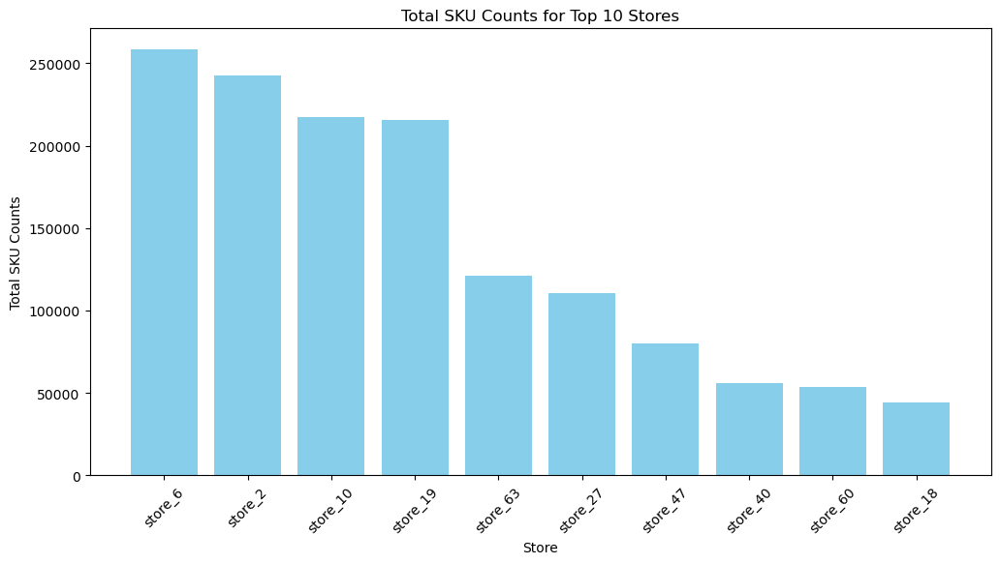

In [108]:
top_sku_stores = store_stats.head(10)
plt.figure(figsize=(12,6))
plt.bar(top_sku_stores.index, top_sku_stores['sum'], color='skyblue')
plt.title('Total SKU Counts for Top 10 Stores')
plt.xlabel('Store')
plt.ylabel('Total SKU Counts')
plt.xticks(rotation=45)
plt.show()

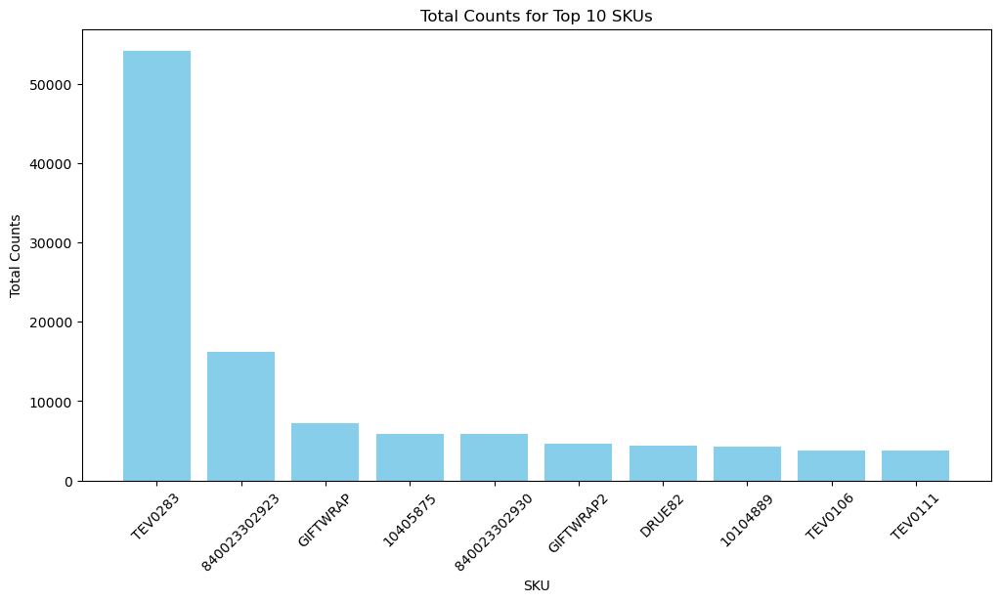

In [112]:
plt.figure(figsize=(12,6))
plt.bar(top_10_skus.index, top_10_skus['sum'], color='skyblue')
plt.title('Total Counts for Top 10 SKUs')
plt.xlabel('SKU')
plt.ylabel('Total Counts')
plt.xticks(rotation=45)
plt.show()

In [113]:
sku_per_store = sku_counts_by_store.groupby('store')['level_1'].nunique()
sku_per_store = sku_per_store.sort_values(ascending=False)
sku_per_store

store
store_47    25407
store_19    13921
store_18     9412
store_6      5236
store_46     5221
            ...  
store_0        16
store_49       16
store_41       15
store_37        4
store_22        3
Name: level_1, Length: 63, dtype: int64

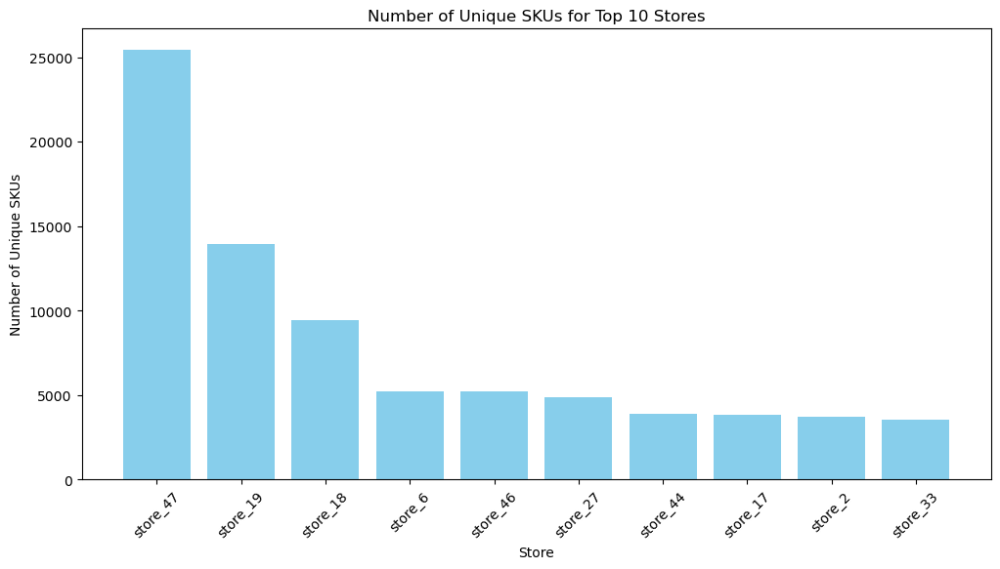

In [114]:
plt.figure(figsize=(12,6))
plt.bar(sku_per_store.index[:10], sku_per_store.values[:10], color='skyblue')
plt.title('Number of Unique SKUs for Top 10 Stores')
plt.xlabel('Store')
plt.ylabel('Number of Unique SKUs')
plt.xticks(rotation=45)
plt.show()

In [119]:
sorted_code_counts = code_counts.sort_values(by='count', ascending=False)
print(sorted_code_counts)

           store                         cleaned_codes  count
11065   store_10                                 TEV20  39683
10936   store_10                              PAYDAY30  23895
1819    store_10                                LOVE25  13354
28816   store_19                             UKWEL15CJ  12479
79734   store_41              FREE NECK PAIN E-COURSE   11435
...          ...                                   ...    ...
38917   store_19                      UNI-15UK-VPKYQM       1
38916   store_19                      UNI-15UK-VPEUXG       1
38915   store_19                      UNI-15UK-VP3KVE       1
38914   store_19                      UNI-15UK-VNZRXC       1
111264   store_9  •••• K3B9 Gift card ending with K3B9      1

[111265 rows x 3 columns]


In [151]:
import Levenshtein

# Function to check if two strings are similar based on Levenshtein distance
def is_similar(string1, string2, threshold):
    distance = Levenshtein.distance(string1, string2)
    similarity = (len(string1) - distance) / len(string1)
    return similarity >= threshold

In [149]:
store_10_code_counts = code_counts[code_counts['store'] == 'store_10']
print(store_10_code_counts.head)
print(store_10_code_counts[store_10_code_counts['cleaned_codes'] == 'PAYDAY30'])

<bound method NDFrame.head of           store                                      cleaned_codes  count
1435   store_10  \n                    BUYONEGETONE \n         ...      1
1436   store_10                                              TEV20      1
1437   store_10                                             TEV20       1
1438   store_10                                         'PAYDAY30'      1
1439   store_10                                          'SPRAY20'      2
...         ...                                                ...    ...
11375  store_10                                         thankyou30     29
11376  store_10                                                vet      1
11377  store_10                                          ‘LOVE25’.      1
11378  store_10                                       ‘Pay day 30’      1
11379  store_10                                          ‘SPRAY20’      1

[9945 rows x 3 columns]>
          store cleaned_codes  count
10936  store_10    

In [127]:
total_usage_per_store = code_counts.groupby('store')['count'].sum().sort_values(ascending=False)

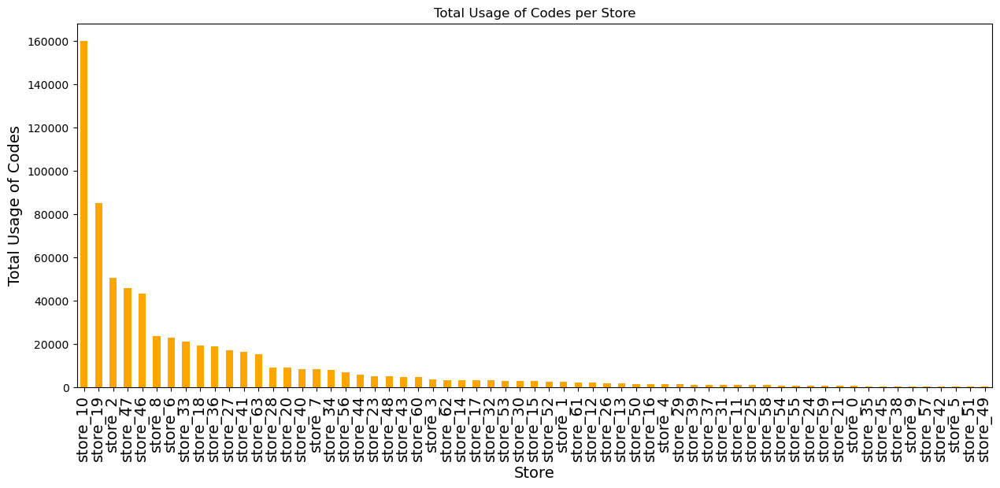

In [130]:
plt.figure(figsize=(15, 6))
total_usage_per_store.plot(kind='bar', color='orange')
plt.xlabel('Store', fontsize = 14)
plt.ylabel('Total Usage of Codes', fontsize = 14)
plt.title('Total Usage of Codes per Store')
plt.xticks(rotation=90, fontsize = 14)
plt.show()

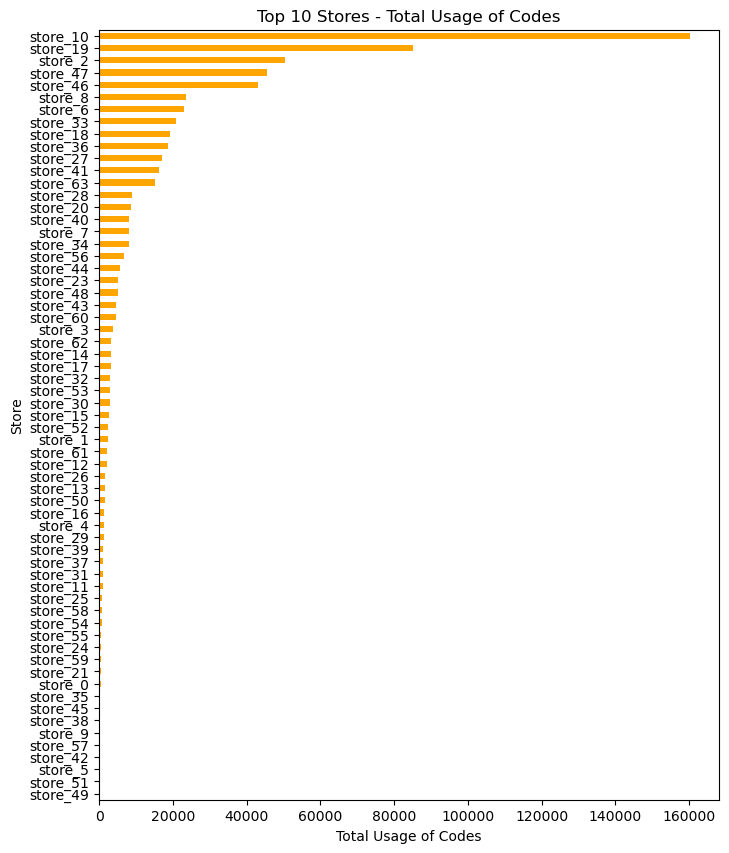

In [158]:
top_10_stores = code_counts.groupby('store')['count'].sum().sort_values(ascending=True)

plt.figure(figsize=(8, 10))
top_10_stores.plot(kind='barh', color='orange')
plt.xlabel('Total Usage of Codes')
plt.ylabel('Store')
plt.title('Top 10 Stores - Total Usage of Codes')
plt.show()

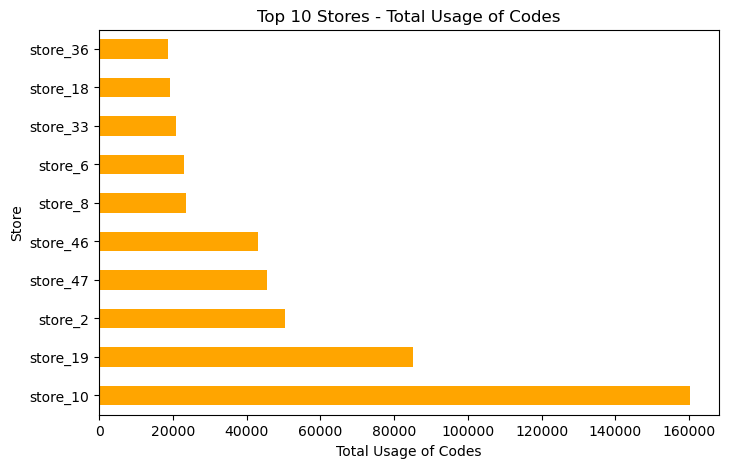

In [183]:
top_10_stores = code_counts.groupby('store')['count'].sum().sort_values(ascending=False).nlargest(10)

plt.figure(figsize=(8, 5))
top_10_stores.plot(kind='barh', color='orange')
plt.xlabel('Total Usage of Codes')
plt.ylabel('Store')
plt.title('Top 10 Stores - Total Usage of Codes')
plt.show()

In [165]:
#codes are used across more than 1 stores
store_counts = top_codes_by_store.groupby('cleaned_codes')['store'].nunique()
codes_multiple_stores = store_counts[store_counts > 1].index.tolist()
print (codes_multiple_stores)

['', ' GET 1 FREE ', '10% OFF WHEN BUYING 3 OR MORE. ', '100% OFF ', '15% OFF FOR 2 PILLOWS ', '5% OFF WHEN BUYING 2. ', 'APPMYSTERY ', 'BUY 1', 'CL15CHJ ', 'CL57J0Q ', 'COUNTYDOWNUNDER ', 'DASHA20', 'DAYONE10 ', 'FREE GIFT ', 'FREE GIFT! ', 'FREE GOLD MEMBER GIFT ', 'GCMAY ', 'GET15', 'LANY15 ', 'N10DWGPHVPNYZH ', 'NEW15', 'NEW20', 'PAYDAY30', 'R10VPNYZHDWGPH ', 'SAVE10', 'SNEAKNEWBIE ', 'SOCIAL20 ', 'SPRING15 ', 'SPRING20 ', 'STACK10 ', 'STARTER PACK SHAKER ', 'SWITCH40 ', 'TREAT20 ', 'TRINA20', 'WELCOME10', 'WELCOME10 ', 'XYSH1HS5 ']


In [184]:
multi_store_codes_df = top_codes_by_store[top_codes_by_store['cleaned_codes'].isin(codes_multiple_stores)]
multi_store_codes_grouped = multi_store_codes_df.groupby('cleaned_codes')['store'].apply(list)
multi_store_codes_df = multi_store_codes_grouped.reset_index()
multi_store_codes_df.columns = ['Cleaned Codes', 'Stores']
# Display the DataFrame
multi_store_codes_df.style.set_properties(**{'text-align': 'left'})

,Cleaned Codes,Stores
0,,"['store_27', 'store_28', 'store_40']"
1,GET 1 FREE,"['store_63', 'store_62', 'store_60', 'store_61', 'store_58', 'store_59', 'store_57']"
2,10% OFF WHEN BUYING 3 OR MORE.,"['store_52', 'store_53', 'store_54', 'store_50', 'store_55', 'store_51', 'store_49']"
3,100% OFF,"['store_63', 'store_60', 'store_62', 'store_61', 'store_58', 'store_59', 'store_57']"
4,15% OFF FOR 2 PILLOWS,"['store_41', 'store_37']"
5,5% OFF WHEN BUYING 2.,"['store_50', 'store_53', 'store_52', 'store_55', 'store_54', 'store_49', 'store_51']"
6,APPMYSTERY,"['store_18', 'store_17']"
7,BUY 1,"['store_63', 'store_62', 'store_60', 'store_61', 'store_58', 'store_59', 'store_57']"
8,CL15CHJ,"['store_19', 'store_15']"
9,CL57J0Q,"['store_18', 'store_15', 'store_16']"


In [191]:
import sqlite3
import pandas as pd
connection = sqlite3.connect('new_code_database.db')

query = "SELECT * FROM chunk_sql WHERE event = 'failed_code' and converted = TRUE"

failed_code_complete = pd.read_sql_query(query, connection)

print(failed_code_complete.head())

connection.close()

   index                       checkout id    store  converted order name  \
0    376  49fc0f497c324c86c5acafeb272e2e75  store_0        1.0      #7627   
1    785  6a6e5553b84384c7fdfc25008db5bffc  store_0        1.0      #7658   
2    924  b84b01287cbd61982f3a66a63d92616d  store_0        1.0      #7667   
3    955  49cdaec1c29019cf3f4f17985e9c4688  store_0        1.0      #7669   
4    957  49cdaec1c29019cf3f4f17985e9c4688  store_0        1.0      #7669   

  currency  value        event  \
0      USD  115.2  failed_code   
1      USD  114.0  failed_code   
2      USD   69.0  failed_code   
3      USD   45.0  failed_code   
4      USD   45.0  failed_code   

                                                when customer  step  type  \
0  Sun Jan 01 2023 23:19:15 GMT+0000 (Greenwich M...      c36  None  None   
1  Tue Jan 03 2023 05:15:33 GMT+0000 (Greenwich M...      c64  None  None   
2  Tue Jan 03 2023 18:59:39 GMT+0000 (Greenwich M...     None  None  None   
3  Tue Jan 03 2023 21:09

In [192]:
def parse_datetime(datetime_str):
    match = re.search(r'\w{3} \w{3} \d{2} \d{4} \d{2}:\d{2}:\d{2}', datetime_str)
    if match:
        return datetime.strptime(match.group(), '%a %b %d %Y %H:%M:%S')
    else:
        return None
failed_code_complete['when'] = failed_code_complete['when'].apply(parse_datetime)

In [193]:
print (failed_code_complete.shape[0])

149430


In [199]:
import sqlite3
import pandas as pd
connection = sqlite3.connect('new_code_database.db')

query = "SELECT * FROM chunk_sql WHERE event = 'failed_code' and converted IS NULL"

failed_code_no_completed = pd.read_sql_query(query, connection)

print(failed_code_no_completed.head())

connection.close()

   index                       checkout id    store converted order name  \
0    168  bb52e8da8c23dc2484b6339aa366de9a  store_0      None       None   
1    174  bb52e8da8c23dc2484b6339aa366de9a  store_0      None       None   
2    410  ce016a8fc68673ce53f8924b37b43aac  store_0      None       None   
3    415  ce016a8fc68673ce53f8924b37b43aac  store_0      None       None   
4    432  1370680c08c9cb93170c06e22175d32b  store_0      None       None   

  currency value        event  \
0     None  None  failed_code   
1     None  None  failed_code   
2     None  None  failed_code   
3     None  None  failed_code   
4     None  None  failed_code   

                                                when customer  step  type  \
0  Sun Jan 01 2023 09:57:21 GMT+0000 (Greenwich M...     None  None  None   
1  Sun Jan 01 2023 09:59:07 GMT+0000 (Greenwich M...     None  None  None   
2  Mon Jan 02 2023 02:25:38 GMT+0000 (Greenwich M...     None  None  None   
3  Mon Jan 02 2023 02:26:24 GMT+0000

In [200]:
print (failed_code_no_completed.shape[0])

213349


In [29]:
import sqlite3
import pandas as pd
connection = sqlite3.connect('new_code_database.db')
query = "SELECT * FROM chunk_sql WHERE `checkout id` = '0e06406ffe8ff81ad18c5d485f93568d'"
ss = pd.read_sql_query(query, connection)
print(ss)
connection.close()

   index                       checkout id    store  converted order name  \
0     64  0e06406ffe8ff81ad18c5d485f93568d  store_0        1.0      #7595   
1     65  0e06406ffe8ff81ad18c5d485f93568d  store_0        1.0      #7595   
2     66  0e06406ffe8ff81ad18c5d485f93568d  store_0        1.0      #7595   
3     67  0e06406ffe8ff81ad18c5d485f93568d  store_0        1.0      #7595   
4     68  0e06406ffe8ff81ad18c5d485f93568d  store_0        1.0      #7595   

  currency  value           event  \
0      USD   75.0   checkout_load   
1      USD   75.0   checkout_load   
2      USD   75.0  order_complete   
3      USD   75.0   checkout_load   
4      USD   75.0   checkout_load   

                                                when customer  \
0  Sun Jan 01 2023 01:45:07 GMT+0000 (Greenwich M...     None   
1  Sun Jan 01 2023 01:45:08 GMT+0000 (Greenwich M...     None   
2  Sun Jan 01 2023 01:45:48 GMT+0000 (Greenwich M...       c7   
3  Sun Jan 01 2023 01:45:48 GMT+0000 (Greenwich M...  

In [198]:
import sqlite3
import pandas as pd
connection = sqlite3.connect('new_code_database.db')

query = "SELECT * FROM chunk_sql WHERE event = 'good_code' and converted IS NULL"
good_code_no_completed = pd.read_sql_query(query, connection)
print(good_code_no_completed.head())
connection.close()

   index                       checkout id    store converted order name  \
0    171  bb52e8da8c23dc2484b6339aa366de9a  store_0      None       None   
1    418  ce016a8fc68673ce53f8924b37b43aac  store_0      None       None   
2    435  1370680c08c9cb93170c06e22175d32b  store_0      None       None   
3    441  1370680c08c9cb93170c06e22175d32b  store_0      None       None   
4    596  cf000d25a6d395e838148dbf88970fd6  store_0      None       None   

  currency value      event  \
0     None  None  good_code   
1     None  None  good_code   
2     None  None  good_code   
3     None  None  good_code   
4     None  None  good_code   

                                                when customer  step  type  \
0  Sun Jan 01 2023 09:57:33 GMT+0000 (Greenwich M...     None  None  None   
1  Mon Jan 02 2023 02:26:31 GMT+0000 (Greenwich M...     None  None  None   
2  Mon Jan 02 2023 03:15:52 GMT+0000 (Greenwich M...     None  None  None   
3  Mon Jan 02 2023 03:16:26 GMT+0000 (Greenwich 

In [201]:
print (good_code_no_completed.shape[0])

350746


In [202]:
import sqlite3
import pandas as pd
connection = sqlite3.connect('new_code_database.db')

query = "SELECT * FROM chunk_sql WHERE event = 'good_code' and converted = TRUE"
good_code_completed = pd.read_sql_query(query, connection)
print(good_code_completed.shape[0])
connection.close()

378872


In [4]:
import sqlite3
import pandas as pd
# Connect to the database
connection = sqlite3.connect('new_code_database.db')

query = "SELECT * FROM chunk_sql WHERE event IN ('failed_code', 'generate_rescue_code')"

# Execute the query and retrieve the results into a DataFrame
converted_failed_rescue = pd.read_sql_query(query, connection)

# Close the database connection
connection.close()

# Print the resulting DataFrame
print(converted_failed_rescue)


           index                       checkout id     store  converted  \
0            168  bb52e8da8c23dc2484b6339aa366de9a   store_0        NaN   
1            169  bb52e8da8c23dc2484b6339aa366de9a   store_0        NaN   
2            174  bb52e8da8c23dc2484b6339aa366de9a   store_0        NaN   
3            175  bb52e8da8c23dc2484b6339aa366de9a   store_0        NaN   
4            376  49fc0f497c324c86c5acafeb272e2e75   store_0        1.0   
...          ...                               ...       ...        ...   
463970  31098684  efe18b83e5ad887b2bb93984c24f2843  store_63        NaN   
463971  31098690  efe18b83e5ad887b2bb93984c24f2843  store_63        NaN   
463972  31098765  ca147a71ae3cb6c08ce1465e50620f5f  store_63        NaN   
463973  31099401  ac78898d8ea0a19b3b07272ec9b3f38d  store_63        NaN   
463974  31099403  ac78898d8ea0a19b3b07272ec9b3f38d  store_63        NaN   

       order name currency  value                 event  \
0            None     None    NaN       

In [5]:
grouped_counts = converted_failed_rescue.groupby(['checkout id', 'event']).size().reset_index(name='count')
print(grouped_counts.head(20))
print(grouped_counts.shape[0])

                         checkout id                 event  count
0   000085a4d66e1380b882c5e43a48f971           failed_code      1
1   000085a4d66e1380b882c5e43a48f971  generate_rescue_code      1
2   0002249e1c84cfa7874a20fa65211f92           failed_code      1
3   00028d4082580db33ef1fb15e2b7d9b1           failed_code      3
4   0002c20f868147771521a0a8a8e8a1fa           failed_code      1
5   0002edfe90c7415156c616056f639081           failed_code      4
6   0002edfe90c7415156c616056f639081  generate_rescue_code      4
7   00034ef53a27e5565cf335fe88cd6b84           failed_code      1
8   00035abc7be99921da2ebcb36f6e335e           failed_code      1
9   00035abc7be99921da2ebcb36f6e335e  generate_rescue_code      1
10  0005cbfc31fc3757cd19f0de9b539286           failed_code      3
11  0005cbfc31fc3757cd19f0de9b539286  generate_rescue_code      3
12  0005f77ba8704df5c8874280f133e94e           failed_code      1
13  0005f77ba8704df5c8874280f133e94e  generate_rescue_code      1
14  0006b8

In [6]:
pivoted_data = grouped_counts.pivot_table(index='checkout id', columns='event', values='count', fill_value=0)
print(pivoted_data)

event                             failed_code  generate_rescue_code
checkout id                                                        
000085a4d66e1380b882c5e43a48f971            1                     1
0002249e1c84cfa7874a20fa65211f92            1                     0
00028d4082580db33ef1fb15e2b7d9b1            3                     0
0002c20f868147771521a0a8a8e8a1fa            1                     0
0002edfe90c7415156c616056f639081            4                     4
...                                       ...                   ...
fffe38f10699c623daf20e594012031a            2                     2
fffe58b5e01af037673757bea427a9d8            1                     0
ffff043ff1f51c9c99095a513ea3ede4            1                     1
ffff0ca6acc68ab507e54a0a272219bc            1                     1
ffff374d9c48d653f2fc29711007c3d5            1                     1

[161154 rows x 2 columns]


In [7]:
total_failed_code = pivoted_data['failed_code'].sum()
total_generate_rescue_code = pivoted_data['generate_rescue_code'].sum()

print("Total 'failed_code' events:", total_failed_code)
print("Total 'generate_rescue_code' events:", total_generate_rescue_code)
print("Overall average of failed code to rescue code:", total_generate_rescue_code/total_failed_code)

Total 'failed_code' events: 362779
Total 'generate_rescue_code' events: 101196
Overall average of failed code to rescue code: 0.27894668655021376


In [8]:
pivoted_data.reset_index(drop=True, inplace=True)  # Reset the index without adding a new column
pivoted_data.columns.name = None  # Remove the column name
pivoted_data['rescue_to_failed_ratio'] = (pivoted_data['generate_rescue_code'] / pivoted_data['failed_code']).round(4)
print(pivoted_data[['failed_code', 'generate_rescue_code', 'rescue_to_failed_ratio']])

        failed_code  generate_rescue_code  rescue_to_failed_ratio
0                 1                     1                     1.0
1                 1                     0                     0.0
2                 3                     0                     0.0
3                 1                     0                     0.0
4                 4                     4                     1.0
...             ...                   ...                     ...
161149            2                     2                     1.0
161150            1                     0                     0.0
161151            1                     1                     1.0
161152            1                     1                     1.0
161153            1                     1                     1.0

[161154 rows x 3 columns]


In [9]:
examples = pivoted_data[pivoted_data['rescue_to_failed_ratio'] > 0]
examples.head(10)

,failed_code,generate_rescue_code,rescue_to_failed_ratio
0,1,1,1.0
4,4,4,1.0
6,1,1,1.0
7,3,3,1.0
8,1,1,1.0
10,1,1,1.0
11,2,2,1.0
14,1,1,1.0
16,1,1,1.0
19,5,5,1.0


In [10]:
print(pivoted_data['rescue_to_failed_ratio'].describe())

count    161154.000000
mean          0.336137
std           0.465554
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max           3.000000
Name: rescue_to_failed_ratio, dtype: float64


In [246]:
max_ratio_row = pivoted_data.loc[pivoted_data['rescue_to_failed_ratio'].idxmax()]

print("Row with the maximum 'rescue_to_failed_ratio':")
print(max_ratio_row)

Row with the maximum 'rescue_to_failed_ratio':
level_0                                               2842
index                                                 2842
checkout id               05cbb485a21ca0cf417a2221a9661f4b
failed_code                                              1
generate_rescue_code                                     3
rescue_to_failed_ratio                                 3.0
Name: 2842, dtype: object


In [26]:
rescue_failed_converted = pivoted_data.merge(converted_failed_rescue, left_index=True, right_index=True, how='left')
selected_columns = ['checkout id', 'converted', 'failed_code', 'generate_rescue_code']
rescue_failed_if_complete = rescue_failed_converted[selected_columns]
print ('Number of checkout with failed code or :', rescue_failed_if_complete.shape[0])
rescue_failed_if_complete

,checkout id,converted,failed_code,generate_rescue_code
0,bb52e8da8c23dc2484b6339aa366de9a,NaN,1,1
1,bb52e8da8c23dc2484b6339aa366de9a,NaN,1,0
2,bb52e8da8c23dc2484b6339aa366de9a,NaN,3,0
3,bb52e8da8c23dc2484b6339aa366de9a,NaN,1,0
4,49fc0f497c324c86c5acafeb272e2e75,1.0,4,4
...,...,...,...,...
161149,060c904dca0bee98da3bae4af911e59a,1.0,2,2
161150,060c904dca0bee98da3bae4af911e59a,1.0,1,0
161151,8ce48a8d4019a9f9ef3b3bdbc2c5b8aa,NaN,1,1
161152,8ce48a8d4019a9f9ef3b3bdbc2c5b8aa,NaN,1,1


In [33]:
converted_rescue_failed = rescue_failed_if_complete[rescue_failed_if_complete['generate_rescue_code'] == 0]
print ('Number of checkout when no rescue code generated after failed code:', converted_rescue_failed.shape[0])
converted_rescue_failed

Number of checkout when no rescue code generated after failed code: 104862


,checkout id,converted,failed_code,generate_rescue_code
1,bb52e8da8c23dc2484b6339aa366de9a,NaN,1,0
2,bb52e8da8c23dc2484b6339aa366de9a,NaN,3,0
3,bb52e8da8c23dc2484b6339aa366de9a,NaN,1,0
5,49fc0f497c324c86c5acafeb272e2e75,1.0,1,0
9,ce016a8fc68673ce53f8924b37b43aac,NaN,1,0
...,...,...,...,...
161145,5e079b94af2ffbd2e992fce3f3aed7d1,NaN,1,0
161146,dcafa9f70509be28fa45cc1a66bed0b3,1.0,2,0
161147,dcd1f8230190433c5e80fde758bf40c0,NaN,1,0
161148,dcd1f8230190433c5e80fde758bf40c0,NaN,7,0


In [34]:
filtered_rescue_null_converted_true = rescue_failed_if_complete[(rescue_failed_if_complete['generate_rescue_code'] == 0) & (rescue_failed_if_complete['converted'] == True)]
print('Number of checkout when no rescue code is generated but stll converted:', filtered_rescue_null_converted_true.shape[0])
filtered_rescue_null_converted_true

Number of checkout when no rescue code is generated but stll converted: 49663


,checkout id,converted,failed_code,generate_rescue_code
5,49fc0f497c324c86c5acafeb272e2e75,1.0,1,0
20,6a6e5553b84384c7fdfc25008db5bffc,1.0,3,0
26,49cdaec1c29019cf3f4f17985e9c4688,1.0,1,0
27,49cdaec1c29019cf3f4f17985e9c4688,1.0,4,0
28,49cdaec1c29019cf3f4f17985e9c4688,1.0,3,0
...,...,...,...,...
161094,91acb35e19776745033b8229a5884e2c,1.0,5,0
161108,a3bcdde00ead905787e8a8fccf0f466f,1.0,1,0
161112,665d53c0df52e4485467361496740f17,1.0,1,0
161146,dcafa9f70509be28fa45cc1a66bed0b3,1.0,2,0


In [35]:
rescue_generated = rescue_failed_if_complete[rescue_failed_if_complete['generate_rescue_code'] != 0]
print ('Number of checkout when rescue code generated after failed code:', rescue_generated.shape[0])
rescue_generated

Number of checkout when rescue code generated after failed code: 56292


,checkout id,converted,failed_code,generate_rescue_code
0,bb52e8da8c23dc2484b6339aa366de9a,NaN,1,1
4,49fc0f497c324c86c5acafeb272e2e75,1.0,4,4
6,ce016a8fc68673ce53f8924b37b43aac,NaN,1,1
7,ce016a8fc68673ce53f8924b37b43aac,NaN,3,3
8,ce016a8fc68673ce53f8924b37b43aac,NaN,1,1
...,...,...,...,...
161144,5e079b94af2ffbd2e992fce3f3aed7d1,NaN,1,1
161149,060c904dca0bee98da3bae4af911e59a,1.0,2,2
161151,8ce48a8d4019a9f9ef3b3bdbc2c5b8aa,NaN,1,1
161152,8ce48a8d4019a9f9ef3b3bdbc2c5b8aa,NaN,1,1


In [36]:
rescue_generated_converted = rescue_failed_if_complete[(rescue_failed_if_complete['generate_rescue_code'] != 0) & (rescue_failed_if_complete['converted'] == True)]
print('Number of checkout when rescue code is generated and converted:', rescue_generated_converted.shape[0])
rescue_generated_converted

Number of checkout when rescue code is generated and converted: 26388


,checkout id,converted,failed_code,generate_rescue_code
4,49fc0f497c324c86c5acafeb272e2e75,1.0,4,4
21,6a6e5553b84384c7fdfc25008db5bffc,1.0,1,1
24,b84b01287cbd61982f3a66a63d92616d,1.0,1,1
25,b84b01287cbd61982f3a66a63d92616d,1.0,2,2
29,49cdaec1c29019cf3f4f17985e9c4688,1.0,1,1
...,...,...,...,...
161072,1195849b031e75f8579b83cf4cf7d28a,1.0,1,1
161083,ee3e05ae470a55e2551a06bf31241212,1.0,1,1
161107,a3bcdde00ead905787e8a8fccf0f466f,1.0,11,11
161113,665d53c0df52e4485467361496740f17,1.0,1,1


In [39]:
print('It indicates that a considerable number of customers were motivated enough to make a purchase despite experiencing a failed code without any subsequent assistance.')
print(49663/104862)

It indicates that a considerable number of customers were motivated enough to make a purchase despite experiencing a failed code without any subsequent assistance.
0.47360340256718353


In [40]:
print('This signifies the instances where customers not only received a rescue code but also converted successfully. It highlights the effectiveness of rescue codes in motivating customers to overcome their initial obstacle and complete their purchase.')
print(26388/56292)

This signifies the instances where customers not only received a rescue code but also converted successfully. It highlights the effectiveness of rescue codes in motivating customers to overcome their initial obstacle and complete their purchase.
0.4687699850778086


In [41]:
failed_converted = rescue_failed_if_complete[(rescue_failed_if_complete['converted'] == True)]
print('Number of checkout when code failed but converted:', failed_converted.shape[0])
failed_converted

Number of checkout when code failed but converted: 76051


,checkout id,converted,failed_code,generate_rescue_code
4,49fc0f497c324c86c5acafeb272e2e75,1.0,4,4
5,49fc0f497c324c86c5acafeb272e2e75,1.0,1,0
20,6a6e5553b84384c7fdfc25008db5bffc,1.0,3,0
21,6a6e5553b84384c7fdfc25008db5bffc,1.0,1,1
24,b84b01287cbd61982f3a66a63d92616d,1.0,1,1
...,...,...,...,...
161112,665d53c0df52e4485467361496740f17,1.0,1,0
161113,665d53c0df52e4485467361496740f17,1.0,1,1
161146,dcafa9f70509be28fa45cc1a66bed0b3,1.0,2,0
161149,060c904dca0bee98da3bae4af911e59a,1.0,2,2


In [42]:
print (76051/161154)

0.47191506261091876


In [43]:
import sqlite3
import pandas as pd
# Connect to the database
connection = sqlite3.connect('new_code_database.db')

query = "SELECT * FROM chunk_sql WHERE event IN ('failed_code', 'generate_rescue_code', 'add_gwp')"

# Execute the query and retrieve the results into a DataFrame
failed_rescue_add = pd.read_sql_query(query, connection)

# Close the database connection
connection.close()

# Print the resulting DataFrame
print(failed_rescue_add)


           index                       checkout id     store  converted  \
0            168  bb52e8da8c23dc2484b6339aa366de9a   store_0        NaN   
1            169  bb52e8da8c23dc2484b6339aa366de9a   store_0        NaN   
2            174  bb52e8da8c23dc2484b6339aa366de9a   store_0        NaN   
3            175  bb52e8da8c23dc2484b6339aa366de9a   store_0        NaN   
4            376  49fc0f497c324c86c5acafeb272e2e75   store_0        1.0   
...          ...                               ...       ...        ...   
464022  31098684  efe18b83e5ad887b2bb93984c24f2843  store_63        NaN   
464023  31098690  efe18b83e5ad887b2bb93984c24f2843  store_63        NaN   
464024  31098765  ca147a71ae3cb6c08ce1465e50620f5f  store_63        NaN   
464025  31099401  ac78898d8ea0a19b3b07272ec9b3f38d  store_63        NaN   
464026  31099403  ac78898d8ea0a19b3b07272ec9b3f38d  store_63        NaN   

       order name currency  value                 event  \
0            None     None    NaN       

In [44]:
grouped_counts2 = failed_rescue_add.groupby(['checkout id', 'event']).size().reset_index(name='count')
print(grouped_counts2.head(20))
print(grouped_counts2.shape[0])

                         checkout id                 event  count
0   000085a4d66e1380b882c5e43a48f971           failed_code      1
1   000085a4d66e1380b882c5e43a48f971  generate_rescue_code      1
2   0002249e1c84cfa7874a20fa65211f92           failed_code      1
3   00028d4082580db33ef1fb15e2b7d9b1           failed_code      3
4   0002c20f868147771521a0a8a8e8a1fa           failed_code      1
5   0002edfe90c7415156c616056f639081           failed_code      4
6   0002edfe90c7415156c616056f639081  generate_rescue_code      4
7   00034ef53a27e5565cf335fe88cd6b84           failed_code      1
8   00035abc7be99921da2ebcb36f6e335e           failed_code      1
9   00035abc7be99921da2ebcb36f6e335e  generate_rescue_code      1
10  0005cbfc31fc3757cd19f0de9b539286           failed_code      3
11  0005cbfc31fc3757cd19f0de9b539286  generate_rescue_code      3
12  0005f77ba8704df5c8874280f133e94e           failed_code      1
13  0005f77ba8704df5c8874280f133e94e  generate_rescue_code      1
14  0006b8

In [45]:
pivoted_data2 = grouped_counts2.pivot_table(index='checkout id', columns='event', values='count', fill_value=0)
print(pivoted_data2)

event                             add_gwp  failed_code  generate_rescue_code
checkout id                                                                 
000085a4d66e1380b882c5e43a48f971        0            1                     1
0002249e1c84cfa7874a20fa65211f92        0            1                     0
00028d4082580db33ef1fb15e2b7d9b1        0            3                     0
0002c20f868147771521a0a8a8e8a1fa        0            1                     0
0002edfe90c7415156c616056f639081        0            4                     4
...                                   ...          ...                   ...
fffe38f10699c623daf20e594012031a        0            2                     2
fffe58b5e01af037673757bea427a9d8        0            1                     0
ffff043ff1f51c9c99095a513ea3ede4        0            1                     1
ffff0ca6acc68ab507e54a0a272219bc        0            1                     1
ffff374d9c48d653f2fc29711007c3d5        0            1                     1

In [49]:
add_gwp_data = pivoted_data2[pivoted_data2['add_gwp'] != 0]
print(add_gwp_data.shape[0])
add_gwp_data

41


event,add_gwp,failed_code,generate_rescue_code
checkout id,,,
0480d33b7120aec17f8b6ac22e1acb4f,1,7,8
05cbb485a21ca0cf417a2221a9661f4b,2,1,3
11a63bebcee1ce47449e80d70d0a84c6,2,3,5
133c84e7bf667c29c553575dceacf558,1,2,3
266b5a60226a4baa92d0d0a6d85611b3,1,2,3
2c651799c5ffa01f505e86dd1ca35ea6,1,2,3
3990825357c625ce2ec6c495246c2474,1,9,10
3bad6993cc5b4e213bfb26ec42e2aa6e,1,1,2
4a84a992235e4f35c064b7b2c071d6a4,1,1,2


In [ ]:
import sqlite3
import pandas as pd

# Connect to the database
connection = sqlite3.connect('new_code_database.db')

print("Executing the query...")

# Filter rows where event is either 'checkout_load' or 'order_complete'
query = "SELECT * FROM chunk_sql WHERE event IN ('checkout_load', 'order_complete')"

# Execute the query and retrieve the results into a DataFrame
load_to_complete = pd.read_sql_query(query, connection)

print("Query execution completed.")

# Close the database connection
connection.close()

# Sort the DataFrame by 'checkout id' and 'when'
load_to_complete = load_to_complete.sort_values(by=['checkout id', 'when'])

# Print the resulting DataFrame
print(load_to_complete)

In [ ]:
import datetime
import re

def parse_datetime(datetime_str):
    match = re.search(r'\w{3} \w{3} \d{2} \d{4} \d{2}:\d{2}:\d{2}', datetime_str)
    if match:
        return datetime.datetime.strptime(match.group(), '%a %b %d %Y %H:%M:%S')
    else:
        return None

In [ ]:
load_to_complete['when'] = load_to_complete['when'].apply(parse_datetime)
print(load_to_complete.head())

In [ ]:
import datetime as dt
import pandas as pd

# Convert 'when' column to datetime format
load_to_complete['when'] = pd.to_datetime(load_to_complete['when'])

# Filter the DataFrame for 'order_complete' and 'checkout_load' events
filtered_events = load_to_complete[load_to_complete['event'].isin(['order_complete', 'checkout_load'])]

# Group by 'checkout id'
grouped_checkout = filtered_events.groupby('checkout id')

# Calculate the time difference between the first 'checkout_load' and 'order_complete' events
def calculate_time_diff(group):
    first_checkout_load = group[group['event'] == 'checkout_load']['when'].min()
    first_order_complete = group[group['event'] == 'order_complete']['when'].min()
    time_diff = first_order_complete - first_checkout_load
    return time_diff

# Apply the custom calculation to each group
time_diffs = grouped_checkout.apply(calculate_time_diff)

# Remove the 'days' component from the time difference
time_diffs = time_diffs.apply(lambda x: x.total_seconds())

# Create a new DataFrame with 'checkout id' and 'time_diff' columns
time_diffs_result = pd.DataFrame({'checkout id': time_diffs.index, 'time_diff (in s)': time_diffs.values})

# Display the results
print(time_diffs_result)